In [1]:
import time
import numpy as np
import gymnasium as gym
import tqdm
from nlk1000_gym import NLK_Env
import matplotlib.pyplot as plt

# Register the environment
gym.register(
    id='NLK_Env-v0',
    entry_point='nlk1000_gym:NLK_Env'
)
env = gym.make('NLK_Env-v0')

import stable_baselines3
from stable_baselines3 import TD3
from stable_baselines3.common.noise import NormalActionNoise, OrnsteinUhlenbeckActionNoise

n_actions = 1 #dimension of action space

network_sizes = [        #list of network sizes we want to optimise over
    [1024], [512], [256], [128], [256, 128],
    [32,32,16],[16,16,16,16,16],[32,20,20,16,16,16], [64,64], [32,32]
]


from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

class NLK_Sampler:
    #this class is used to sample new electrons
    def __init__(self):
        self.lower = np.array([0.01242802014328473,-2.3510967845422677,    #lower polynom weights, for injection area
                                 135.64889234592374,-2621.6674111929387,8374.6738385004])   
        self.upper = np.array([-0.026705410090359233,6.412451482988342,  #upper polynom weights, for injection area
                                 -549.8383734808201,20891.368558370945,-298723.030031348])
        self.diff = self.upper-self.lower
        self.transform = np.array([-3.2911361375977704,102.00328087158005,
                                   15593.102791660853,-518062.7698926044])
        self.poly = PolynomialFeatures(degree=4)
        self.poly_transform = PolynomialFeatures(degree=3)
    
    def sample(self):
        x = np.random.uniform(size=(1,1))
        x = x**1.8       #fixing term, not known why to use
        x = x*(22.85e-3-15e-3)+15e-3

        x_poly = self.poly_transform.fit_transform(x)
        x = x_poly@self.transform
        x = x*(22.85e-3-15e-3)+15e-3

        x = np.array([[x[0]]])
        

        height = np.random.uniform()
        x_poly = self.poly.fit_transform(x)   #to x^0,x^1,...,x^4
        y = x_poly@self.lower + height*x_poly@self.diff
        return x[0,0],y[0]
    
nlk_sampler = NLK_Sampler()

In [2]:
def model_performance(model, deterministic = True):   
    env = gym.make('NLK_Env-v0', deterministic = deterministic)    #environment is made deterministic, to make performances comparable
    x_list = np.linspace(15e-3,22.85e-3,360)    #xlist in m. 
    px_list = np.linspace(-0.0008,0.0012,180)   #pxlist in rad
    
    Z = np.zeros((360,180))         #save performances
    Z_round = np.zeros((360,180))   #save kicked rounds

    poly = PolynomialFeatures(degree=4)
    nlk_sampler = NLK_Sampler()
        
    new_list = []
    counter = 0
    reward_sum = 0
    for i in range(len(x_list)):
        x_poly = poly.fit_transform(np.array([[x_list[i]]]))
        #for the x value calculate the lower and upper value of the injection area
        x_lower = x_poly@nlk_sampler.lower     
        x_upper = x_poly@nlk_sampler.upper
        
        for j in range(len(px_list)):
            info = []
            if px_list[j]>x_lower and px_list[j]<x_upper:    #check if x,px value is in injection area
                reward, round_kicked = performance_on_point(model,x_list[i],px_list[j],env)  #check performance
                
                reward *= 1000 # normalise reward
                reward_sum += reward
                
                Z[i,j] = reward
                Z_round[i,j] = round_kicked
                
                counter+=1
            else:
                #if not in the injection area, return nan
                Z[i,j] = np.nan
                Z_round[i,j] = np.nan

    return reward_sum/counter, Z, Z_round

def performance_on_point(model,x,px,env):
    
    round_kicked = np.nan
    obs, info = env.reset(options = {"x,px":(x,px)})    #reset environment
    done = False
    counter = -1

    while done == False:
        counter += 1
        action, _states = model.predict(obs)
            
        obs, reward, done,_, _ = env.step(action)
        if len(action)==1:  #for safety reasons
                action = action[0]
        
        
        
    return reward, counter


In [10]:
from matplotlib import colors

def show_plots(Z, Z_round):
    """
    create the plots
    """
    x_list = np.linspace(15e-3,22.85e-3,360)
    px_list = np.linspace(-0.0008,0.0012,180)

    fig, ax = plt.subplots(figsize=(9,5))

    pc = ax.pcolormesh(x_list*1000,px_list*1000,Z.T,shading='auto')
    fig.colorbar(pc)

    plt.title(f"Model performance, in own env")
    plt.ylabel("px in mrad")
    plt.xlabel("x in mm")
    plt.show()


    bounds = np.linspace(0, 6, 6 +1)
    norm = colors.BoundaryNorm(boundaries=bounds, ncolors=256, extend="max")

    fig, ax = plt.subplots(figsize=(9,5))

    
    pc = ax.pcolormesh(x_list*1000,px_list*1000,Z_round.T,shading='auto',norm=norm)
    
    cb=fig.colorbar(pc)
    
    
    label_bounds = bounds[:-1]
    
    cb.set_ticks(label_bounds + 0.5)
    cb.set_ticklabels([f"{int(b):d}" for b in label_bounds])

    
    

    plt.title(f"In which round model kicked, in own env")
    plt.ylabel("px in mrad")
    plt.xlabel("x in mm")
    plt.show()

In [5]:
model = TD3.load(f"best_1000elec_1000step")

In [7]:
value, Z, Z_round = model_performance(model)
value

643.9404740992377

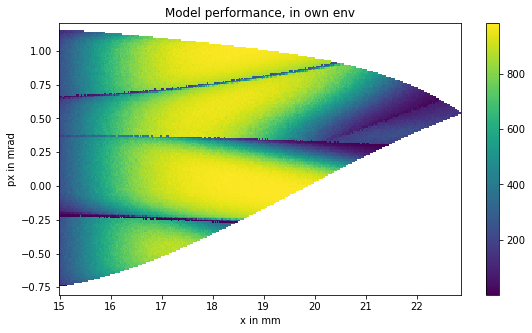

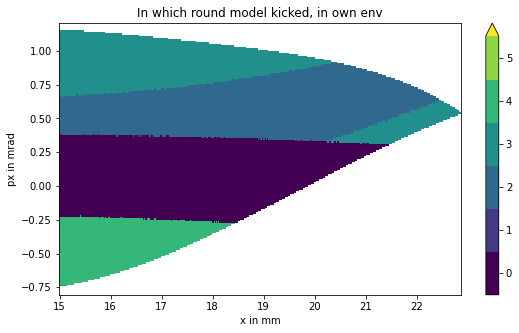

In [11]:
show_plots(Z, Z_round)

In [4]:
import torch as th
from torch import nn

from stable_baselines3.common.torch_layers import BaseFeaturesExtractor



#used feature extractor/ function that transforms the histogram plot to a 4dim vector
class CustomCombinedExtractor(BaseFeaturesExtractor):
    
    #modified code from https://stable-baselines3.readthedocs.io/en/master/guide/custom_policy.html#custom-feature-extractor
    def __init__(self, observation_space: gym.spaces.Dict):
        # We do not know features-dim here before going over all the items,
        # so put something dummy for now. PyTorch requires calling
        # nn.Module.__init__ before adding modules
        super().__init__(observation_space, features_dim=1)

        extractors = {}

        total_concat_size = 0
        # We need to know size of the output of this extractor,
        # so go over all the spaces and compute output feature sizes
        for key, subspace in observation_space.spaces.items():
            if key == "image":
                # We assume CxHxW images (channels first)
                # Assume the image is single-channel (subspace.shape[0] == 1)
                extractors[key] = nn.Sequential(
                        nn.Conv2d(1, 8, kernel_size=6, stride=2, padding=0),
                        nn.ReLU(),
                        nn.MaxPool2d(2),
                        nn.Conv2d(8, 4, kernel_size=3, stride=1, padding=0),
                        nn.ReLU(),
                        nn.MaxPool2d(2),
                        nn.Conv2d(4, 4, kernel_size=2, stride=1, padding=0),
                        nn.ReLU(),
                        nn.Conv2d(4, 2, kernel_size=2, stride=1, padding=0),
                        nn.ReLU(),
                        nn.Flatten(),
                        nn.Linear(8,4),
                    )
                
                # Compute shape by doing one forward pass
                with th.no_grad():
                    n_flatten = extractors[key](
                        th.as_tensor(observation_space.sample()["image"][None]).float()
                    ).shape[1]

                total_concat_size += n_flatten

            elif key == "x,px mean":
                # Run through Identity
                extractors[key] = nn.Identity()
                total_concat_size += 2
            elif key == "round":
                # Run through Identity
                extractors[key] = nn.Identity()
                total_concat_size += 1
                
        self.extractors = nn.ModuleDict(extractors)
        

        # Update the features dim manually
        self._features_dim = total_concat_size
        
        
    def forward(self, observations) -> th.Tensor:
        encoded_tensor_list = []

        # self.extractors contain nn.Modules that do all the processing.
        for key, extractor in self.extractors.items():
            encoded_tensor_list.append(extractor(observations[key]))
        # Return a (B, self._features_dim) PyTorch tensor, where B is batch dimension.
        return th.cat(encoded_tensor_list, dim=1)

In [5]:
def train(batch_size,learning_rate,noise_std,size_pi,size_qf,duration,gamma = 0.975,learning_starts=100,
           reward_design_1 = 5, reward_design_2 = 5):
    #Special Inputs: -duration in hours
    #                -size_pi and size_qf as indicies for network_sizes list
    
    env = gym.make('NLK_Env-v0',reward_design_1=reward_design_1,reward_design_2=reward_design_2) #create env
    
    action_noise = OrnsteinUhlenbeckActionNoise(mean=np.zeros(n_actions),     #set action noise
                                                sigma=noise_std*np.ones(n_actions))

    policy_kwargs = dict(features_extractor_class=CustomCombinedExtractor,     #set feature extractor and 
                         net_arch=dict(pi=network_sizes[size_pi],     #policy network
                                       qf=network_sizes[size_qf]))    #value function

    model = TD3("MultiInputPolicy", env, action_noise=action_noise, verbose=1, learning_rate=learning_rate,
                    batch_size=batch_size, gamma=gamma, policy_kwargs=policy_kwargs,learning_starts=learning_starts,#2000,
                buffer_size=20000)

    env = model.get_env()

    a = time.time()
    while time.time()-a<60*60*duration:
        model.learn(total_timesteps=2000, log_interval=3000)
    return model

Here we already knew good hyperparameters and searched for the best model

The best found model is found under number 16

---------------------
0
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 573.7361888028759


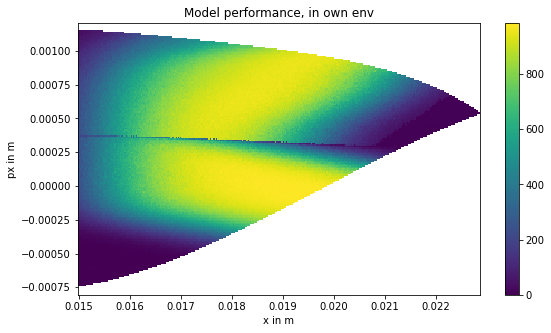

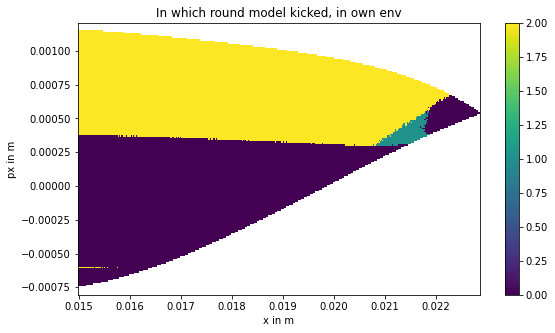

---------------------
1
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 564.6442682669243


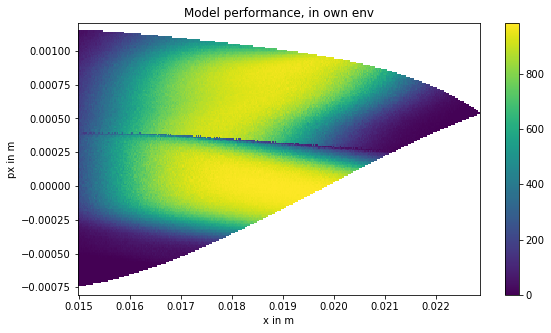

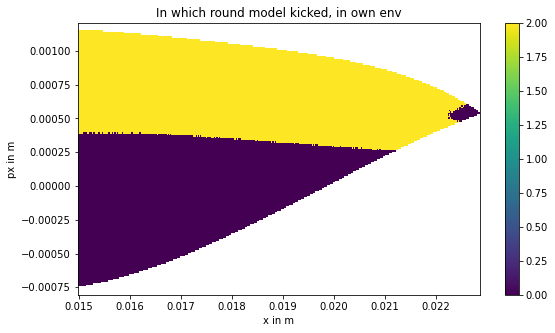

---------------------
2
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 567.0727250897933


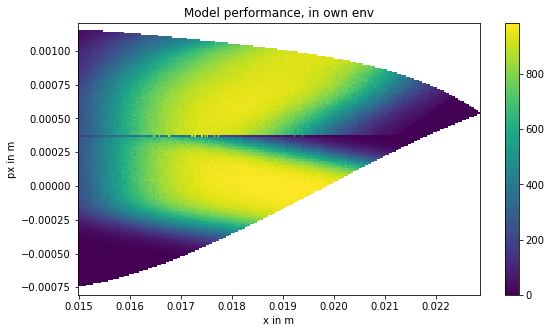

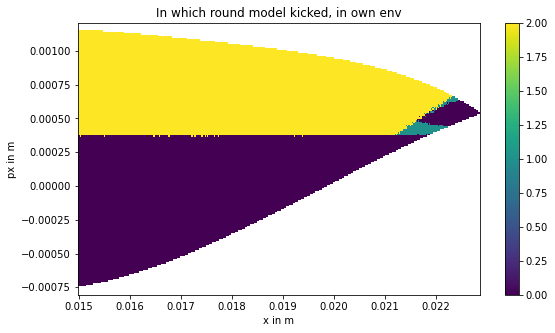

---------------------
3
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 377.6989252214419


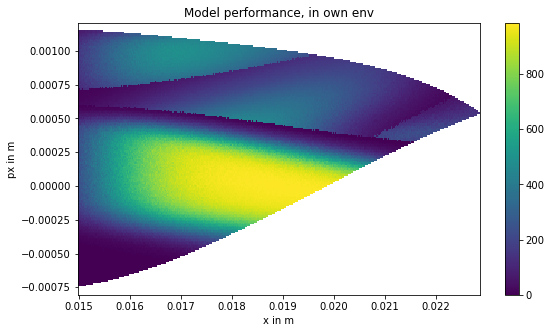

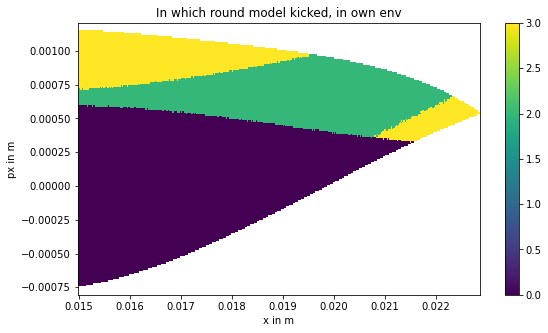

---------------------
4
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 574.6868861416482


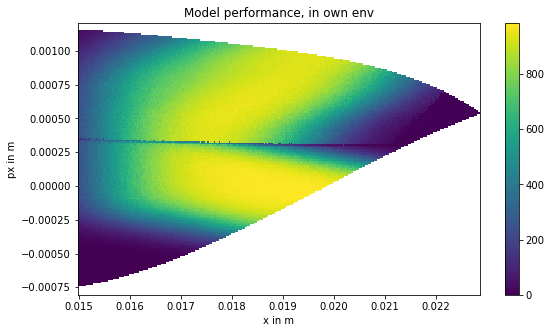

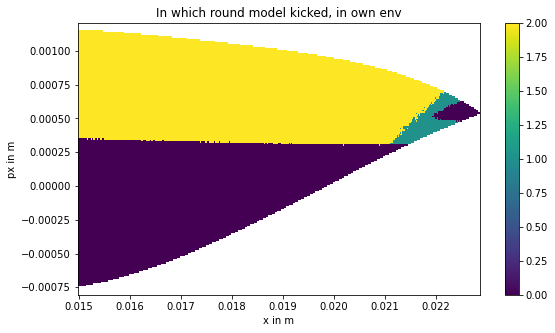

---------------------
5
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 565.8471393894683


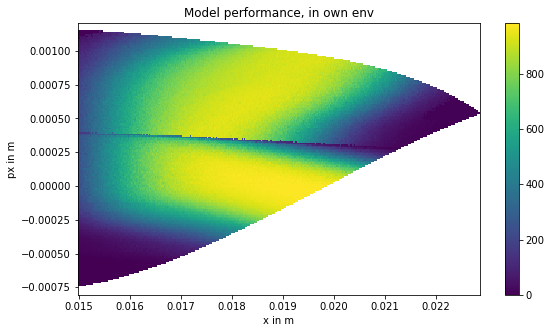

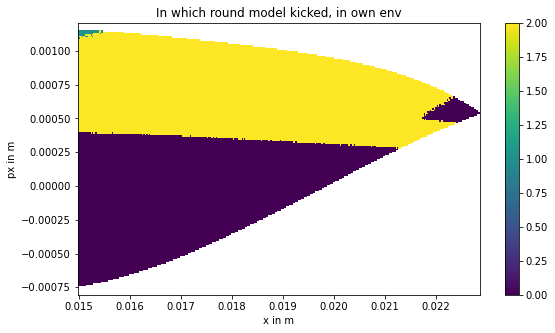

---------------------
6
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 563.7155100659913


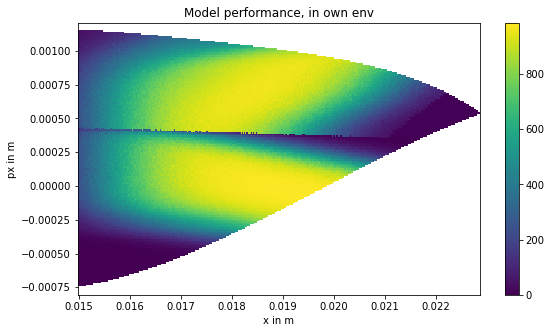

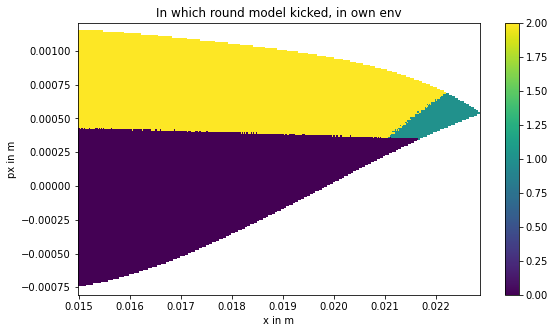

---------------------
7
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 578.7499636111119


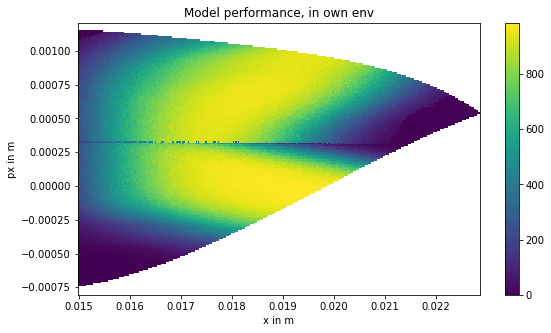

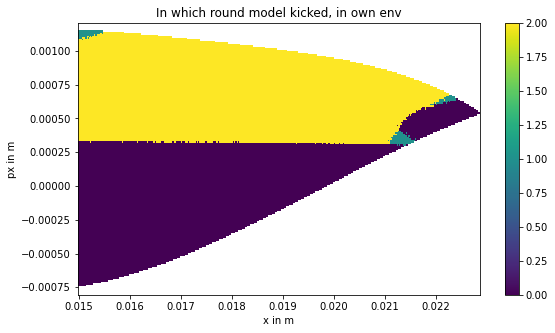

---------------------
8
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 574.1149140049514


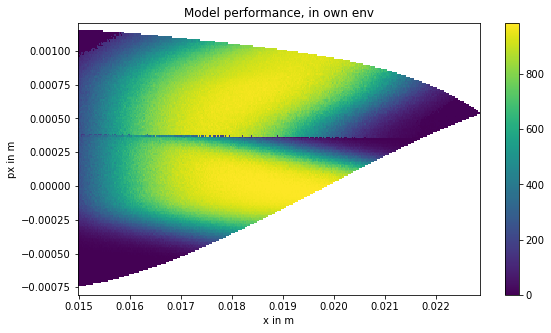

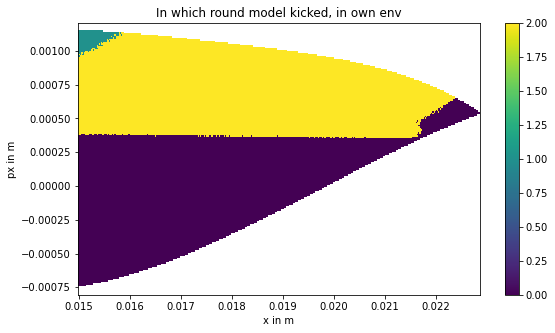

---------------------
9
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 575.5432273882789


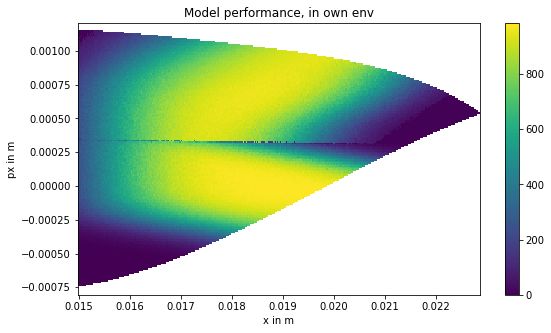

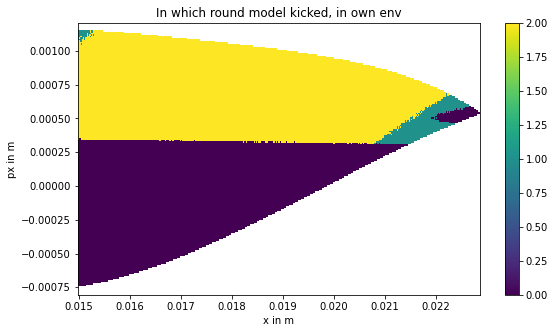

---------------------
10
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 582.9668765814552


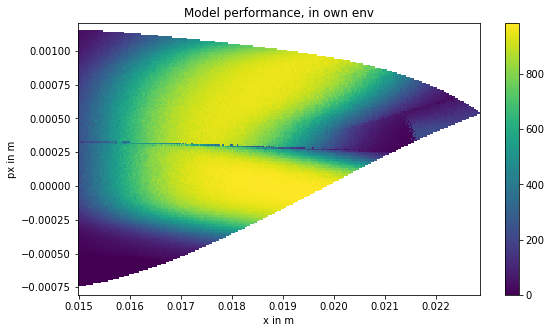

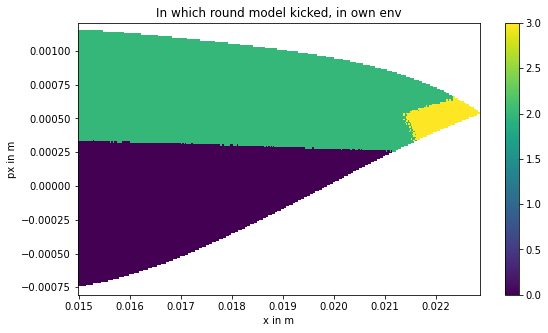

---------------------
11
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 562.2007117544019


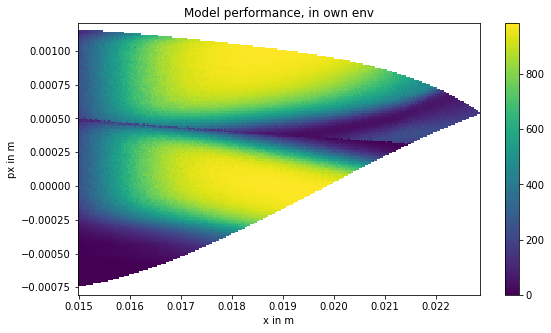

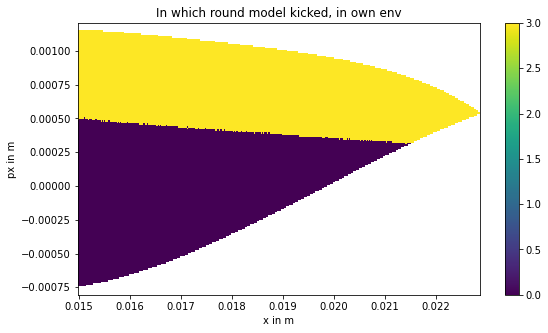

---------------------
12
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 576.3614599322855


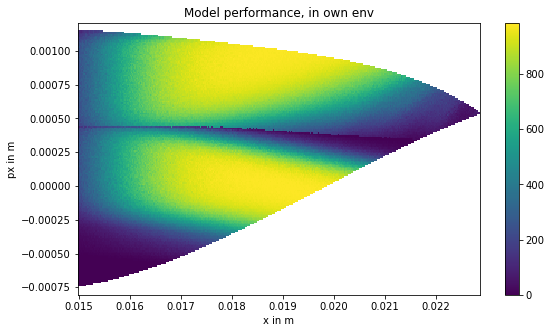

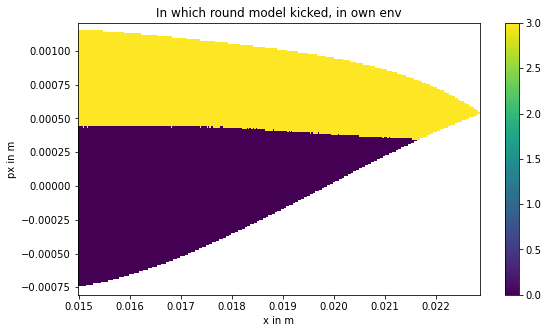

---------------------
13
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 575.1751481329374


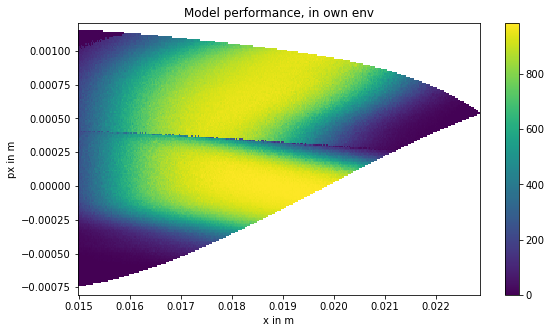

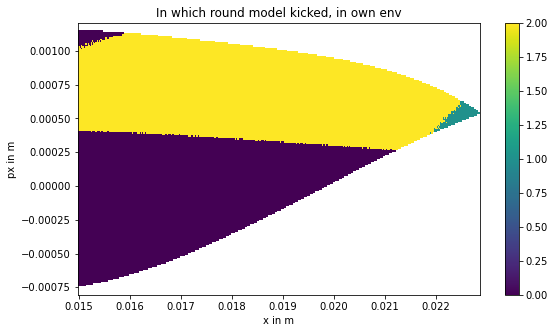

---------------------
14
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 567.4581317637374


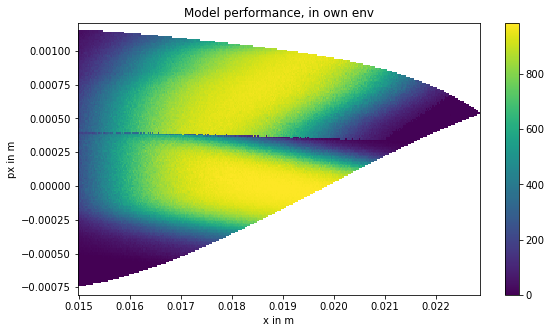

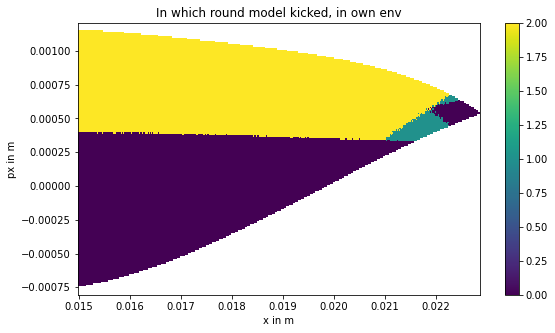

---------------------
15
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 570.9883287786669


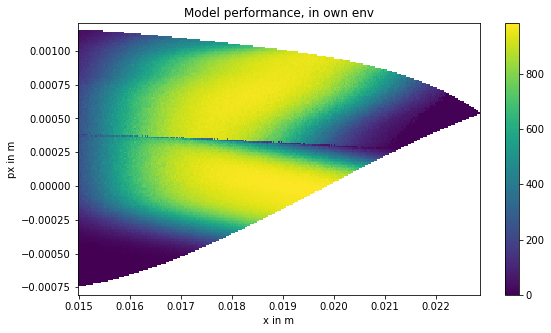

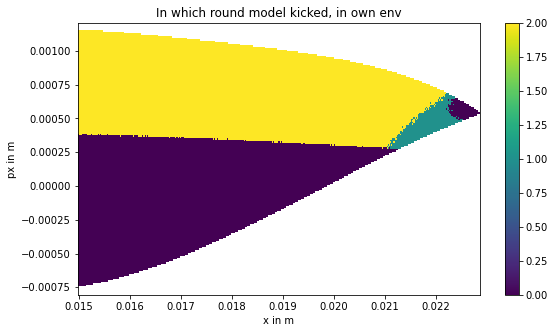

---------------------
16
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 644.4581819845441


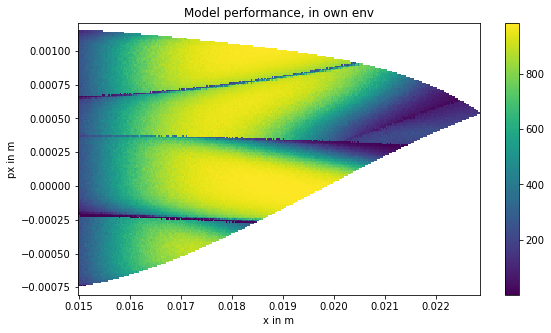

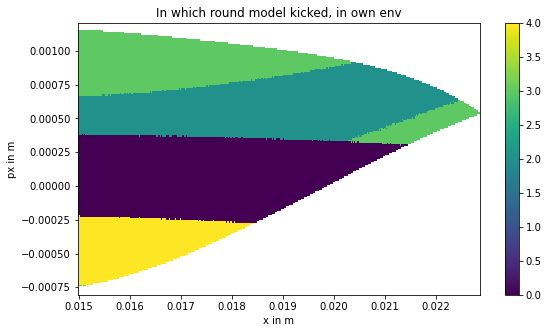

---------------------
17
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 583.8230682922696


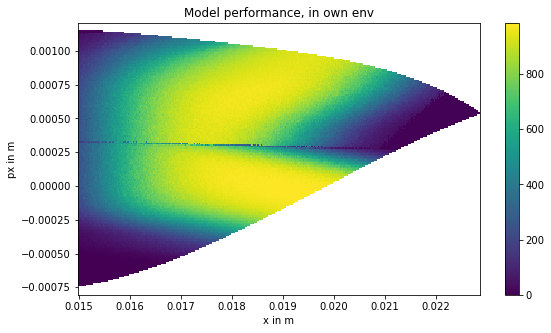

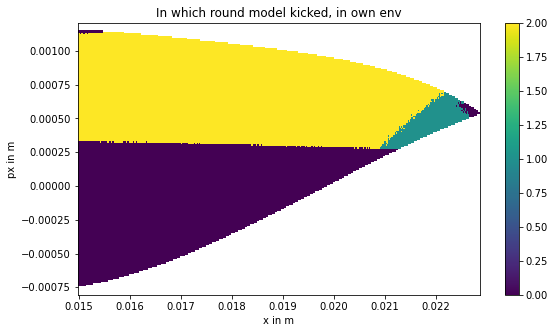

---------------------
18
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 562.1093185823474


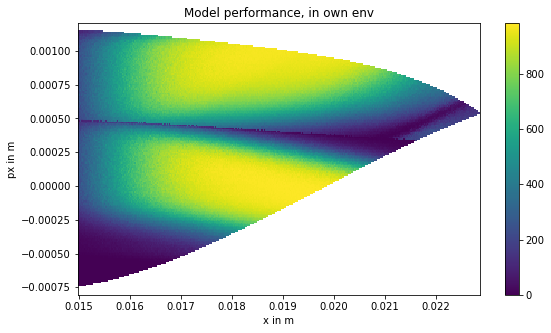

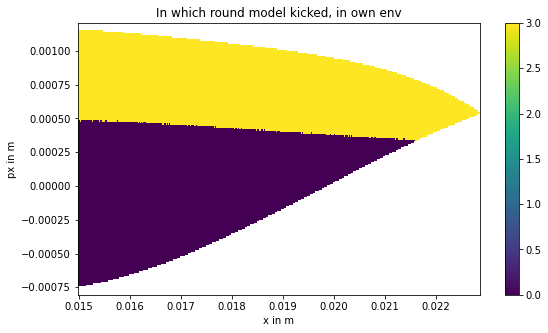

---------------------
19
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 573.4325485706067


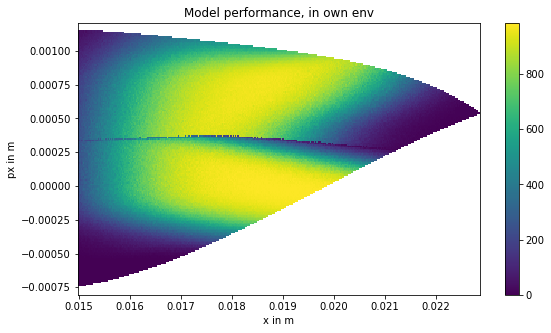

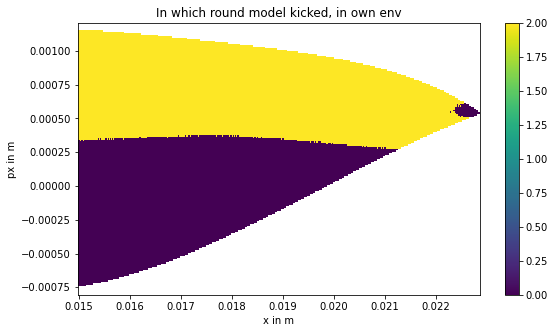

---------------------
20
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 568.024342743748


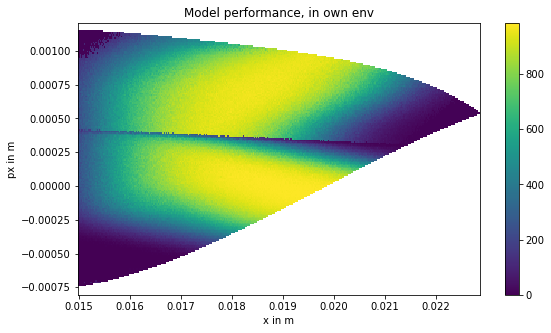

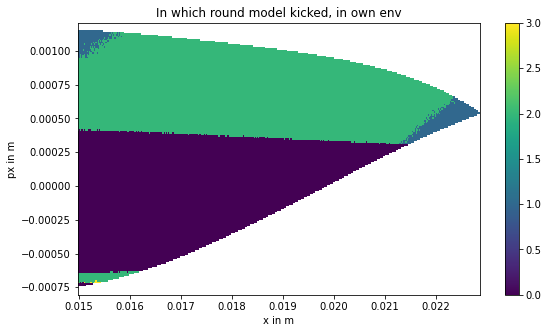

---------------------
21
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 578.0799768539737


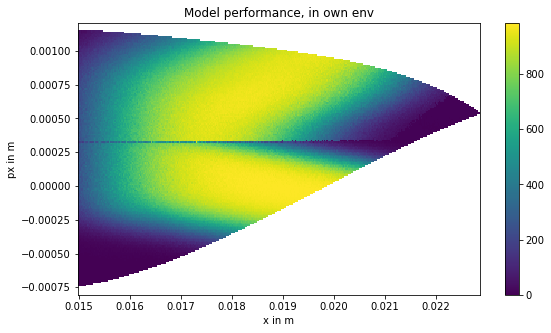

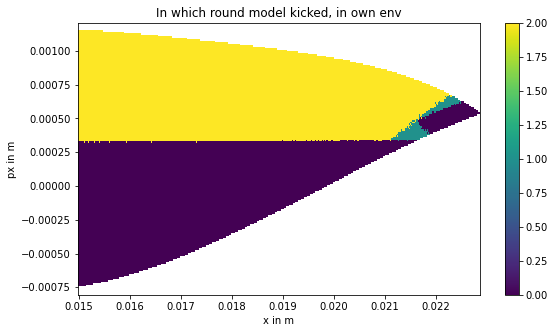

---------------------
22
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 575.7437135838413


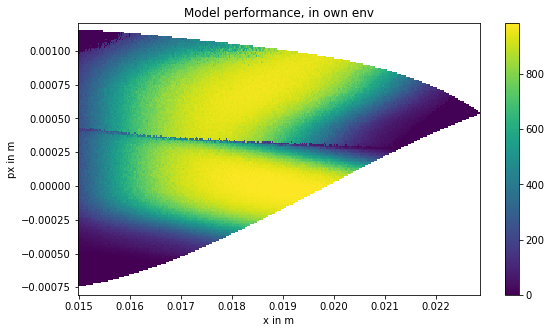

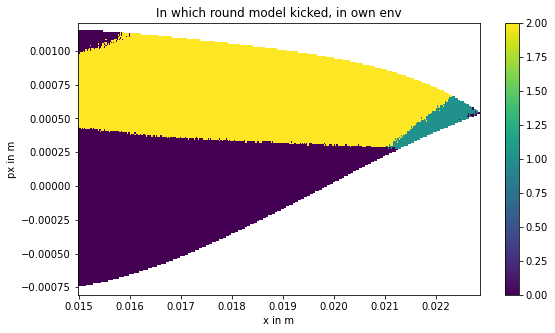

---------------------
23
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 574.33801905459


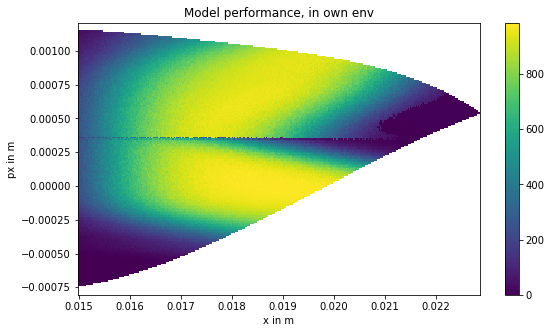

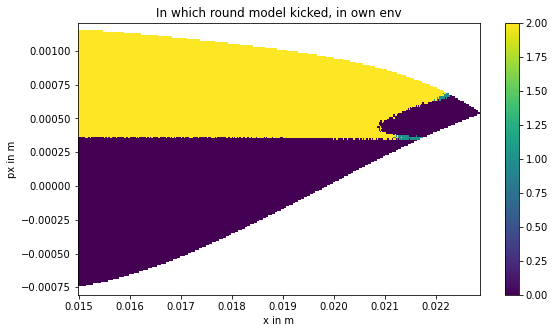

---------------------
24
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 568.0287301177354


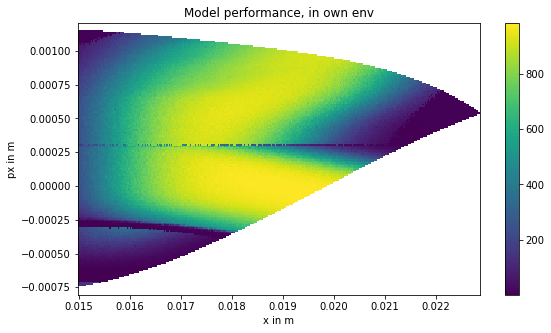

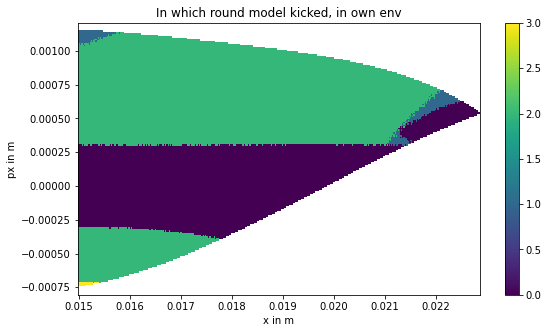

In [8]:
for i in range(25):
    print("---------------------")
    print(i)
    print("---------------------")
    model = train(batch_size=64,learning_rate=.00046453846866,
                  noise_std=0.841144933,size_pi=4,size_qf=1,duration=1/6,gamma = 1.46317271412,learning_starts=250,
                 reward_design_1=11.12917,reward_design_2=6.6716049)
    
    value, Z, Z_round = model_performance(model, deterministic = True)
    print("Value:",value)
    if value>600:
        model.save(f"models/TD3/best1000_v5_10m_number{i}")  
    show_plots(Z, Z_round)

## Hyperparameter search! ##

In [5]:
from hyperopt import hp, fmin, tpe, STATUS_OK, Trials, trials_from_docs

In [6]:
space = {'noise_std': hp.uniform ('noise_std', 0, 1),    #search space
        "learning_rate" : hp.uniform ('learning_rate', 1e-6, 5e-3),
        'batch_size' : hp.choice('batch_size', [3,5,8,12,16,32,64]),
        'pi_NN' : hp.choice('pi_NN', network_sizes),
        'qf_NN' : hp.choice('qf_NN', network_sizes),
        'gamma': hp.uniform ('gamma', 0, 1),
        'learning_starts' : hp.choice('learning_starts', [0,100,250,1000,2500,5000,10000,25000]),
        }

In [7]:
def worker(space):
    env = gym.make('NLK_Env-v0')
    
    action_noise = OrnsteinUhlenbeckActionNoise(mean=np.zeros(n_actions), 
                                                sigma=space["noise_std"]*np.ones(n_actions))
    

    pi_NN = space["pi_NN"]
    qf_NN = space["qf_NN"]
    
    policy_kwargs = dict(features_extractor_class=CustomCombinedExtractor,
                         net_arch=dict(pi=pi_NN, qf=qf_NN))
    
    
    
    model = TD3("MultiInputPolicy", env, action_noise=action_noise, verbose=1, 
                learning_rate=space["learning_rate"],batch_size=space["batch_size"], 
                gamma=space["gamma"],learning_starts = space["learning_starts"], 
                policy_kwargs=policy_kwargs, buffer_size=20000)
    
    env = model.get_env()
    
    a = time.time()
    
    while time.time()-a<60*60*(1/6):#train for 10 minutes
        model.learn(total_timesteps=2000, log_interval=3000)

    value, Z, Z_round = model_performance(model)
    
    print("Plot for value", value)
    if value>480:
        show_plots(Z, Z_round)
        
    return value


def objective(space):
    values = []
    for runde_worker in range(5):
        #each hyperparameter we train 5 times, to minimise variance
        werte = worker(space)
        values += [werte]
        print(values)
        if np.mean(values) < (runde_worker+1)*50:   #break earlier, in case performance is very bad
            print("BREAK",np.mean(values),(runde_worker+1)*50)
            break
                
            
    accuracy = np.mean(values)/100    #value
    
    # We aim to maximize accuracy, therefore we return it as a negative value
    return {'loss': -accuracy, 'action_info': {'performances': values},
            'status': STATUS_OK }
    

In [8]:
# from https://github.com/hyperopt/hyperopt/issues/267
import pickle
import os 
file_name = "NLK1000_model3.hyperopt"

def run_trials():

    trials_step = 1  # how many additional trials to do after loading saved trials. 1 = save after iteration
    max_trials = 1  # initial max_trials. put something small to not have to wait
    
    try:  # try to load an already saved trials object, and increase the max
        trials = pickle.load(open(file_name, "rb"))
        print("Found saved Trials! Loading...")
        
        max_trials = len(trials.trials) + trials_step
        print("Rerunning from {} trials to {} (+{}) trials".format(len(trials.trials), max_trials, trials_step))
    except:  # create a new trials object and start searching
        print("Creating new Trial")
        trials = Trials()

    best = fmin(fn = objective,
            space = space,
            algo = tpe.suggest,
            max_evals = max_trials,
            trials = trials)

    print("Run:", best)

    #print(trials.trials)
    with open(file_name, "wb") as f:
        pickle.dump(trials, f)

Found saved Trials! Loading...
Rerunning from 29 trials to 30 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
499.8091215451859                                      
 97%|█████████▋| 29/30 [12:49<?, ?trial/s, best loss=?]

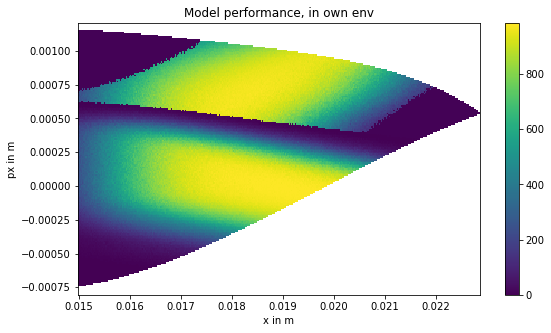

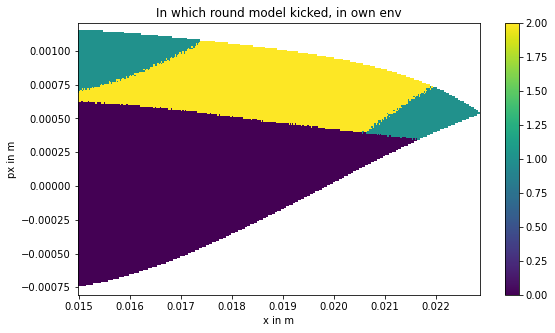

[499.8091215451859]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
547.5747019664987                                      
 97%|█████████▋| 29/30 [25:28<?, ?trial/s, best loss=?]

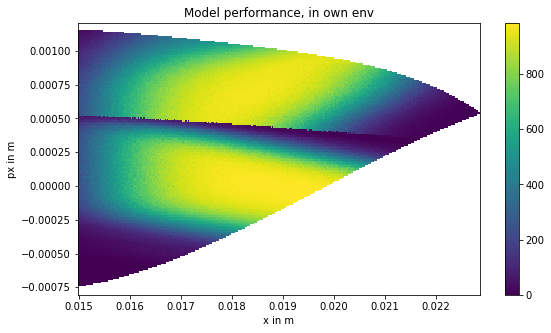

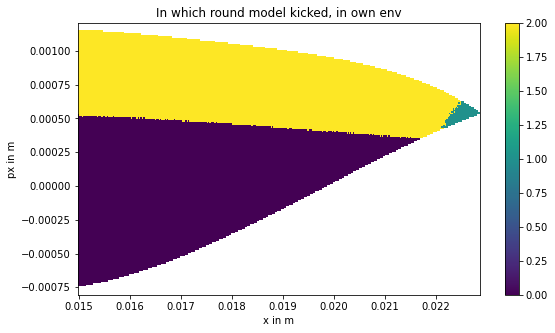

[499.8091215451859, 547.5747019664987]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
436.80167127637685                                     
[499.8091215451859, 547.5747019664987, 436.80167127637685]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
479.11176590484257                                     
[499.8091215451859, 547.5747019664987, 436.80167127637685, 479.11176590484257]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
506.14949002057284    

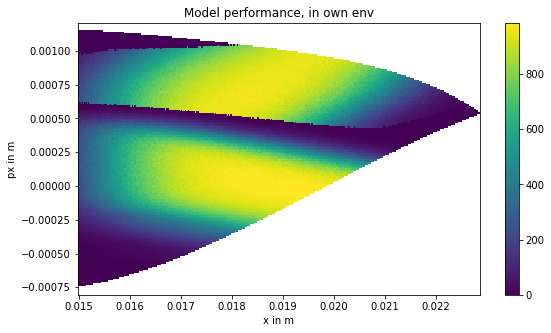

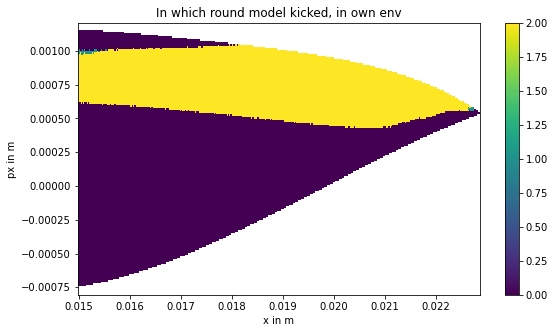

[499.8091215451859, 547.5747019664987, 436.80167127637685, 479.11176590484257, 506.14949002057284]
100%|██████████| 30/30 [1:02:59<00:00, 3779.73s/trial, best loss: -5.193607225634814]
Run: {'batch_size': 3, 'gamma': 0.6893396290534612, 'learning_rate': 0.0010636971842690787, 'learning_starts': 2, 'noise_std': 0.4897044709983944}
Found saved Trials! Loading...
Rerunning from 30 trials to 31 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
503.43892849776626                                     
 97%|█████████▋| 30/31 [12:29<?, ?trial/s, best loss=?]

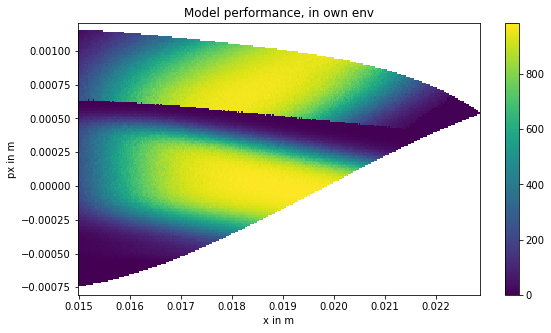

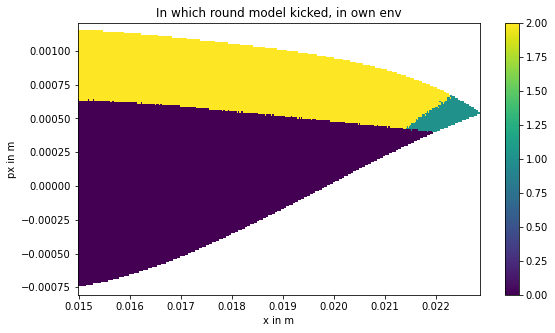

[503.43892849776626]                                   
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
523.978535866594                                       
 97%|█████████▋| 30/31 [24:53<?, ?trial/s, best loss=?]

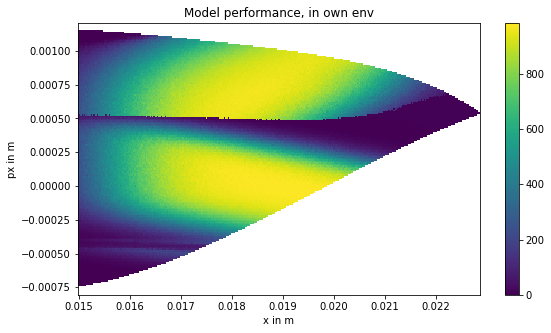

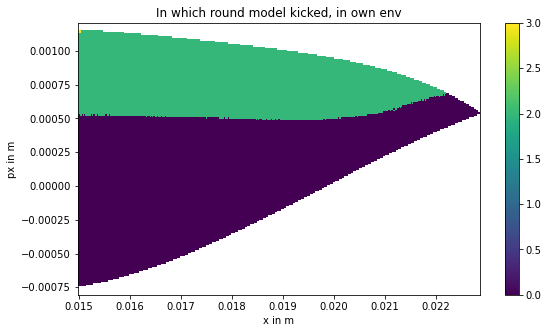

[503.43892849776626, 523.978535866594]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
444.6612508639768                                      
[503.43892849776626, 523.978535866594, 444.6612508639768]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
487.4310095705539                                      
 97%|█████████▋| 30/31 [49:56<?, ?trial/s, best loss=?]

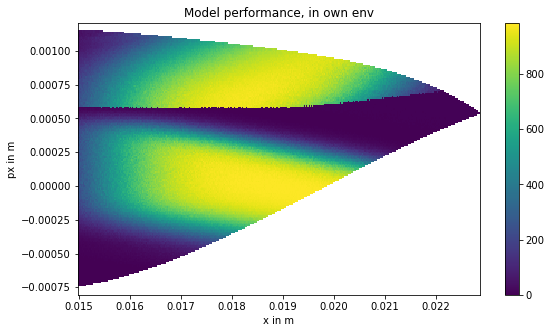

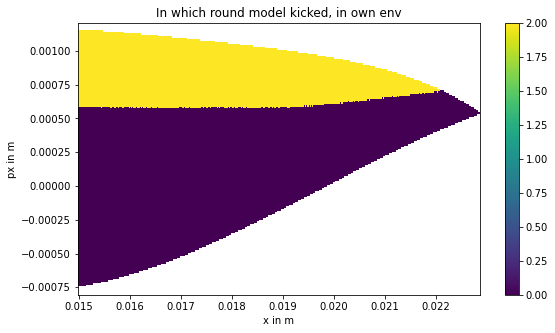

[503.43892849776626, 523.978535866594, 444.6612508639768, 487.4310095705539]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
525.2656697319193                                        
 97%|█████████▋| 30/31 [1:02:36<?, ?trial/s, best loss=?]

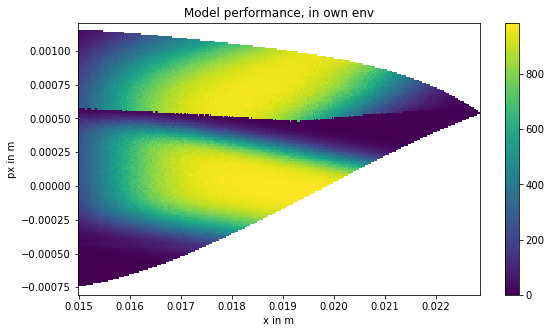

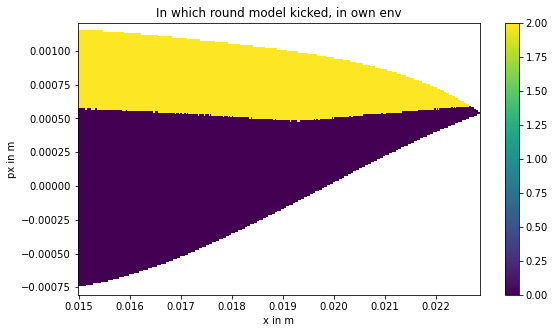

[503.43892849776626, 523.978535866594, 444.6612508639768, 487.4310095705539, 525.2656697319193]
100%|██████████| 31/31 [1:02:36<00:00, 3756.62s/trial, best loss: -5.193607225634814]
Run: {'batch_size': 3, 'gamma': 0.6893396290534612, 'learning_rate': 0.0010636971842690787, 'learning_starts': 2, 'noise_std': 0.4897044709983944}
Found saved Trials! Loading...
Rerunning from 31 trials to 32 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
554.4662903368334                                      
 97%|█████████▋| 31/32 [13:21<?, ?trial/s, best loss=?]

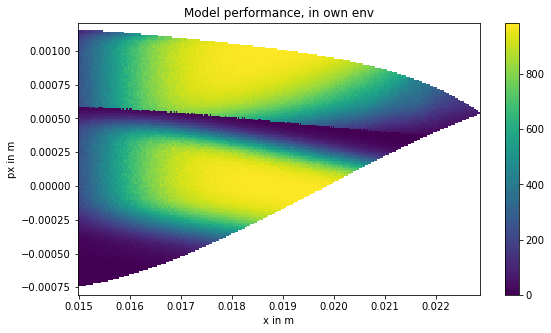

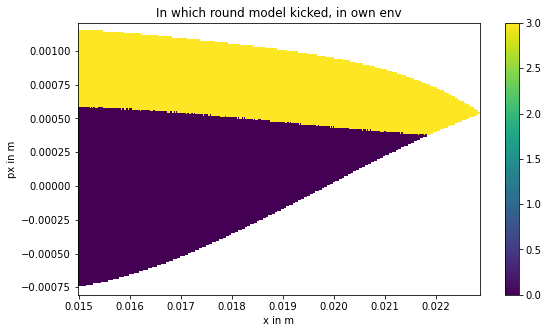

[554.4662903368334]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
532.0592555017633                                      
 97%|█████████▋| 31/32 [26:16<?, ?trial/s, best loss=?]

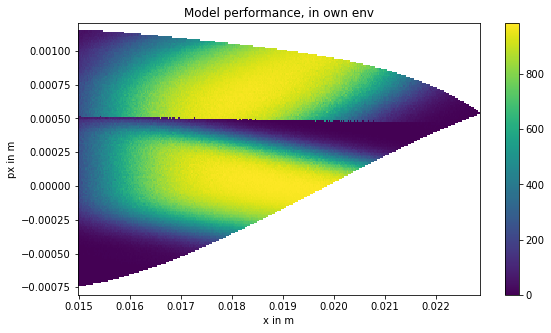

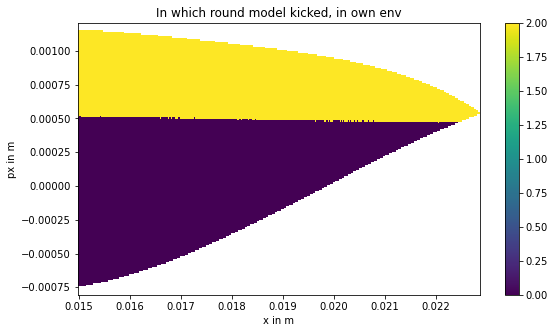

[554.4662903368334, 532.0592555017633]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
537.6967704990956                                      
 97%|█████████▋| 31/32 [39:06<?, ?trial/s, best loss=?]

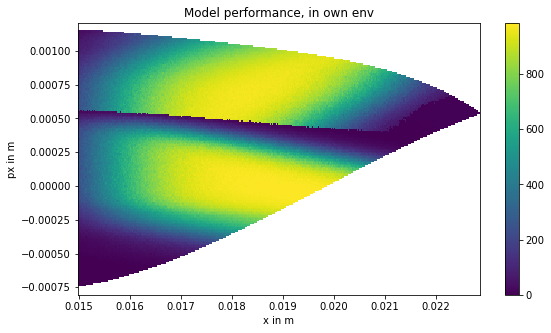

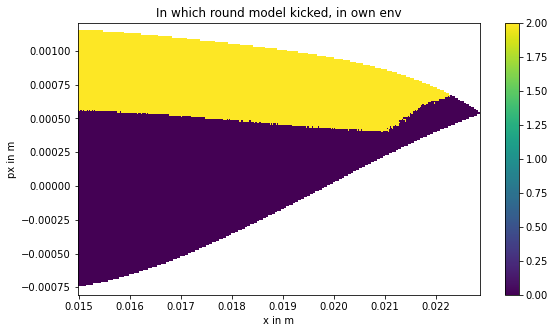

[554.4662903368334, 532.0592555017633, 537.6967704990956]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
560.9259509107262                                      
 97%|█████████▋| 31/32 [51:43<?, ?trial/s, best loss=?]

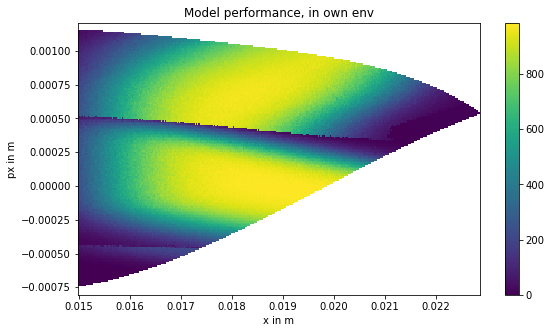

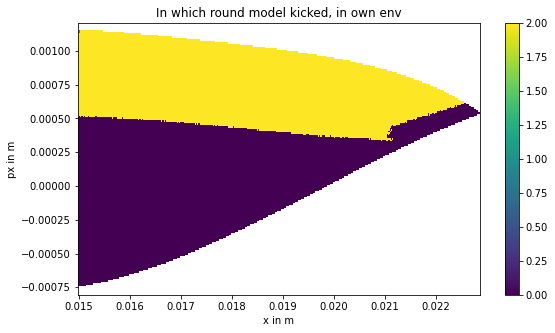

[554.4662903368334, 532.0592555017633, 537.6967704990956, 560.9259509107262]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
505.50992266261034                                       
 97%|█████████▋| 31/32 [1:04:29<?, ?trial/s, best loss=?]

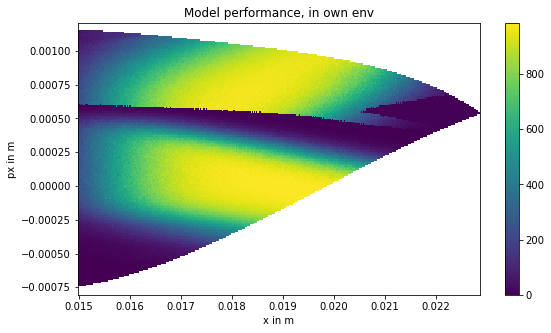

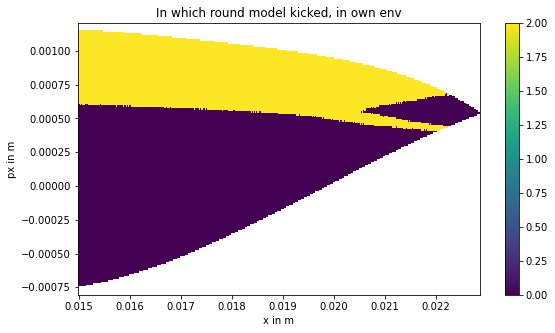

[554.4662903368334, 532.0592555017633, 537.6967704990956, 560.9259509107262, 505.50992266261034]
100%|██████████| 32/32 [1:04:30<00:00, 3870.10s/trial, best loss: -5.381316379822058]
Run: {'batch_size': 5, 'gamma': 0.7895672530235467, 'learning_rate': 0.0017073573000323894, 'learning_starts': 2, 'noise_std': 0.7391095480165667}
Found saved Trials! Loading...
Rerunning from 32 trials to 33 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
533.3729460447007                                      
 97%|█████████▋| 32/33 [12:52<?, ?trial/s, best loss=?]

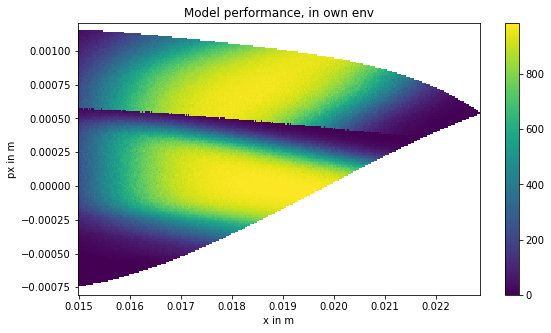

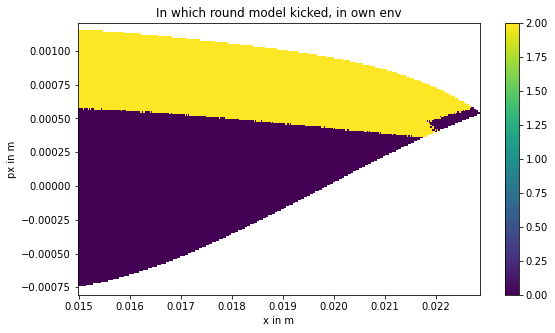

[533.3729460447007]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
515.959939048675                                       
 97%|█████████▋| 32/33 [25:36<?, ?trial/s, best loss=?]

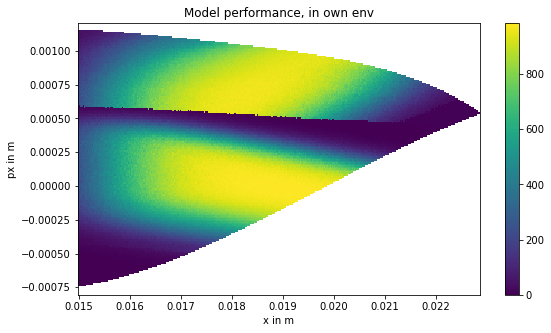

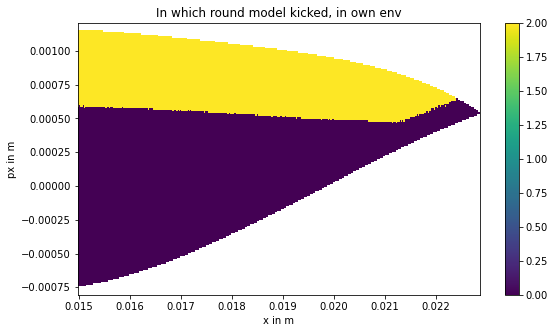

[533.3729460447007, 515.959939048675]                  
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
539.62090633781                                        
 97%|█████████▋| 32/33 [38:32<?, ?trial/s, best loss=?]

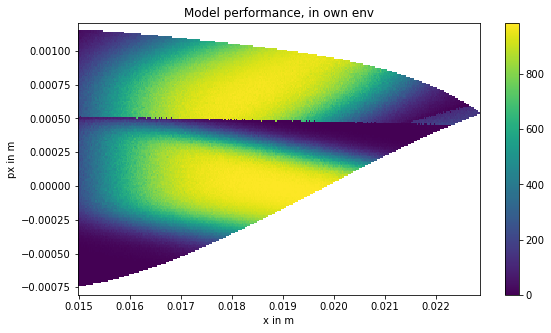

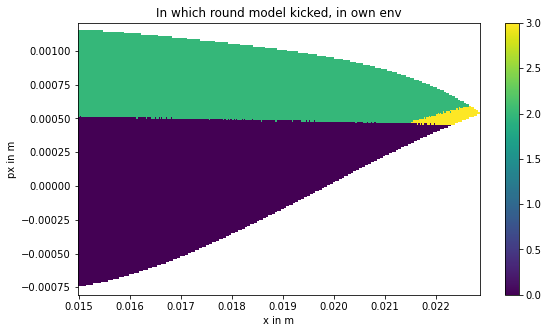

[533.3729460447007, 515.959939048675, 539.62090633781] 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
550.1026309155379                                      
 97%|█████████▋| 32/33 [51:26<?, ?trial/s, best loss=?]

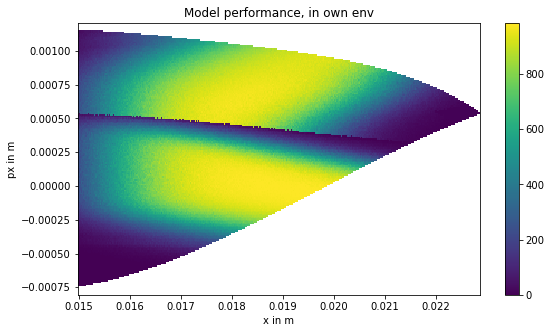

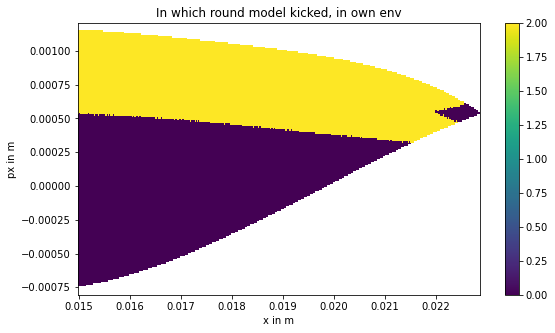

[533.3729460447007, 515.959939048675, 539.62090633781, 550.1026309155379]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
539.0572916577072                                        
 97%|█████████▋| 32/33 [1:03:59<?, ?trial/s, best loss=?]

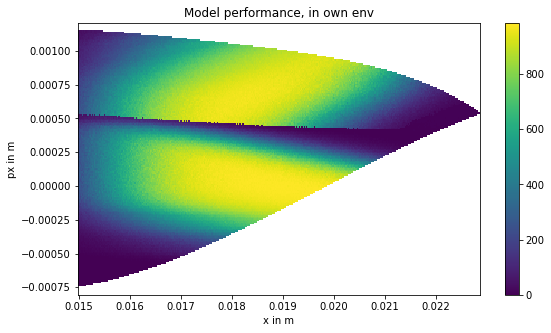

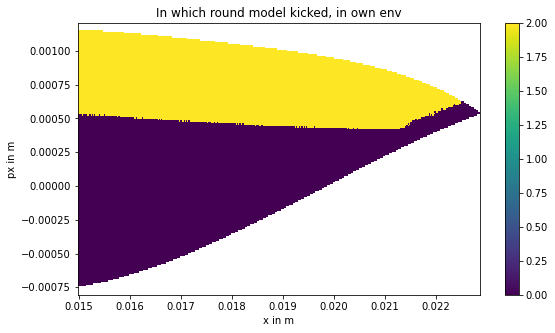

[533.3729460447007, 515.959939048675, 539.62090633781, 550.1026309155379, 539.0572916577072]
100%|██████████| 33/33 [1:03:59<00:00, 3839.65s/trial, best loss: -5.381316379822058]
Run: {'batch_size': 5, 'gamma': 0.7895672530235467, 'learning_rate': 0.0017073573000323894, 'learning_starts': 2, 'noise_std': 0.7391095480165667}
Found saved Trials! Loading...
Rerunning from 33 trials to 34 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
277.13683539070774                                     
[277.13683539070774]                                   
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
544.3485767978189                       

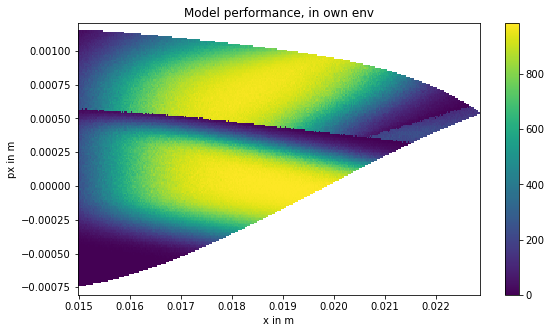

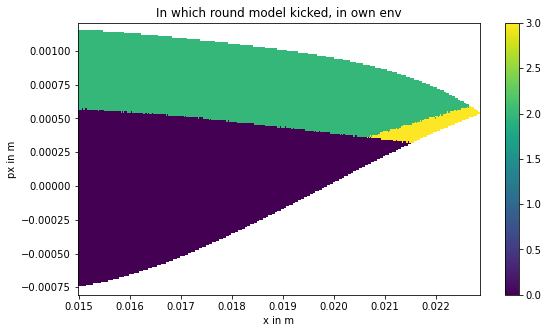

[277.13683539070774, 544.3485767978189]                
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
365.30228396923735                                     
[277.13683539070774, 544.3485767978189, 365.30228396923735]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
406.75100913969953                                     
[277.13683539070774, 544.3485767978189, 365.30228396923735, 406.75100913969953]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
501.60509693506884  

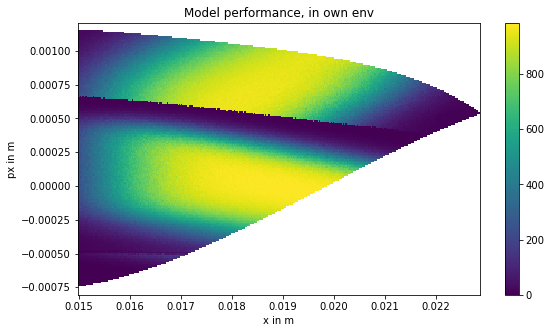

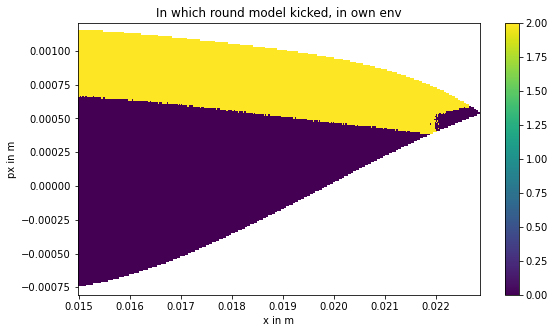

[277.13683539070774, 544.3485767978189, 365.30228396923735, 406.75100913969953, 501.60509693506884]
100%|██████████| 34/34 [1:03:25<00:00, 3805.40s/trial, best loss: -5.381316379822058]
Run: {'batch_size': 5, 'gamma': 0.7895672530235467, 'learning_rate': 0.0017073573000323894, 'learning_starts': 2, 'noise_std': 0.7391095480165667}
Found saved Trials! Loading...
Rerunning from 34 trials to 35 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
568.2049387555799                                      
 97%|█████████▋| 34/35 [12:48<?, ?trial/s, best loss=?]

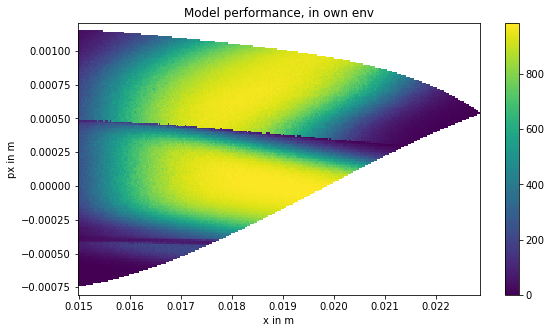

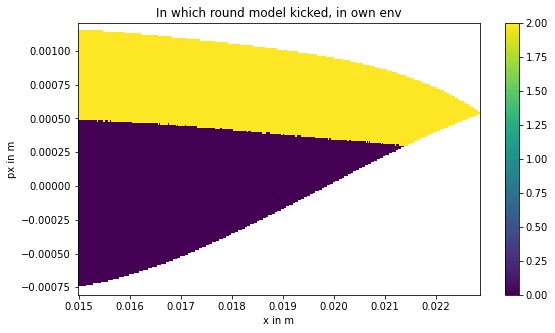

[568.2049387555799]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
566.6015864171874                                      
 97%|█████████▋| 34/35 [25:37<?, ?trial/s, best loss=?]

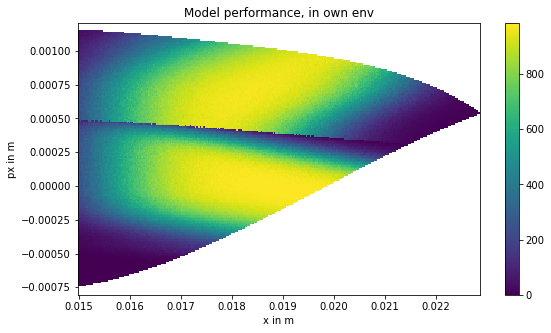

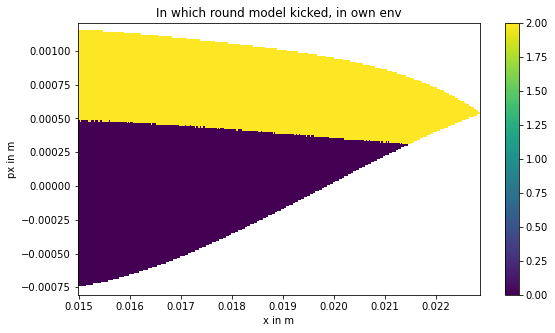

[568.2049387555799, 566.6015864171874]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
552.8113726565488                                      
 97%|█████████▋| 34/35 [38:16<?, ?trial/s, best loss=?]

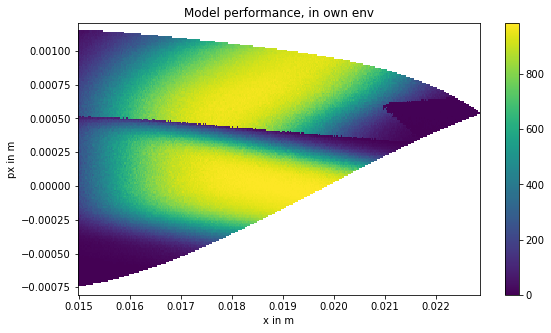

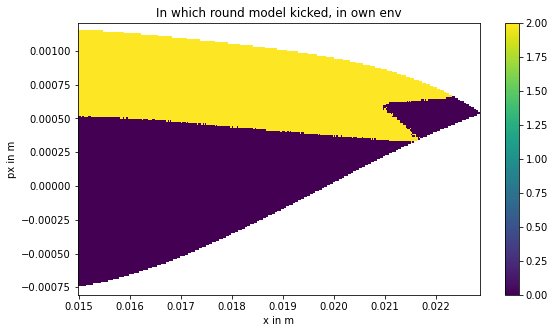

[568.2049387555799, 566.6015864171874, 552.8113726565488]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
557.1031175883573                                      
 97%|█████████▋| 34/35 [51:05<?, ?trial/s, best loss=?]

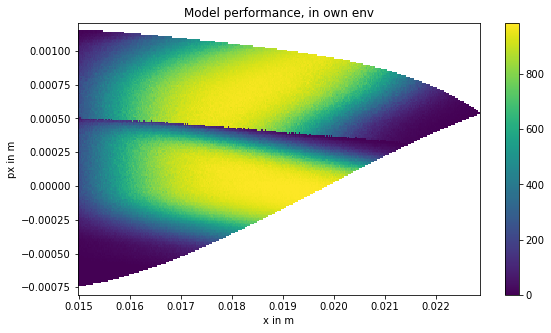

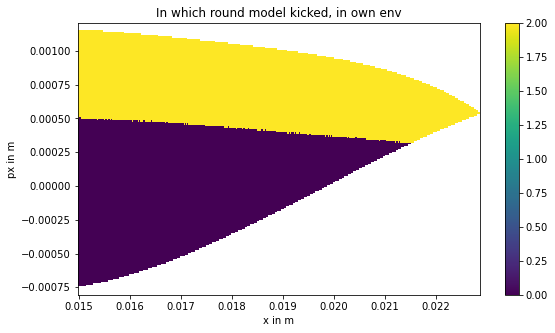

[568.2049387555799, 566.6015864171874, 552.8113726565488, 557.1031175883573]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
524.7075543275057                                        
 97%|█████████▋| 34/35 [1:03:42<?, ?trial/s, best loss=?]

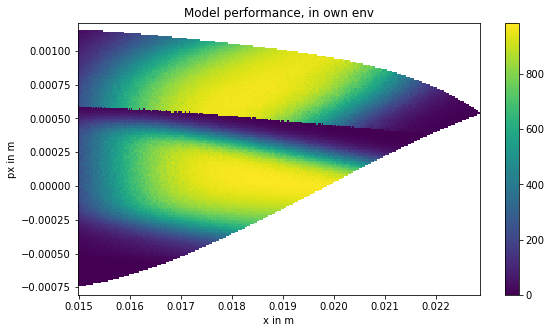

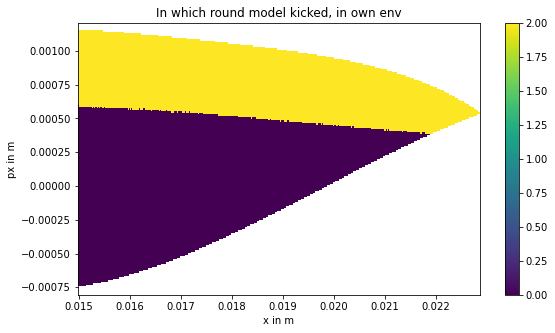

[568.2049387555799, 566.6015864171874, 552.8113726565488, 557.1031175883573, 524.7075543275057]
100%|██████████| 35/35 [1:03:42<00:00, 3822.90s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 35 trials to 36 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
550.8728090454723                                      
 97%|█████████▋| 35/36 [12:47<?, ?trial/s, best loss=?]

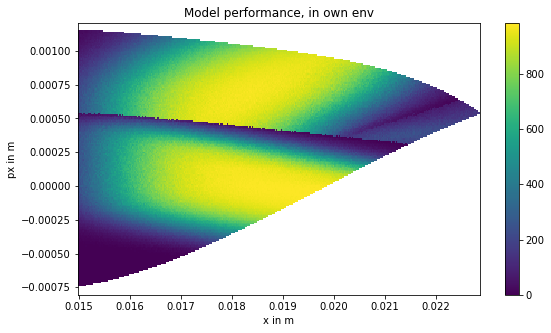

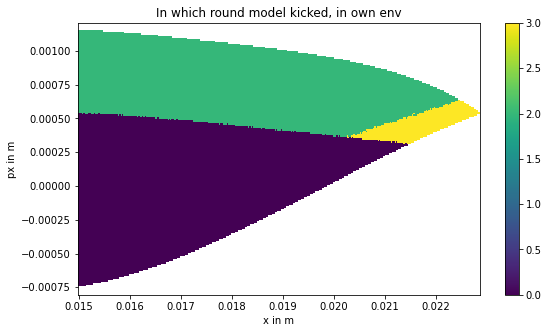

[550.8728090454723]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
529.7573542541872                                      
 97%|█████████▋| 35/36 [25:30<?, ?trial/s, best loss=?]

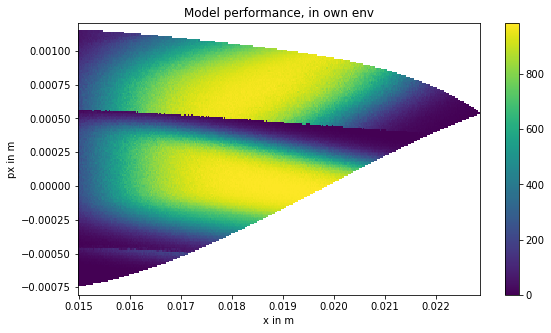

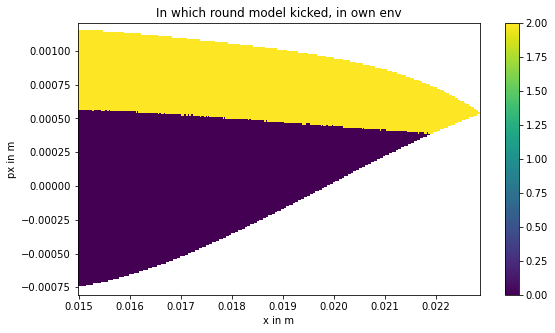

[550.8728090454723, 529.7573542541872]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
543.1605265813996                                      
 97%|█████████▋| 35/36 [38:22<?, ?trial/s, best loss=?]

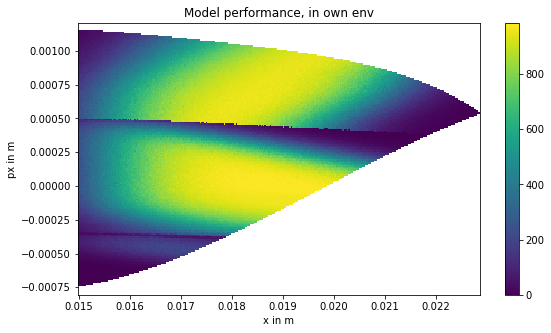

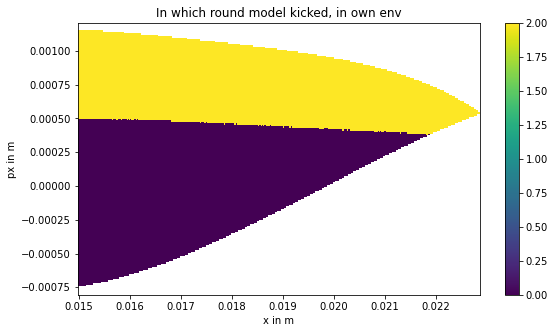

[550.8728090454723, 529.7573542541872, 543.1605265813996]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
558.8326284073958                                      
 97%|█████████▋| 35/36 [51:05<?, ?trial/s, best loss=?]

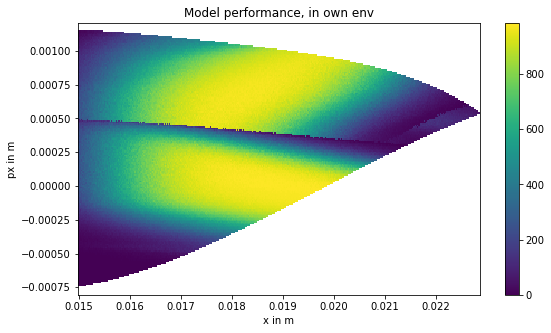

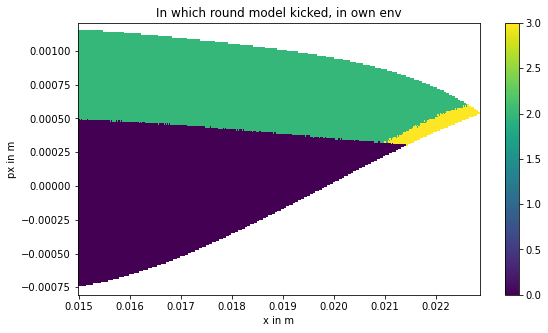

[550.8728090454723, 529.7573542541872, 543.1605265813996, 558.8326284073958]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
553.8435231507789                                        
 97%|█████████▋| 35/36 [1:03:56<?, ?trial/s, best loss=?]

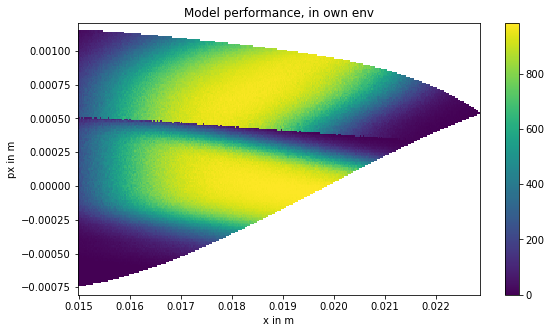

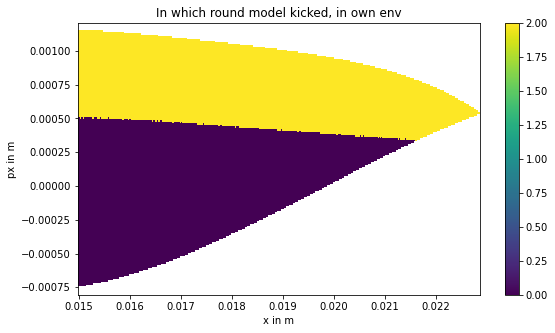

[550.8728090454723, 529.7573542541872, 543.1605265813996, 558.8326284073958, 553.8435231507789]
100%|██████████| 36/36 [1:03:56<00:00, 3836.88s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 36 trials to 37 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
530.5242416743768                                      
 97%|█████████▋| 36/37 [12:49<?, ?trial/s, best loss=?]

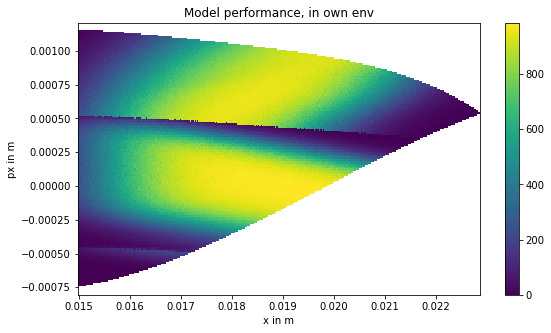

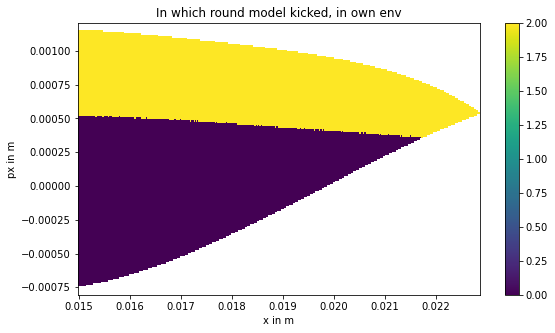

[530.5242416743768]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
533.3039942535567                                      
 97%|█████████▋| 36/37 [25:32<?, ?trial/s, best loss=?]

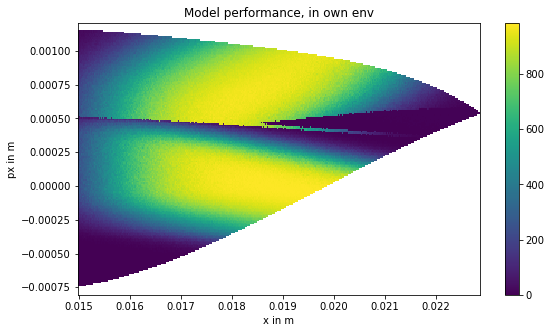

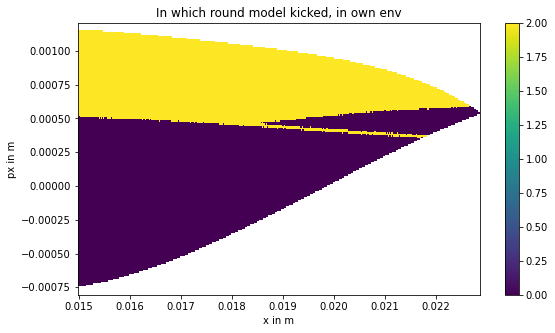

[530.5242416743768, 533.3039942535567]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
532.108161552896                                       
 97%|█████████▋| 36/37 [38:05<?, ?trial/s, best loss=?]

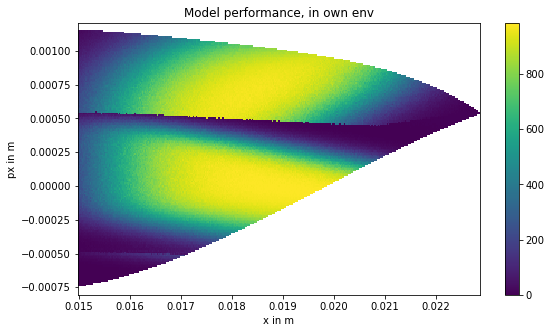

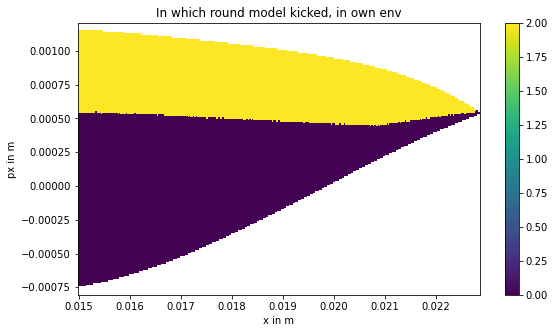

[530.5242416743768, 533.3039942535567, 532.108161552896]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
541.1636390366539                                      
 97%|█████████▋| 36/37 [50:47<?, ?trial/s, best loss=?]

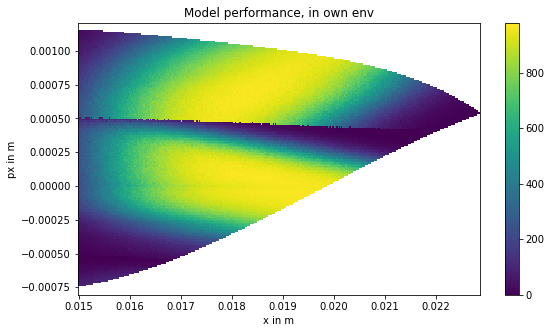

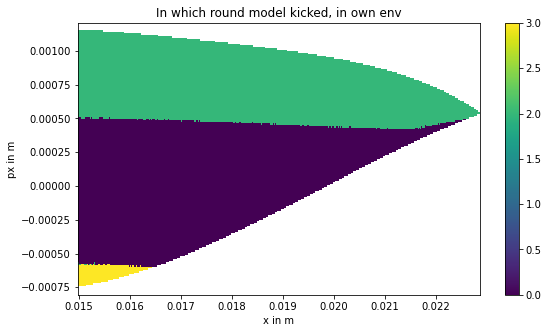

[530.5242416743768, 533.3039942535567, 532.108161552896, 541.1636390366539]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
554.2518046230651                                        
 97%|█████████▋| 36/37 [1:03:33<?, ?trial/s, best loss=?]

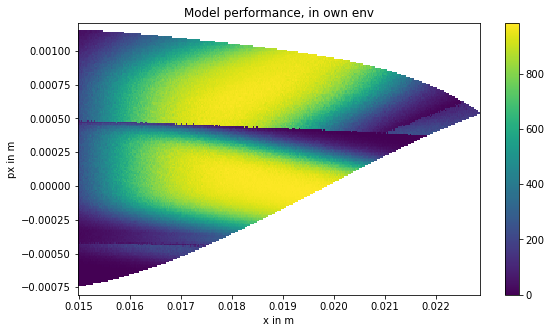

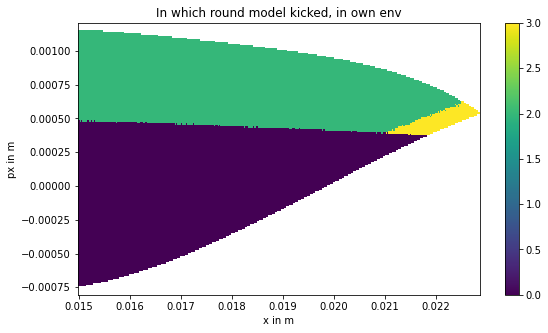

[530.5242416743768, 533.3039942535567, 532.108161552896, 541.1636390366539, 554.2518046230651]
100%|██████████| 37/37 [1:03:34<00:00, 3814.15s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 37 trials to 38 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
451.92555559983947                                     
[451.92555559983947]                                   
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
485.302580015929                      

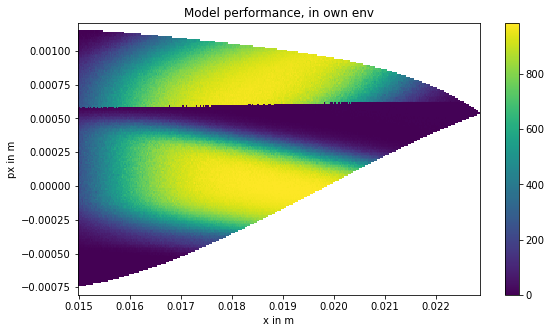

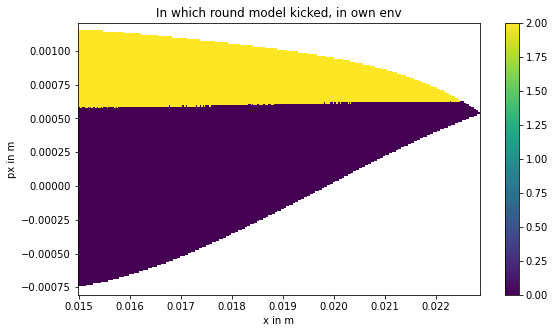

[451.92555559983947, 485.302580015929]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
468.3905319386041                                      
[451.92555559983947, 485.302580015929, 468.3905319386041]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
486.5512375941166                                      
 97%|█████████▋| 37/38 [50:41<?, ?trial/s, best loss=?]

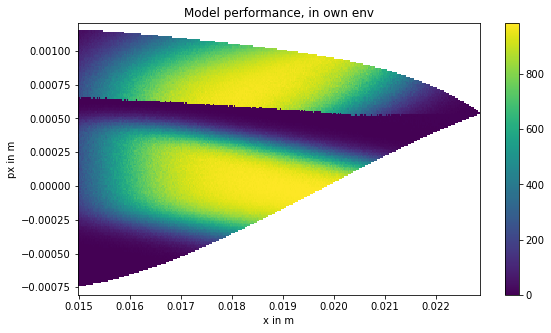

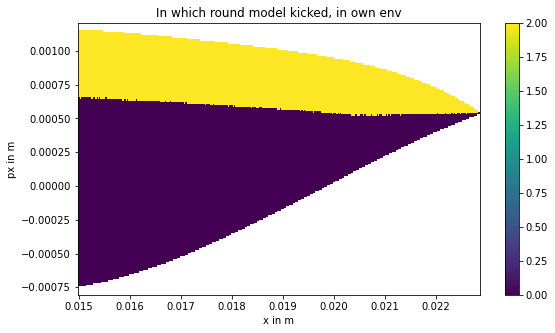

[451.92555559983947, 485.302580015929, 468.3905319386041, 486.5512375941166]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
509.2971868684376                                        
 97%|█████████▋| 37/38 [1:04:32<?, ?trial/s, best loss=?]

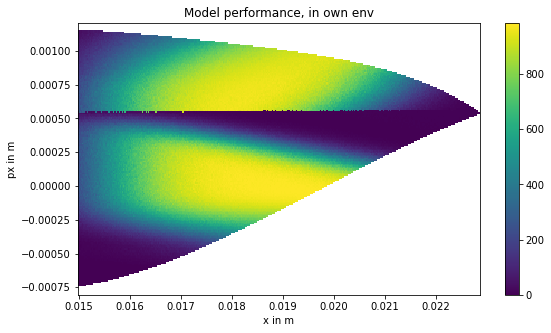

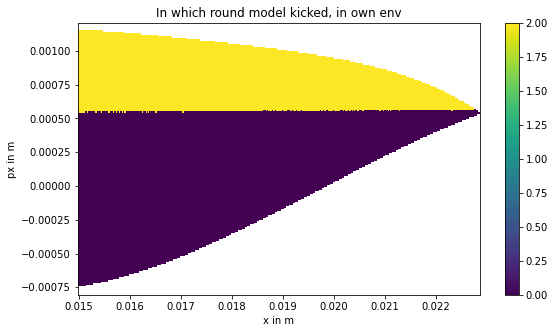

[451.92555559983947, 485.302580015929, 468.3905319386041, 486.5512375941166, 509.2971868684376]
100%|██████████| 38/38 [1:04:33<00:00, 3873.43s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 38 trials to 39 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
528.1105543843278                                      
 97%|█████████▋| 38/39 [13:46<?, ?trial/s, best loss=?]

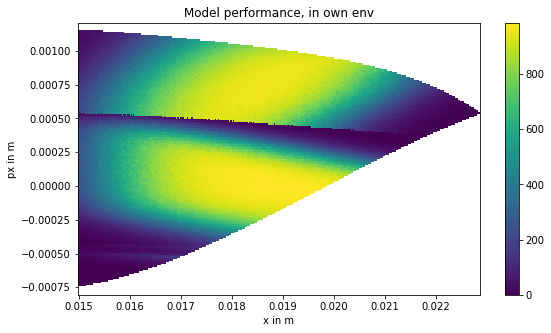

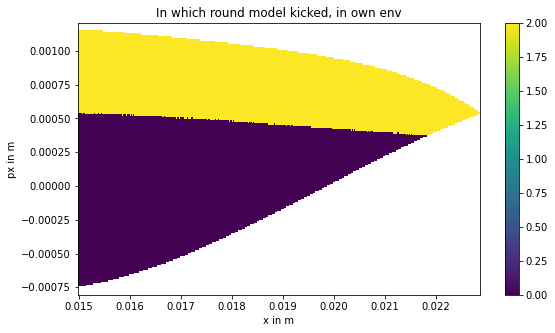

[528.1105543843278]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
529.3608144794041                                      
 97%|█████████▋| 38/39 [27:44<?, ?trial/s, best loss=?]

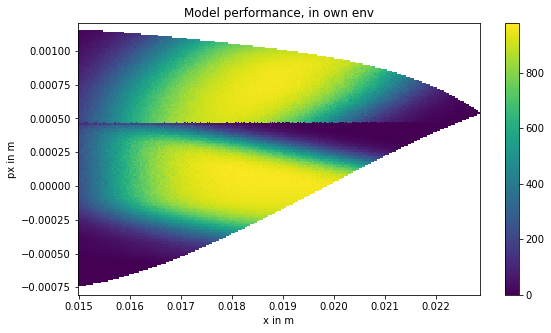

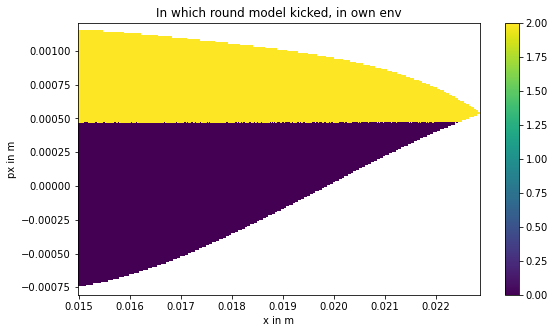

[528.1105543843278, 529.3608144794041]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
529.9546686722937                                      
 97%|█████████▋| 38/39 [41:53<?, ?trial/s, best loss=?]

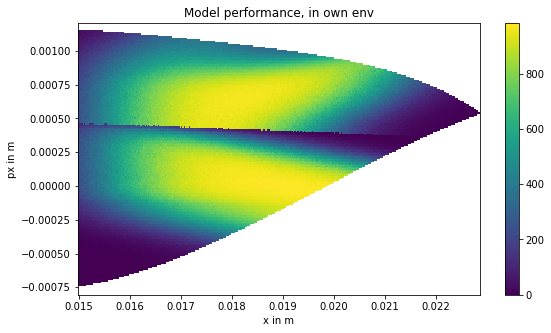

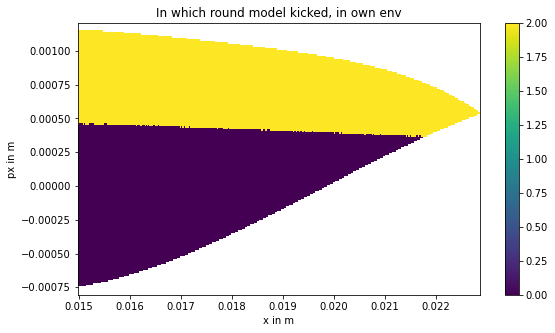

[528.1105543843278, 529.3608144794041, 529.9546686722937]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
527.532585625521                                       
 97%|█████████▋| 38/39 [54:36<?, ?trial/s, best loss=?]

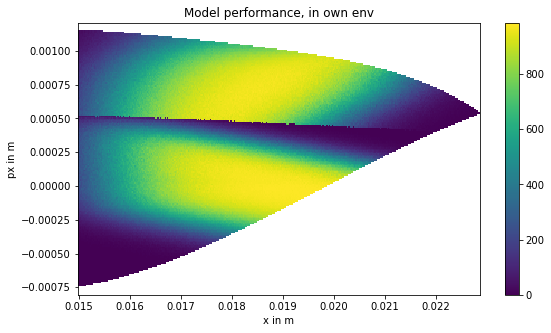

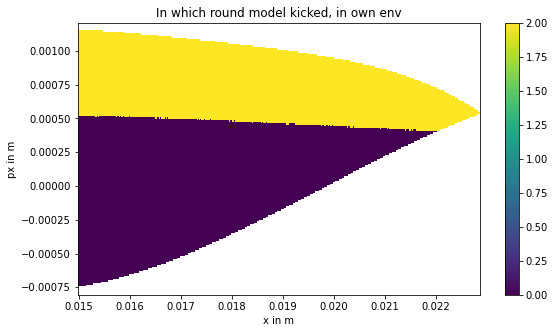

[528.1105543843278, 529.3608144794041, 529.9546686722937, 527.532585625521]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
272.1106611484265                                        
[528.1105543843278, 529.3608144794041, 529.9546686722937, 527.532585625521, 272.1106611484265]
100%|██████████| 39/39 [1:06:12<00:00, 3972.50s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 39 trials to 40 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
524.678636023138

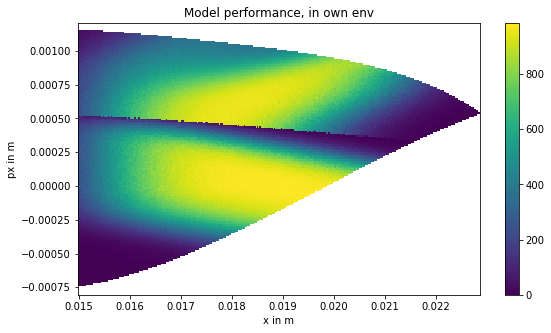

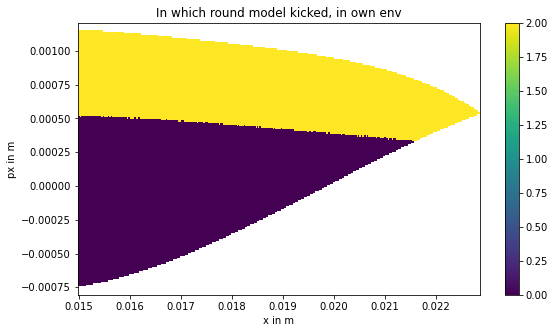

[524.6786360231384]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
541.024954704933                                       
 98%|█████████▊| 39/40 [25:37<?, ?trial/s, best loss=?]

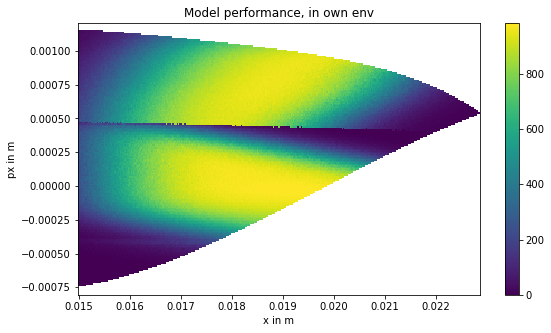

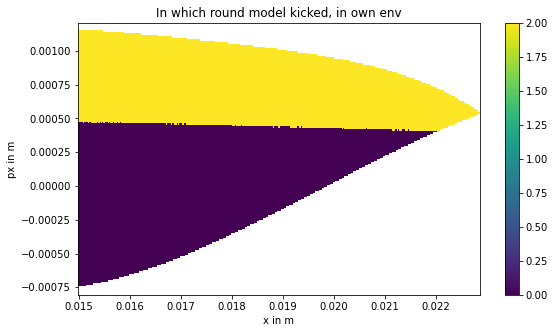

[524.6786360231384, 541.024954704933]                  
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
529.3803955569834                                      
 98%|█████████▊| 39/40 [38:21<?, ?trial/s, best loss=?]

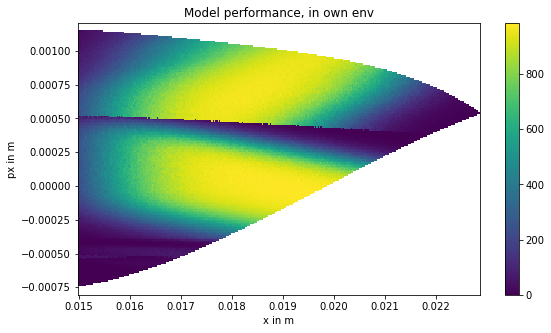

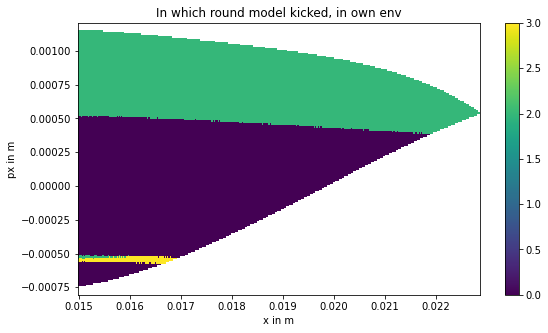

[524.6786360231384, 541.024954704933, 529.3803955569834]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
552.3784159350278                                      
 98%|█████████▊| 39/40 [51:11<?, ?trial/s, best loss=?]

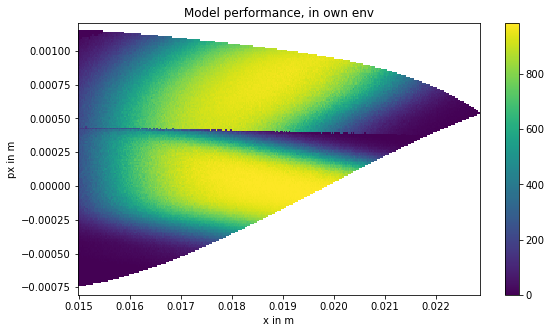

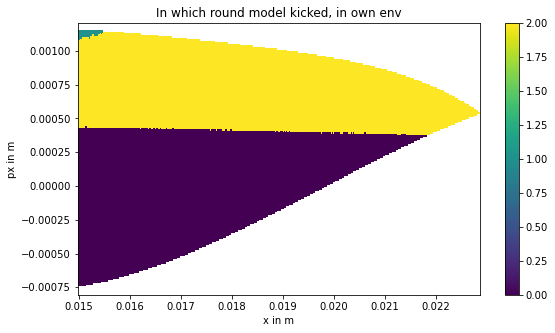

[524.6786360231384, 541.024954704933, 529.3803955569834, 552.3784159350278]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
7.538994993346523                                        
[524.6786360231384, 541.024954704933, 529.3803955569834, 552.3784159350278, 7.538994993346523]
100%|██████████| 40/40 [1:02:34<00:00, 3754.66s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 40 trials to 41 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
528.004856718741

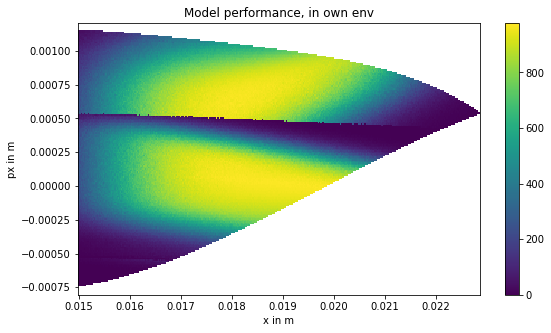

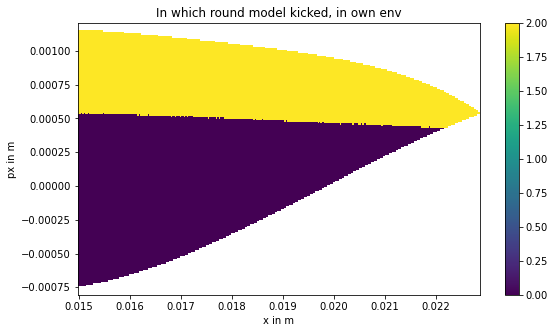

[528.0048567187412]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
535.8151469974482                                      
 98%|█████████▊| 40/41 [25:16<?, ?trial/s, best loss=?]

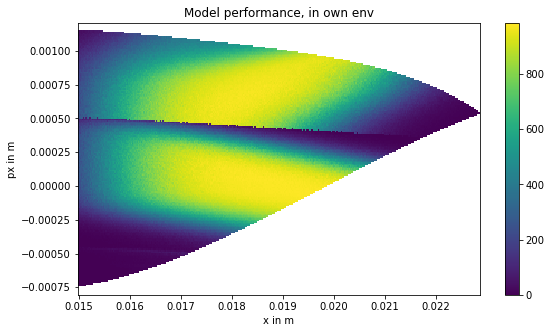

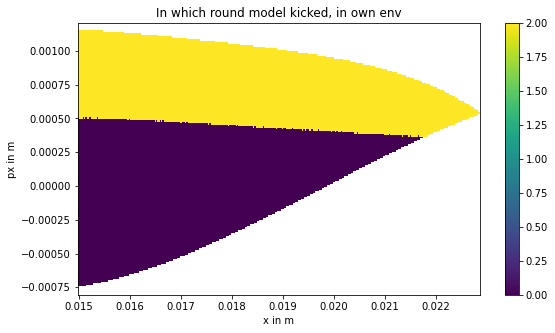

[528.0048567187412, 535.8151469974482]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
539.0677046568303                                      
 98%|█████████▊| 40/41 [38:01<?, ?trial/s, best loss=?]

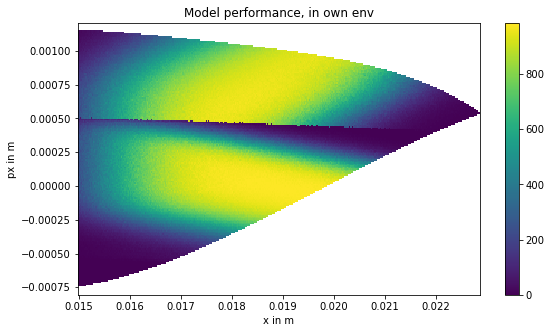

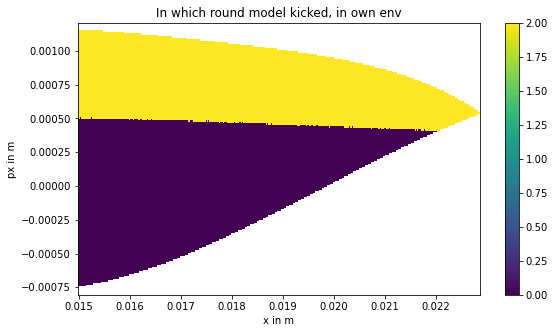

[528.0048567187412, 535.8151469974482, 539.0677046568303]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
535.58009091214                                        
 98%|█████████▊| 40/41 [50:40<?, ?trial/s, best loss=?]

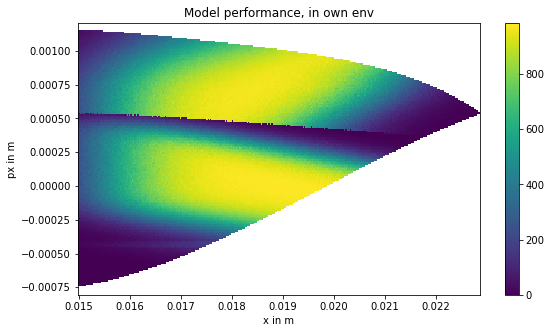

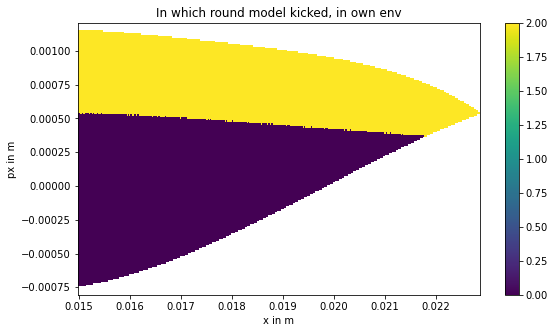

[528.0048567187412, 535.8151469974482, 539.0677046568303, 535.58009091214]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
519.7823117989888                                        
 98%|█████████▊| 40/41 [1:03:09<?, ?trial/s, best loss=?]

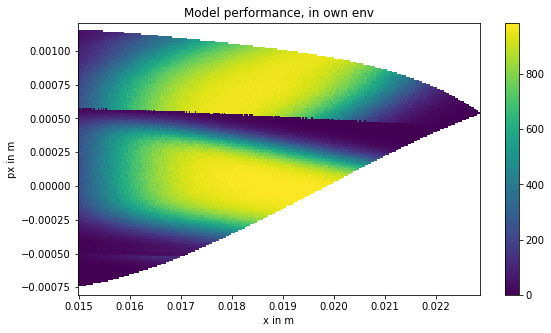

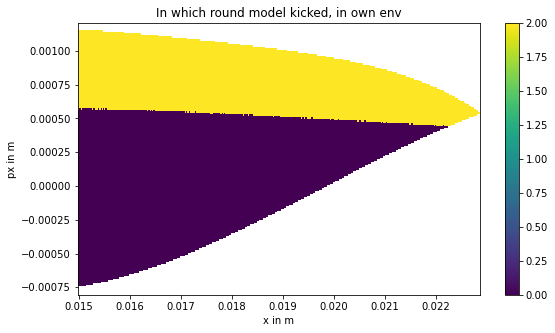

[528.0048567187412, 535.8151469974482, 539.0677046568303, 535.58009091214, 519.7823117989888]
100%|██████████| 41/41 [1:03:09<00:00, 3789.84s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 41 trials to 42 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
166.10921468582362                                     
[166.10921468582362]                                   
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
0.024569038376276615                   

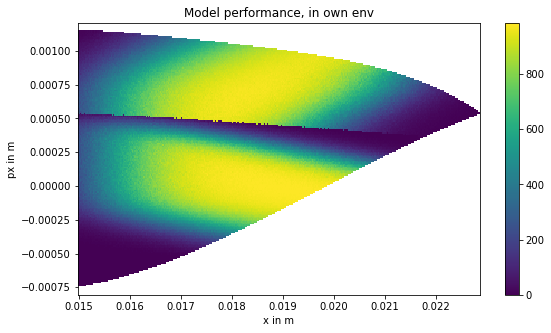

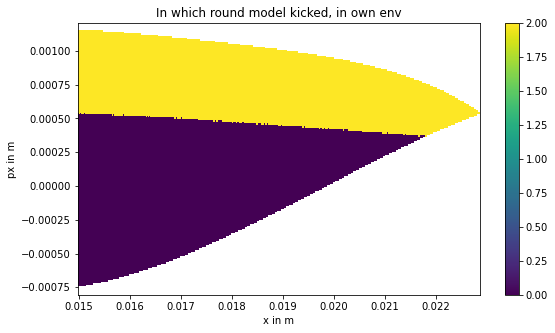

[537.0750880766566]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
0.046367004151249454                                   
[537.0750880766566, 0.046367004151249454]              
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
536.2603601578394                                      
 98%|█████████▊| 43/44 [37:31<?, ?trial/s, best loss=?]

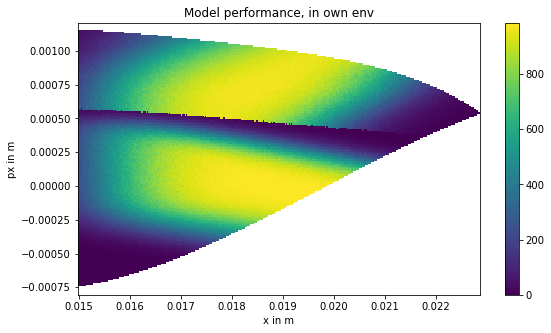

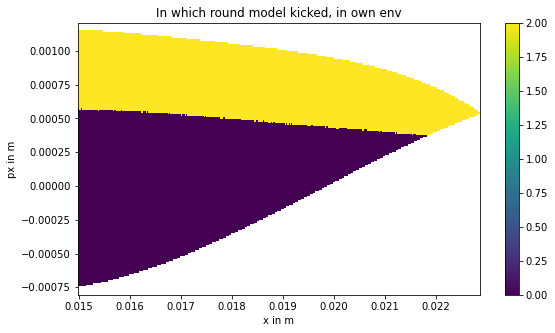

[537.0750880766566, 0.046367004151249454, 536.2603601578394]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
554.4779378731444                                      
 98%|█████████▊| 43/44 [50:16<?, ?trial/s, best loss=?]

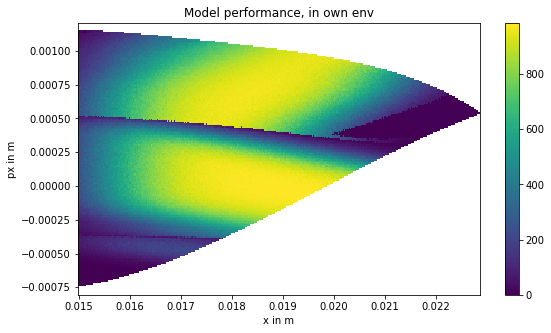

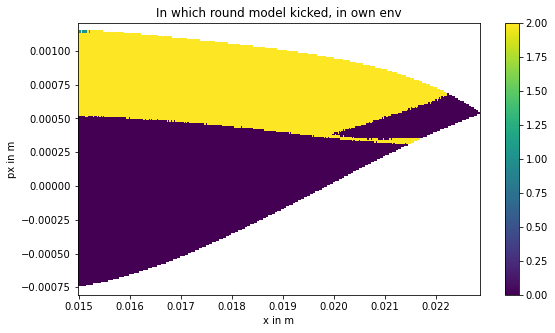

[537.0750880766566, 0.046367004151249454, 536.2603601578394, 554.4779378731444]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
522.357927151358                                         
 98%|█████████▊| 43/44 [1:02:56<?, ?trial/s, best loss=?]

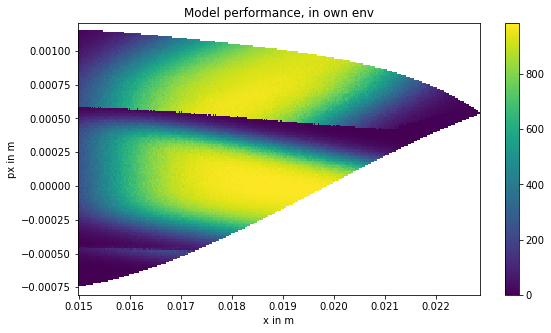

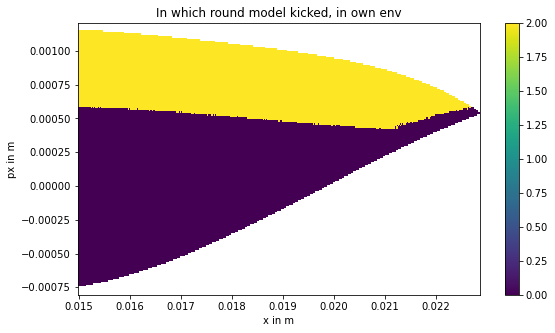

[537.0750880766566, 0.046367004151249454, 536.2603601578394, 554.4779378731444, 522.357927151358]
100%|██████████| 44/44 [1:02:56<00:00, 3776.99s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 44 trials to 45 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
0.0                                                    
[0.0]                                                  
BREAK                                                  
0.0                                                    
50                                                     
100%|██████████| 45/45 [20:31<00:00, 1231.63s/trial, best loss: -5.538857139490358]
Run: {'

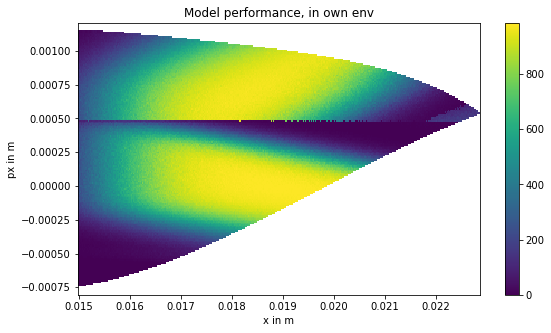

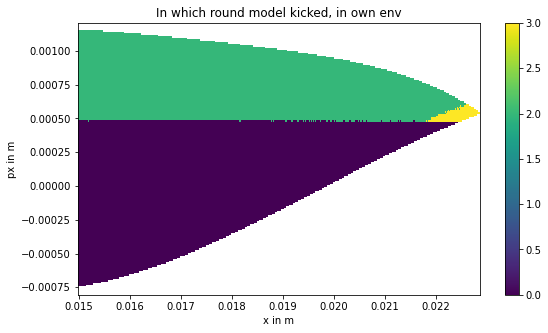

[537.0265669943557]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
557.3313030267888                                      
 98%|█████████▊| 45/46 [25:18<?, ?trial/s, best loss=?]

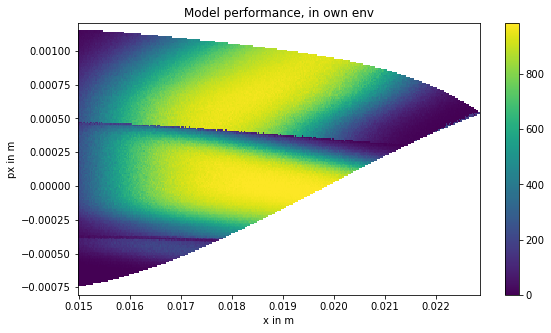

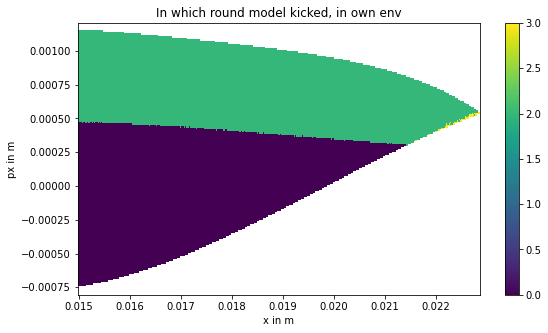

[537.0265669943557, 557.3313030267888]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
544.3153357037738                                      
 98%|█████████▊| 45/46 [38:03<?, ?trial/s, best loss=?]

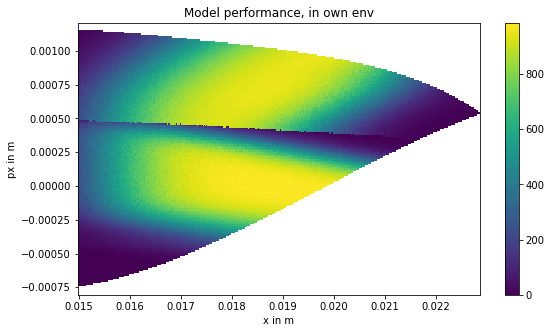

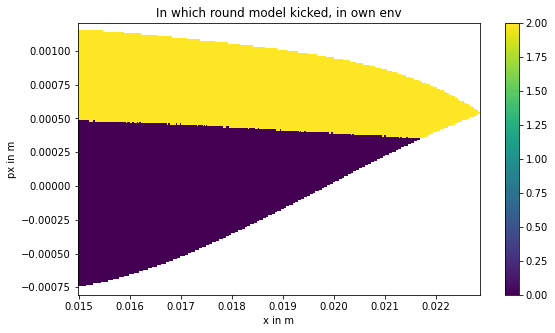

[537.0265669943557, 557.3313030267888, 544.3153357037738]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
557.0557781605751                                      
 98%|█████████▊| 45/46 [50:52<?, ?trial/s, best loss=?]

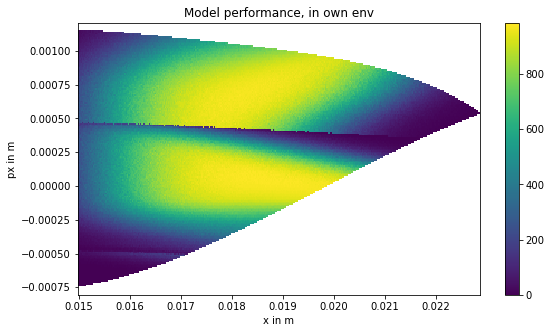

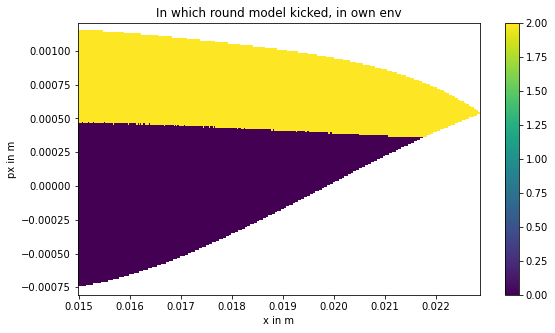

[537.0265669943557, 557.3313030267888, 544.3153357037738, 557.0557781605751]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
433.0765453291527                                        
[537.0265669943557, 557.3313030267888, 544.3153357037738, 557.0557781605751, 433.0765453291527]
100%|██████████| 46/46 [1:03:48<00:00, 3828.07s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 46 trials to 47 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
275.8581169972

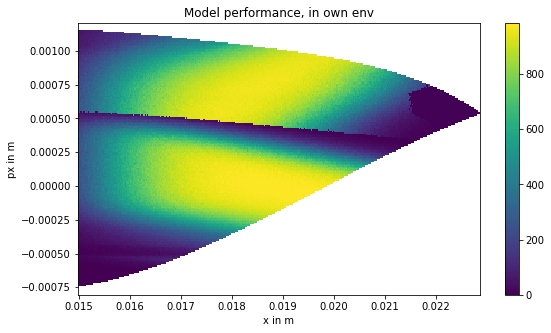

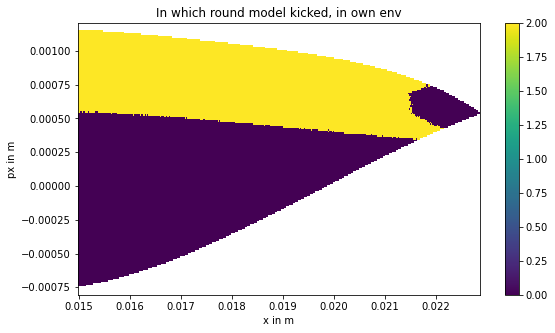

[541.2681252441878]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
278.13140308270357                                     
[541.2681252441878, 278.13140308270357]                
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
503.89635610603966                                     
 98%|█████████▊| 52/53 [37:24<?, ?trial/s, best loss=?]

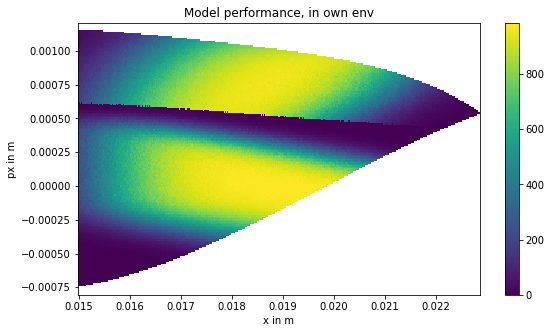

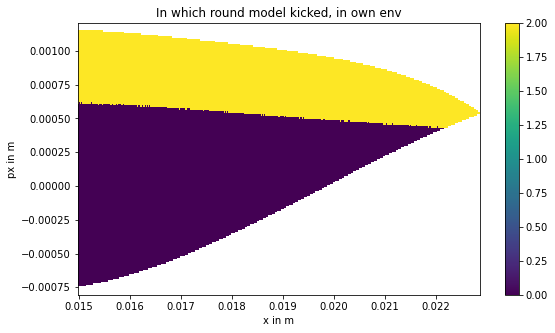

[541.2681252441878, 278.13140308270357, 503.89635610603966]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
535.3030844613987                                      
 98%|█████████▊| 52/53 [50:10<?, ?trial/s, best loss=?]

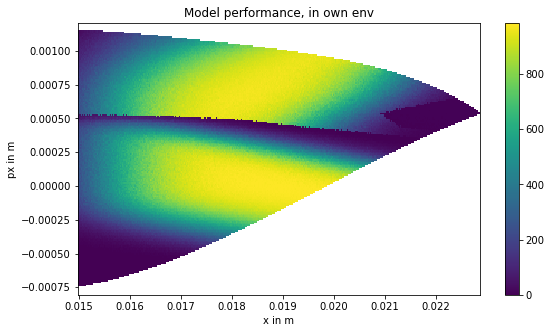

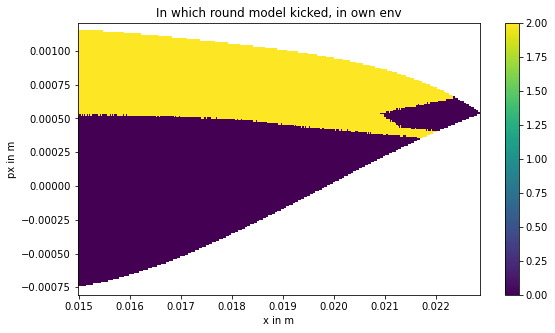

[541.2681252441878, 278.13140308270357, 503.89635610603966, 535.3030844613987]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
526.3686622210238                                        
 98%|█████████▊| 52/53 [1:02:53<?, ?trial/s, best loss=?]

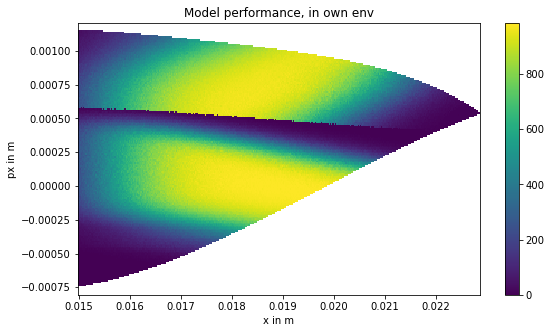

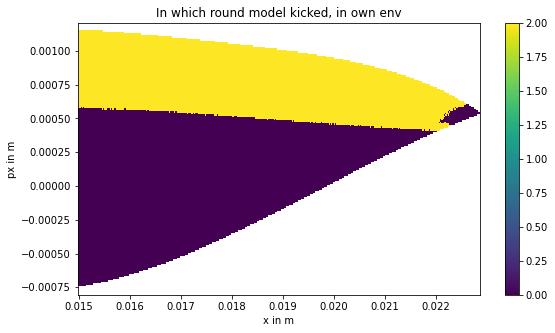

[541.2681252441878, 278.13140308270357, 503.89635610603966, 535.3030844613987, 526.3686622210238]
100%|██████████| 53/53 [1:02:53<00:00, 3773.40s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 53 trials to 54 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
0.0                                                    
[0.0]                                                  
BREAK                                                  
0.0                                                    
50                                                     
100%|██████████| 54/54 [20:28<00:00, 1228.05s/trial, best loss: -5.538857139490358]
Run: {'

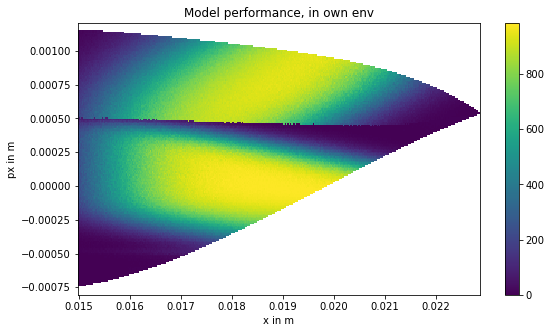

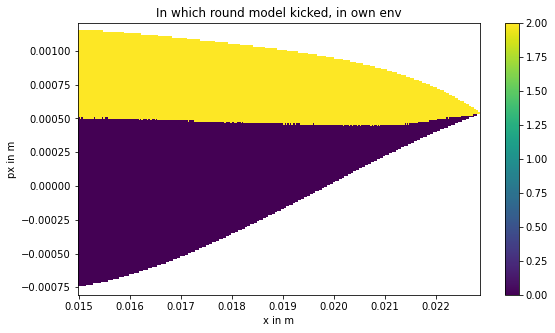

[518.4522050916406]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
496.4346874817301                                      
 98%|█████████▊| 56/57 [25:32<?, ?trial/s, best loss=?]

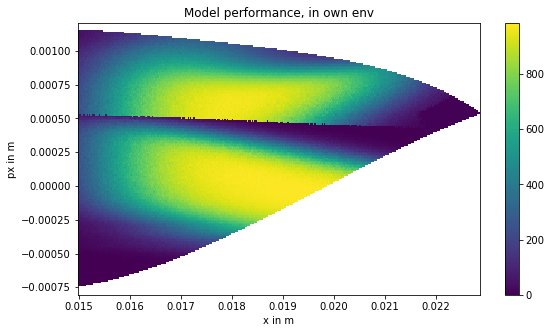

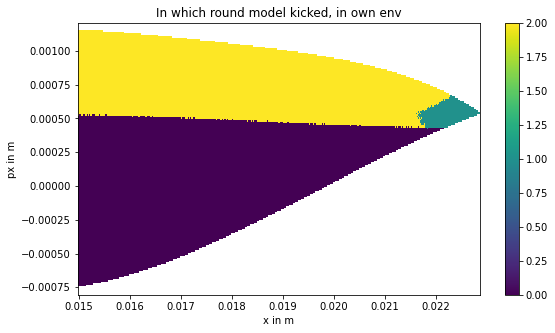

[518.4522050916406, 496.4346874817301]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
485.30701094860893                                     
 98%|█████████▊| 56/57 [38:20<?, ?trial/s, best loss=?]

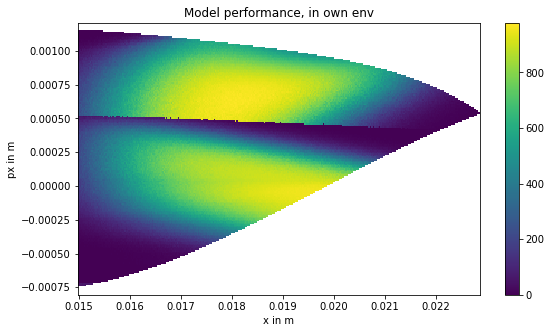

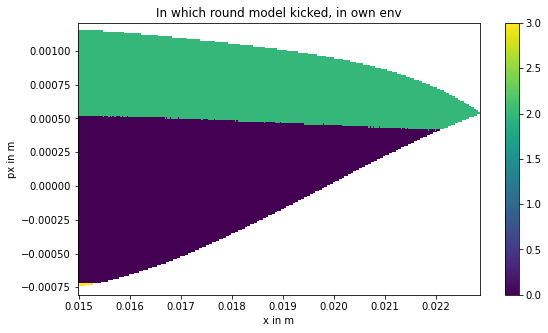

[518.4522050916406, 496.4346874817301, 485.30701094860893]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
502.5249573321656                                      
 98%|█████████▊| 56/57 [50:56<?, ?trial/s, best loss=?]

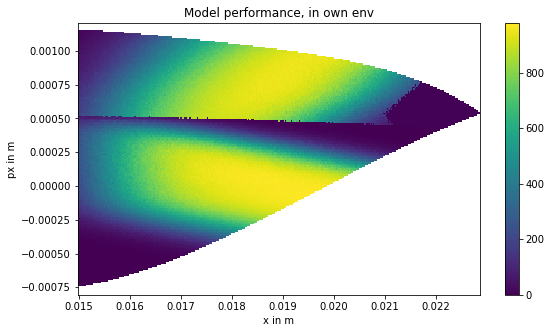

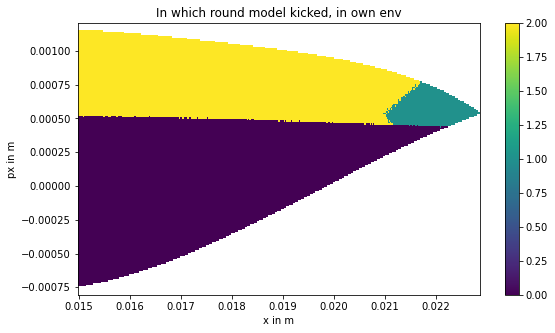

[518.4522050916406, 496.4346874817301, 485.30701094860893, 502.5249573321656]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
491.486148009294                                         
 98%|█████████▊| 56/57 [1:03:28<?, ?trial/s, best loss=?]

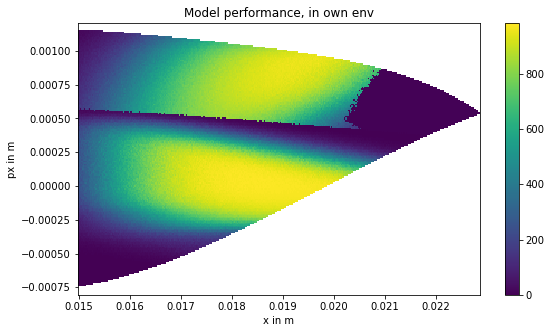

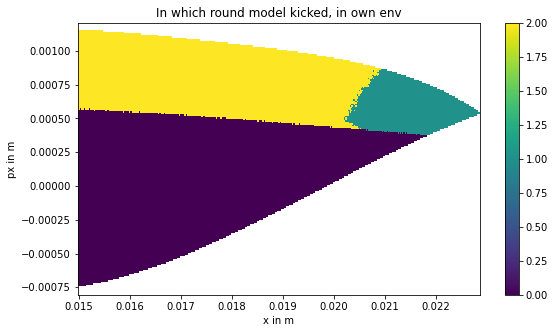

[518.4522050916406, 496.4346874817301, 485.30701094860893, 502.5249573321656, 491.486148009294]
100%|██████████| 57/57 [1:03:29<00:00, 3809.30s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 57 trials to 58 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
149.07248118607757                                     
[149.07248118607757]                                   
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
0.0                                  

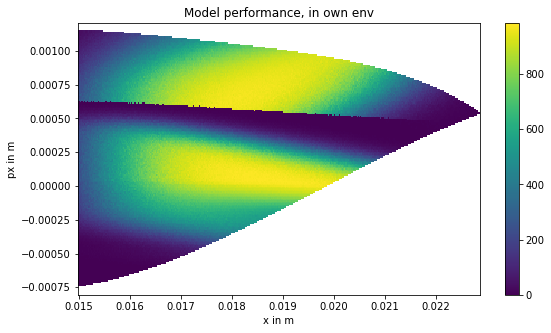

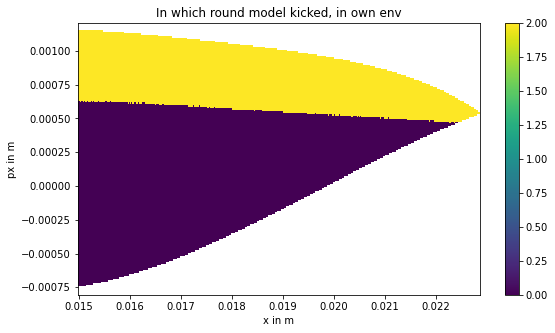

[485.1789277897955]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
275.98094111831114                                     
[485.1789277897955, 275.98094111831114]                
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
277.74831840483995                                     
[485.1789277897955, 275.98094111831114, 277.74831840483995]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
533.3170289099619                           

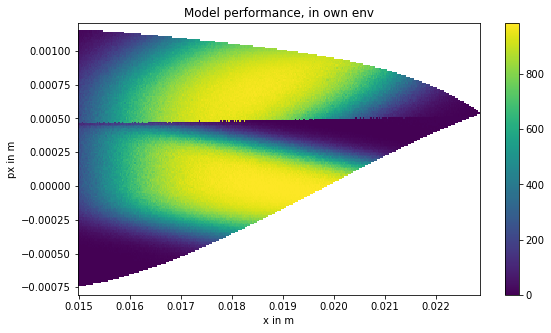

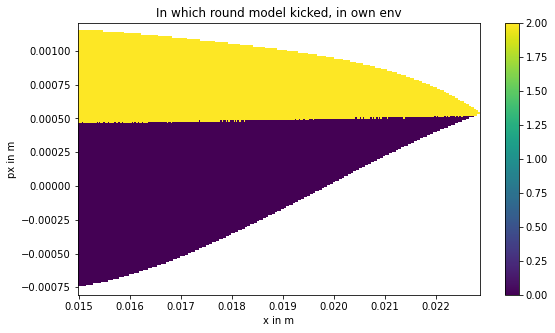

[485.1789277897955, 275.98094111831114, 277.74831840483995, 533.3170289099619]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
277.1674296965801                                        
[485.1789277897955, 275.98094111831114, 277.74831840483995, 533.3170289099619, 277.1674296965801]
100%|██████████| 59/59 [1:00:22<00:00, 3622.35s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 59 trials to 60 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
24.2210564

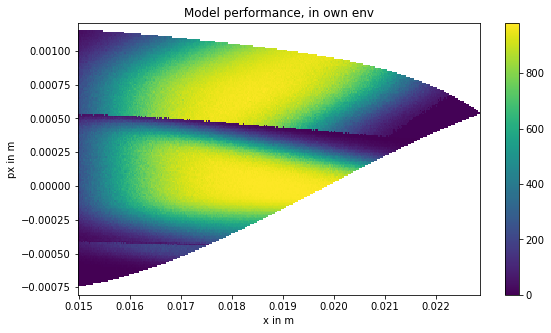

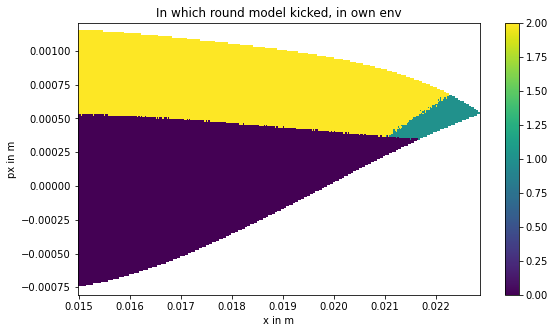

[549.5252884663955]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
531.0266327571672                                      
 98%|█████████▊| 61/62 [25:22<?, ?trial/s, best loss=?]

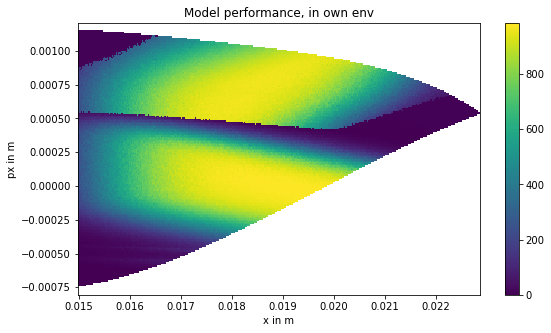

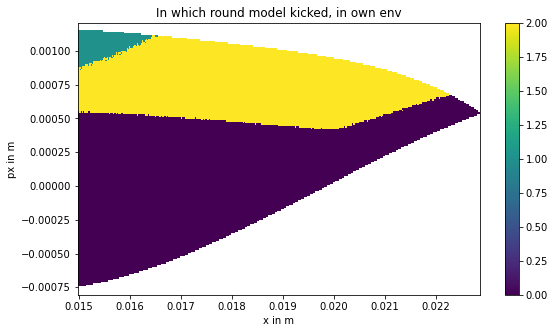

[549.5252884663955, 531.0266327571672]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
271.1294196578232                                      
[549.5252884663955, 531.0266327571672, 271.1294196578232]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
533.8646463865537                                      
 98%|█████████▊| 61/62 [49:35<?, ?trial/s, best loss=?]

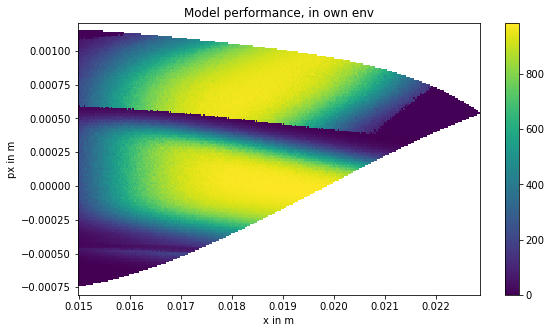

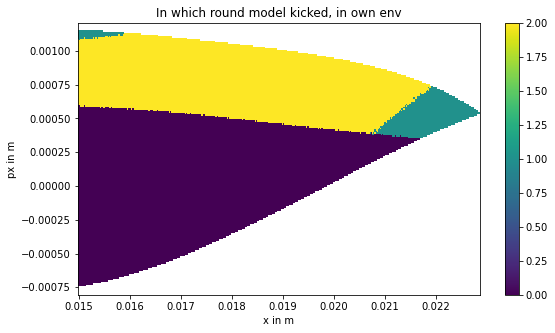

[549.5252884663955, 531.0266327571672, 271.1294196578232, 533.8646463865537]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
278.09877062369293                                       
[549.5252884663955, 531.0266327571672, 271.1294196578232, 533.8646463865537, 278.09877062369293]
100%|██████████| 62/62 [1:01:13<00:00, 3673.06s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 62 trials to 63 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
0.0          

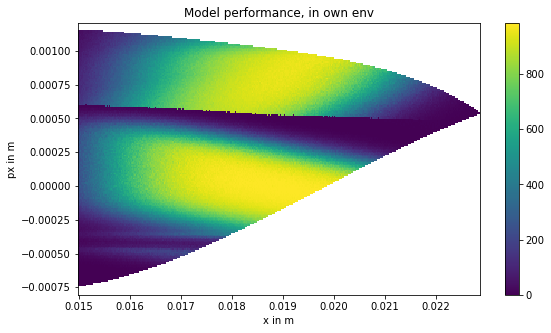

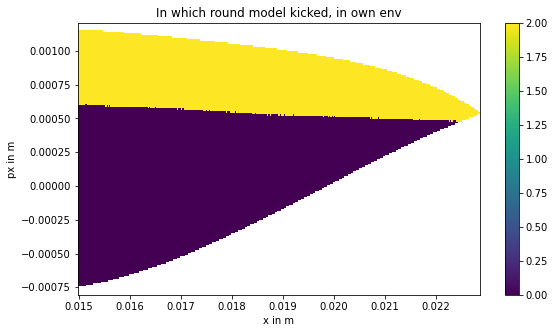

[490.80058938018055]                                   
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
443.93041806072523                                     
[490.80058938018055, 443.93041806072523]               
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
413.2788893247684                                      
[490.80058938018055, 443.93041806072523, 413.2788893247684]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
256.25514507408377                          

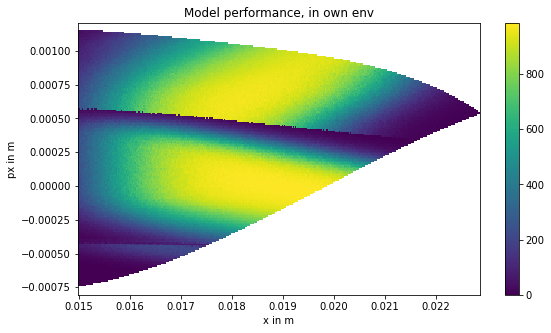

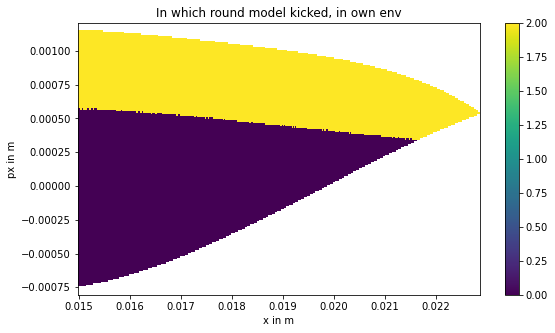

[533.6181775301382]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
498.1364257660132                                      
 98%|█████████▊| 64/65 [25:23<?, ?trial/s, best loss=?]

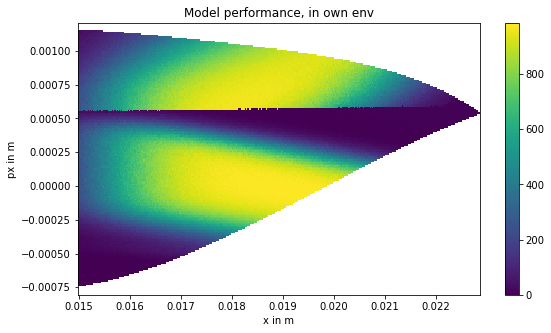

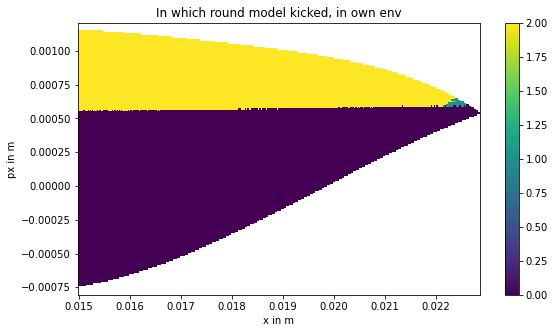

[533.6181775301382, 498.1364257660132]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
532.3741155018091                                      
 98%|█████████▊| 64/65 [38:06<?, ?trial/s, best loss=?]

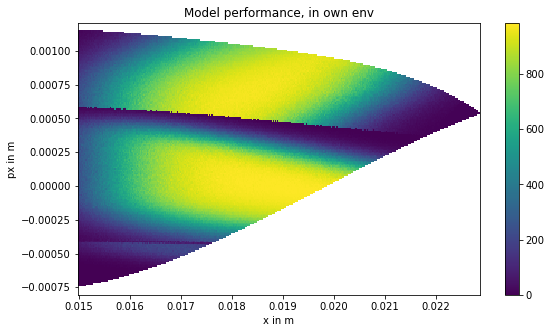

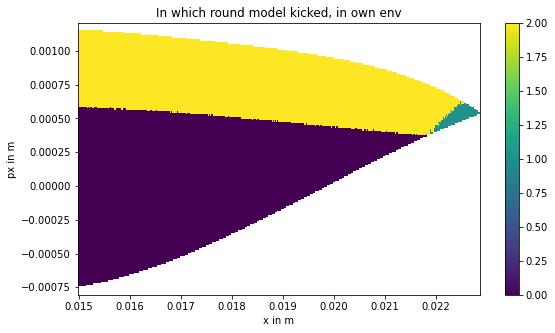

[533.6181775301382, 498.1364257660132, 532.3741155018091]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
561.5866493282375                                      
 98%|█████████▊| 64/65 [50:55<?, ?trial/s, best loss=?]

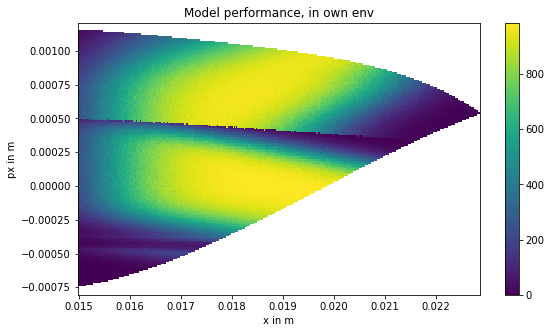

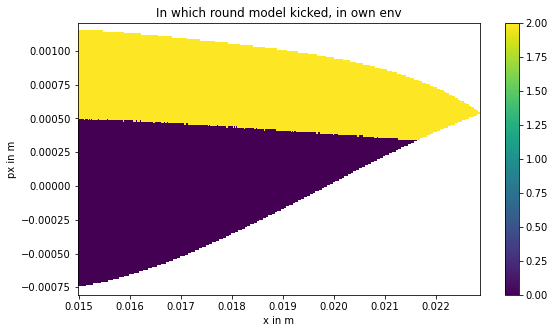

[533.6181775301382, 498.1364257660132, 532.3741155018091, 561.5866493282375]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
536.0710052100283                                        
 98%|█████████▊| 64/65 [1:03:27<?, ?trial/s, best loss=?]

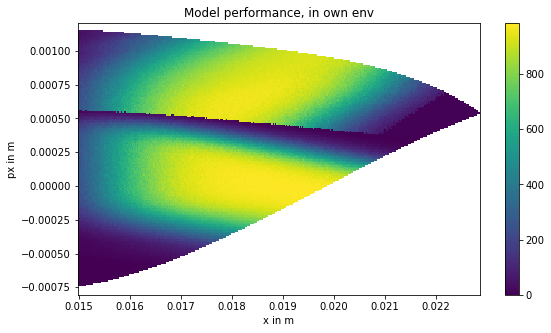

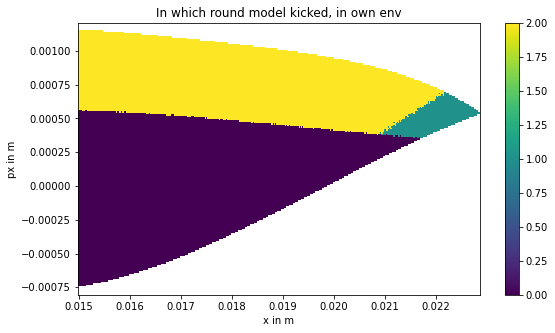

[533.6181775301382, 498.1364257660132, 532.3741155018091, 561.5866493282375, 536.0710052100283]
100%|██████████| 65/65 [1:03:27<00:00, 3807.63s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 65 trials to 66 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
537.928898269486                                       
 98%|█████████▊| 65/66 [12:43<?, ?trial/s, best loss=?]

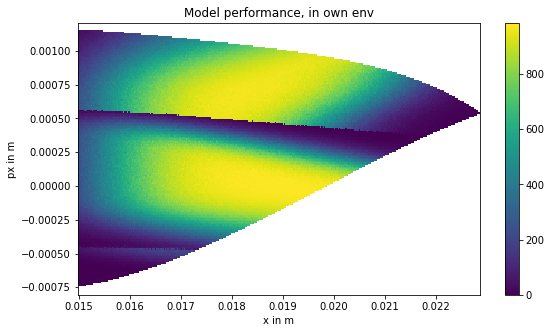

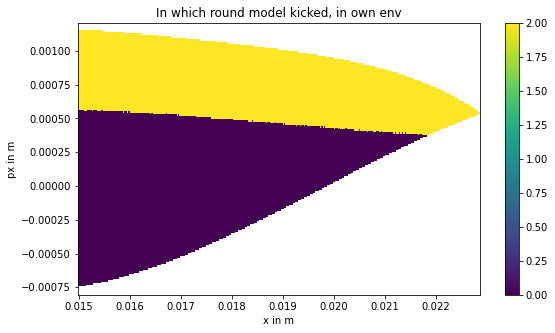

[537.928898269486]                                     
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
542.4293372759579                                      
 98%|█████████▊| 65/66 [25:34<?, ?trial/s, best loss=?]

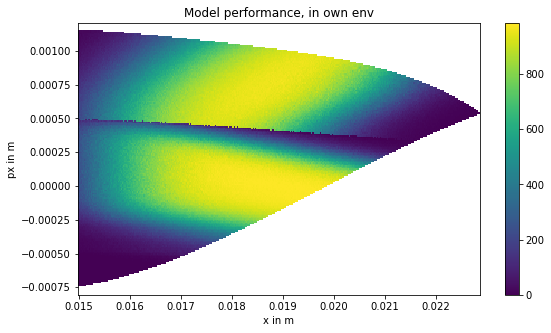

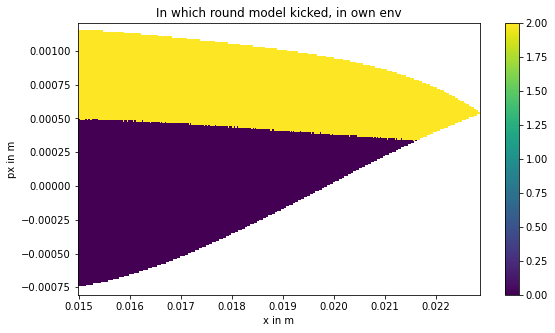

[537.928898269486, 542.4293372759579]                  
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
524.6464394505463                                      
 98%|█████████▊| 65/66 [38:12<?, ?trial/s, best loss=?]

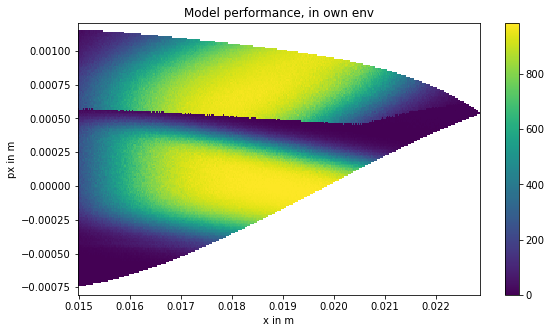

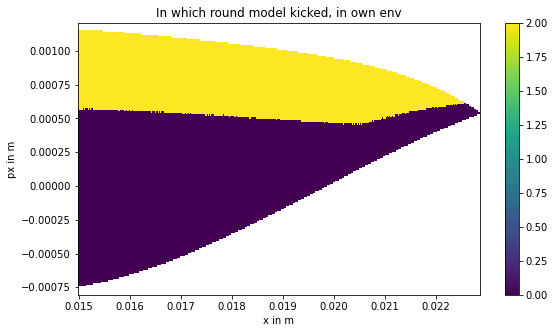

[537.928898269486, 542.4293372759579, 524.6464394505463]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
534.7054682549294                                      
 98%|█████████▊| 65/66 [50:46<?, ?trial/s, best loss=?]

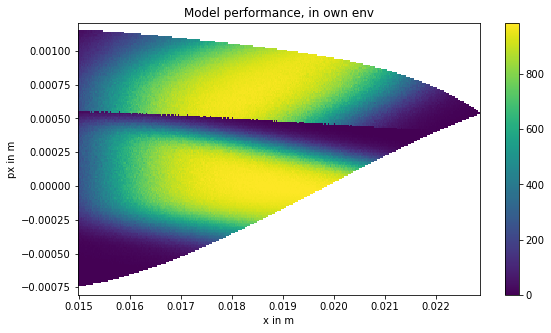

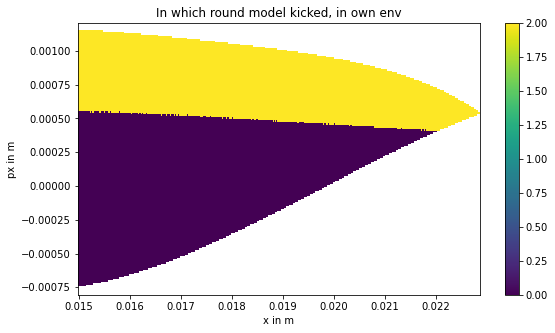

[537.928898269486, 542.4293372759579, 524.6464394505463, 534.7054682549294]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
556.1497054095784                                        
 98%|█████████▊| 65/66 [1:03:40<?, ?trial/s, best loss=?]

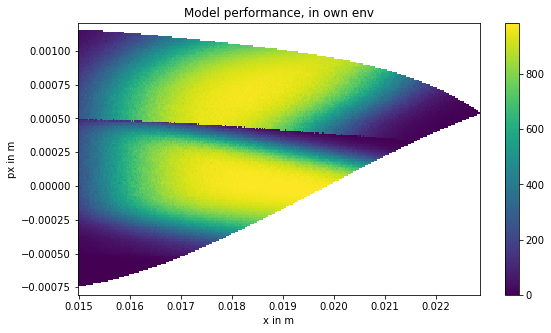

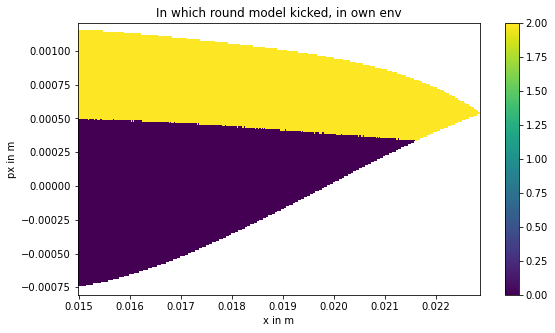

[537.928898269486, 542.4293372759579, 524.6464394505463, 534.7054682549294, 556.1497054095784]
100%|██████████| 66/66 [1:03:40<00:00, 3820.91s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 66 trials to 67 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
503.5694902287733                                      
 99%|█████████▊| 66/67 [12:30<?, ?trial/s, best loss=?]

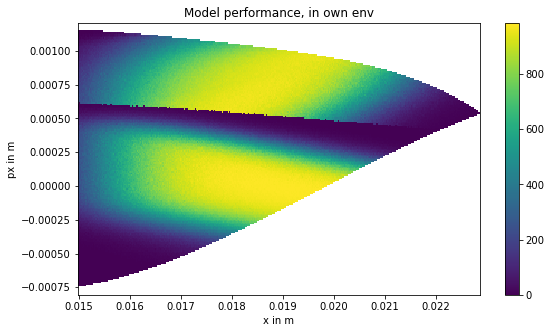

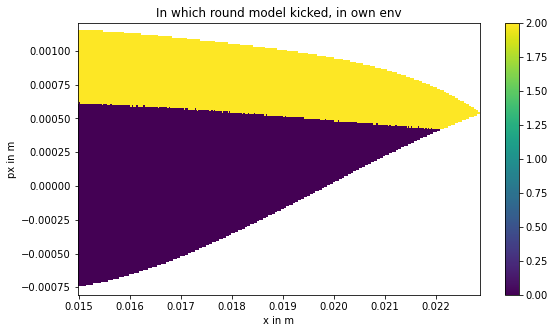

[503.5694902287733]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
538.7124873134983                                      
 99%|█████████▊| 66/67 [25:16<?, ?trial/s, best loss=?]

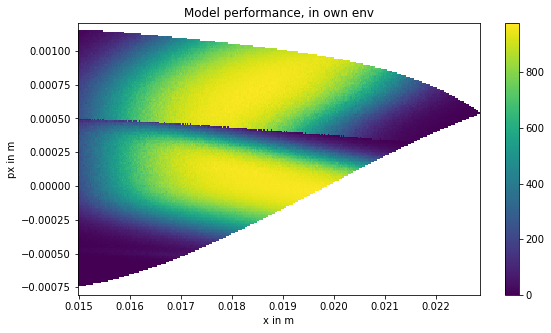

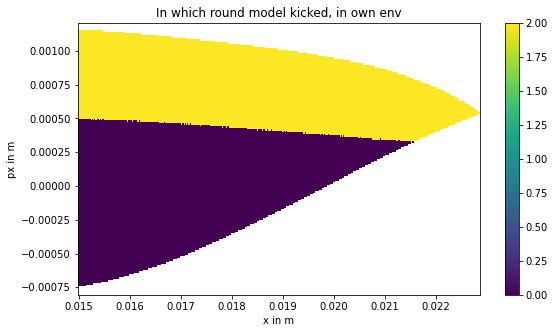

[503.5694902287733, 538.7124873134983]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
530.8339427145887                                      
 99%|█████████▊| 66/67 [37:57<?, ?trial/s, best loss=?]

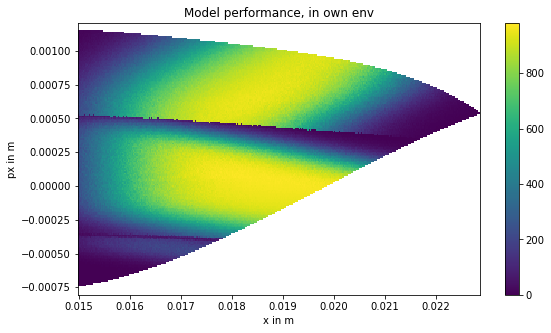

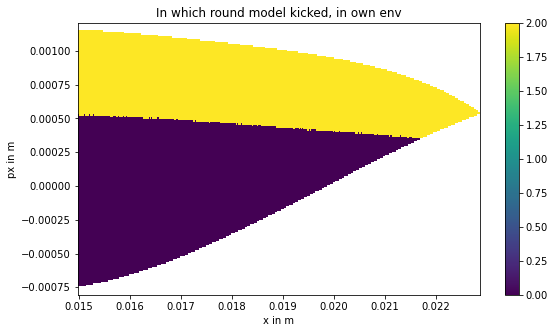

[503.5694902287733, 538.7124873134983, 530.8339427145887]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
558.7946488799383                                      
 99%|█████████▊| 66/67 [50:47<?, ?trial/s, best loss=?]

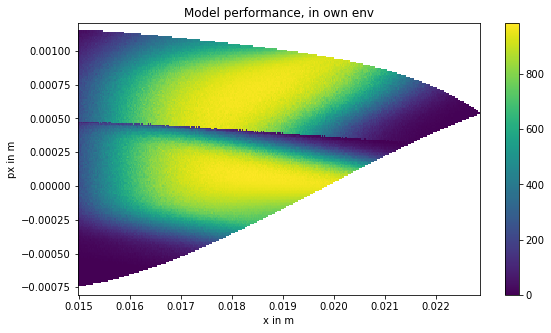

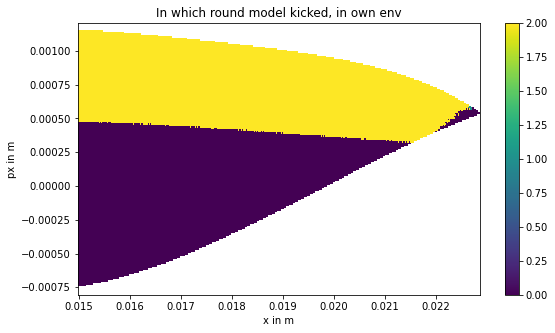

[503.5694902287733, 538.7124873134983, 530.8339427145887, 558.7946488799383]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
541.429656999011                                         
 99%|█████████▊| 66/67 [1:03:36<?, ?trial/s, best loss=?]

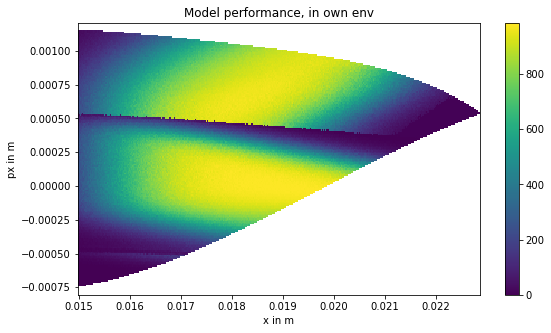

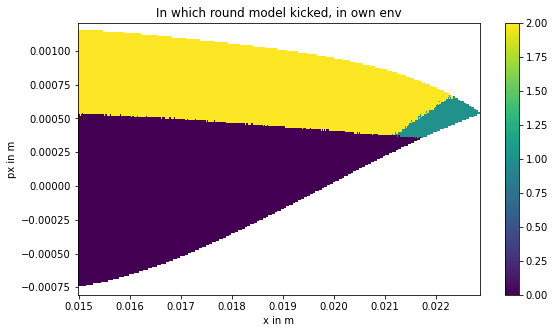

[503.5694902287733, 538.7124873134983, 530.8339427145887, 558.7946488799383, 541.429656999011]
100%|██████████| 67/67 [1:03:36<00:00, 3816.91s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 67 trials to 68 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
503.2340148144175                                      
 99%|█████████▊| 67/68 [12:35<?, ?trial/s, best loss=?]

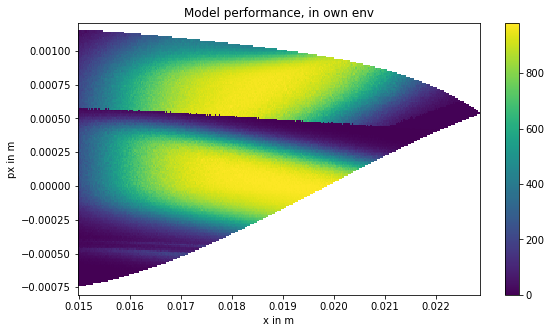

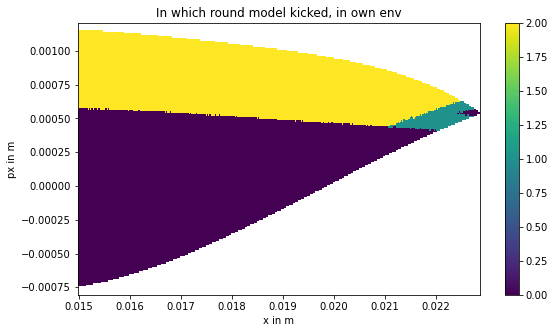

[503.2340148144175]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
552.4139871266515                                      
 99%|█████████▊| 67/68 [25:22<?, ?trial/s, best loss=?]

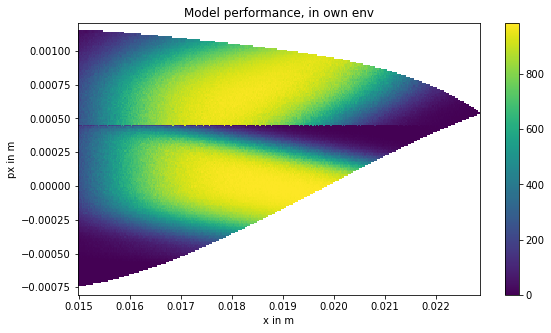

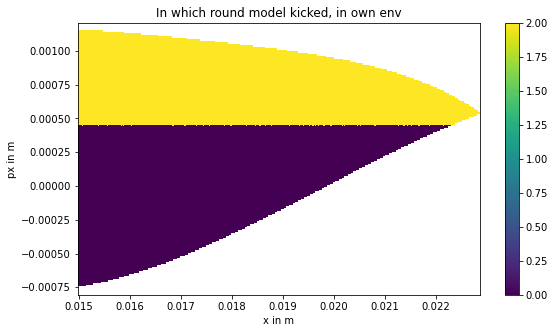

[503.2340148144175, 552.4139871266515]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
528.8646833790214                                      
 99%|█████████▊| 67/68 [38:05<?, ?trial/s, best loss=?]

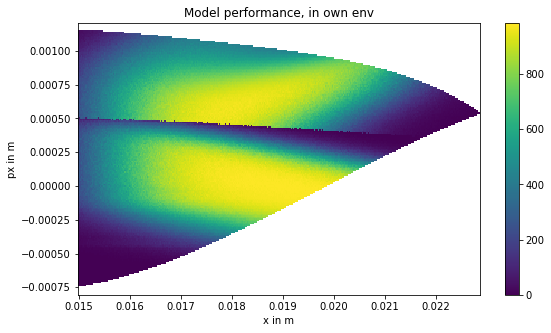

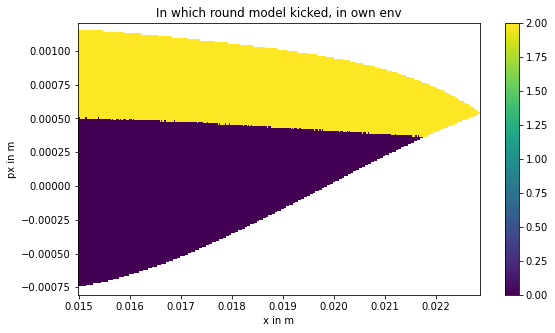

[503.2340148144175, 552.4139871266515, 528.8646833790214]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
535.6965456057593                                      
 99%|█████████▊| 67/68 [50:49<?, ?trial/s, best loss=?]

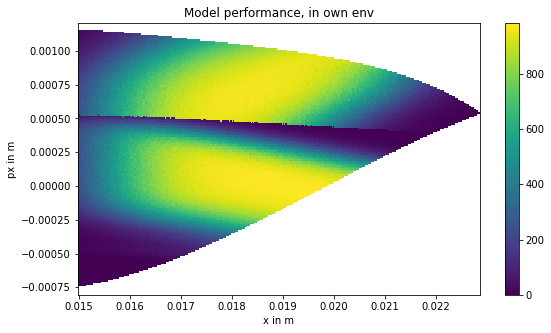

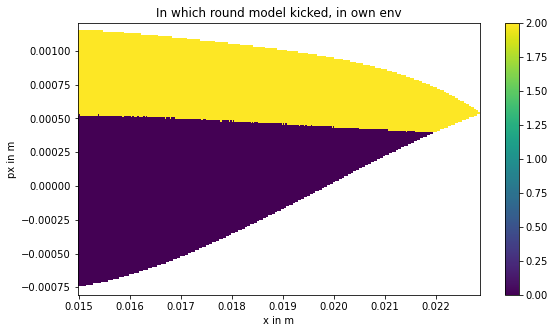

[503.2340148144175, 552.4139871266515, 528.8646833790214, 535.6965456057593]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
571.3287173033929                                        
 99%|█████████▊| 67/68 [1:03:41<?, ?trial/s, best loss=?]

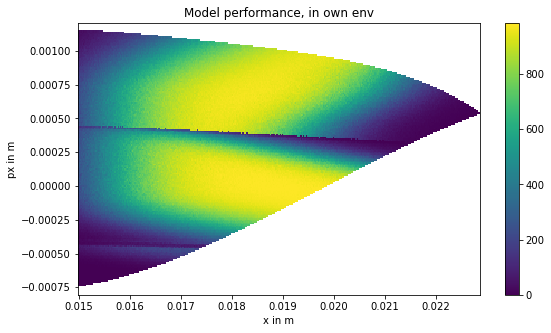

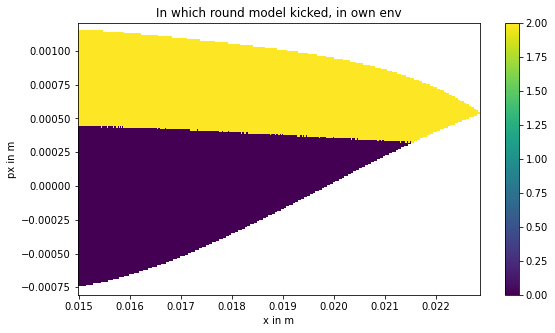

[503.2340148144175, 552.4139871266515, 528.8646833790214, 535.6965456057593, 571.3287173033929]
100%|██████████| 68/68 [1:03:41<00:00, 3821.94s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 68 trials to 69 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
7.551939129142627                                      
[7.551939129142627]                                    
BREAK                                                  
7.551939129142627                                      
50                                                     
100%|██████████| 69/69 [11:37<00:00, 697.03s/trial, best loss: -5.538857139490358]
Run: {'bat

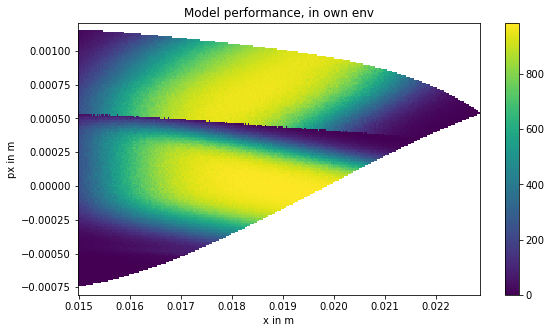

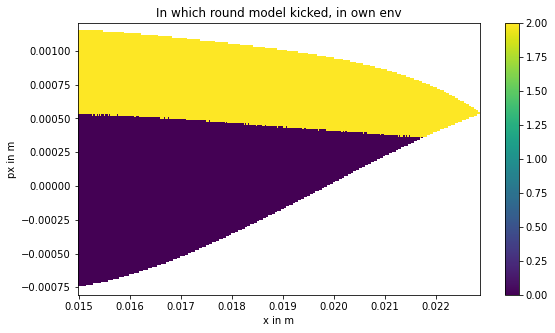

[536.4789306352977]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
499.0176581040191                                      
 99%|█████████▊| 69/70 [25:22<?, ?trial/s, best loss=?]

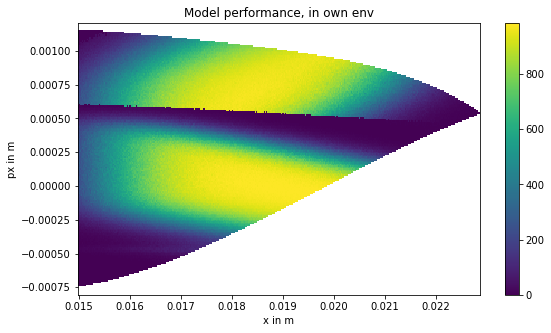

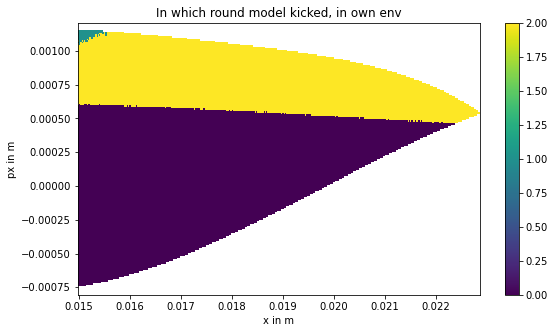

[536.4789306352977, 499.0176581040191]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
540.1539993810536                                      
 99%|█████████▊| 69/70 [37:55<?, ?trial/s, best loss=?]

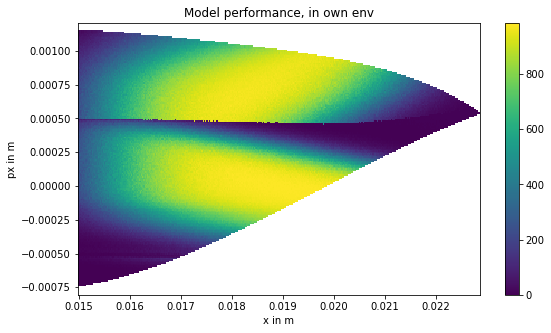

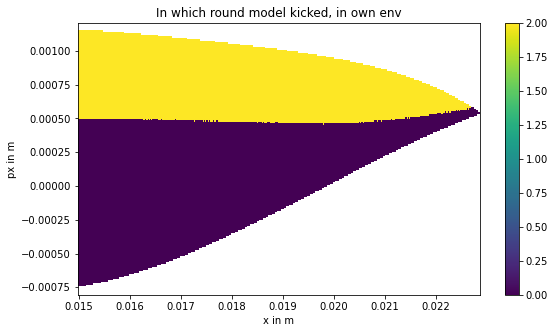

[536.4789306352977, 499.0176581040191, 540.1539993810536]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
547.5975638706345                                      
 99%|█████████▊| 69/70 [50:49<?, ?trial/s, best loss=?]

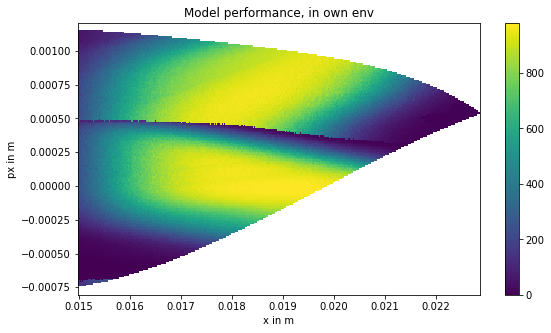

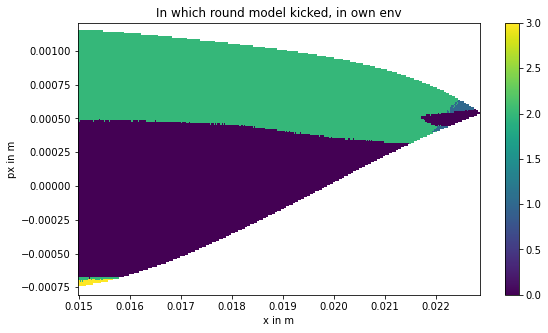

[536.4789306352977, 499.0176581040191, 540.1539993810536, 547.5975638706345]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
530.6250176601629                                        
 99%|█████████▊| 69/70 [1:03:32<?, ?trial/s, best loss=?]

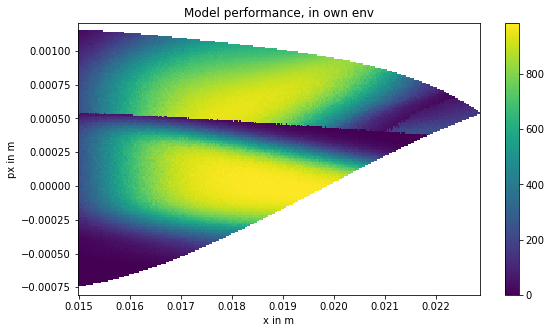

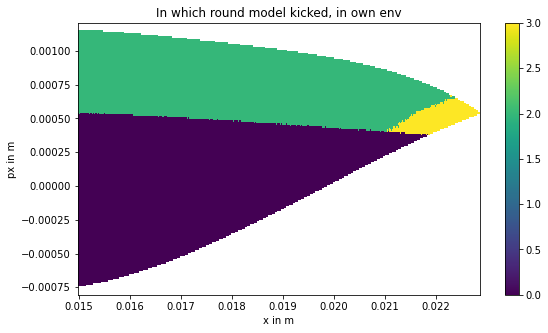

[536.4789306352977, 499.0176581040191, 540.1539993810536, 547.5975638706345, 530.6250176601629]
100%|██████████| 70/70 [1:03:32<00:00, 3812.45s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 70 trials to 71 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
501.5905661603101                                      
 99%|█████████▊| 70/71 [12:36<?, ?trial/s, best loss=?]

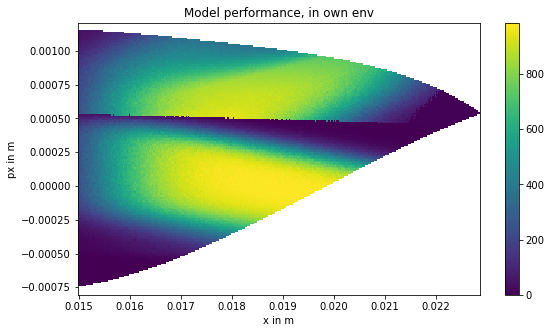

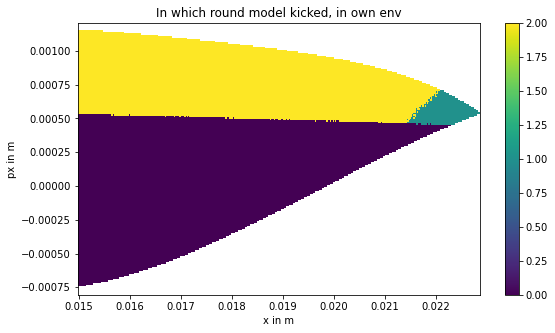

[501.5905661603101]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
521.1544096181217                                      
 99%|█████████▊| 70/71 [25:11<?, ?trial/s, best loss=?]

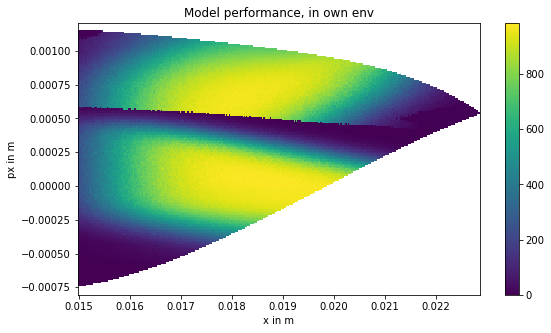

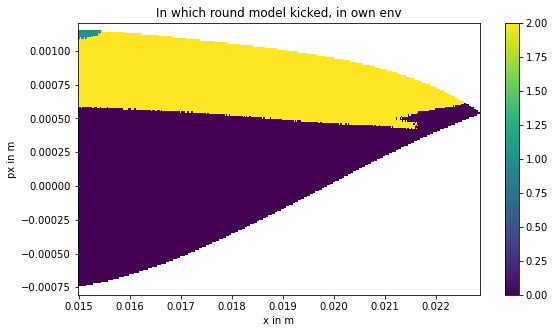

[501.5905661603101, 521.1544096181217]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
535.4752383090165                                      
 99%|█████████▊| 70/71 [37:50<?, ?trial/s, best loss=?]

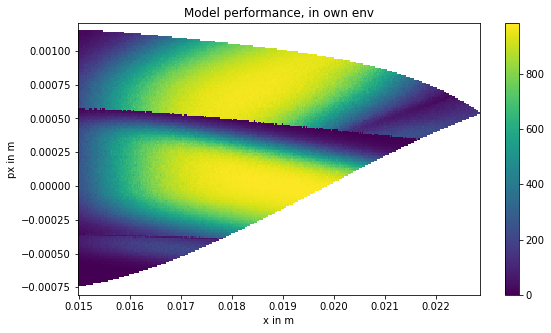

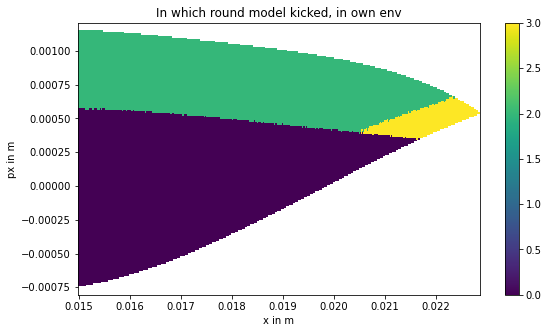

[501.5905661603101, 521.1544096181217, 535.4752383090165]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
557.8023368447285                                      
 99%|█████████▊| 70/71 [51:05<?, ?trial/s, best loss=?]

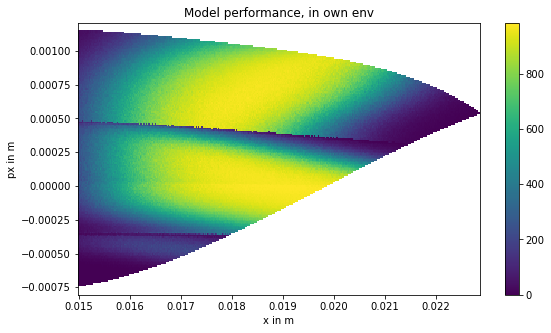

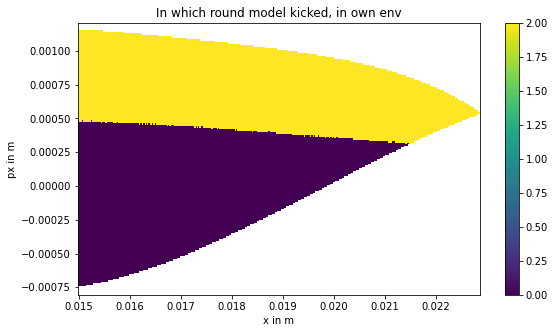

[501.5905661603101, 521.1544096181217, 535.4752383090165, 557.8023368447285]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
524.0921123218399                                        
 99%|█████████▊| 70/71 [1:04:39<?, ?trial/s, best loss=?]

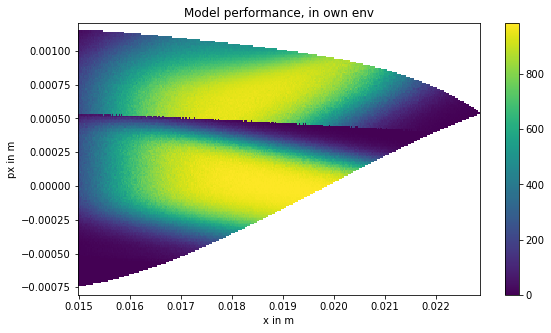

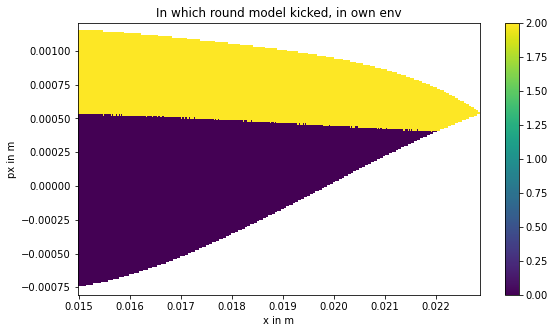

[501.5905661603101, 521.1544096181217, 535.4752383090165, 557.8023368447285, 524.0921123218399]
100%|██████████| 71/71 [1:04:40<00:00, 3880.04s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 71 trials to 72 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
9.83108744736111                                       
[9.83108744736111]                                     
BREAK                                                  
9.83108744736111                                       
50                                                     
100%|██████████| 72/72 [21:54<00:00, 1314.63s/trial, best loss: -5.538857139490358]
Run: {'ba

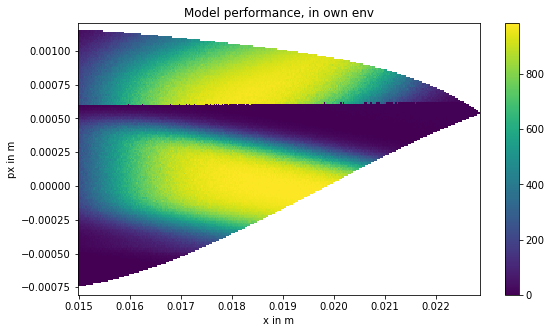

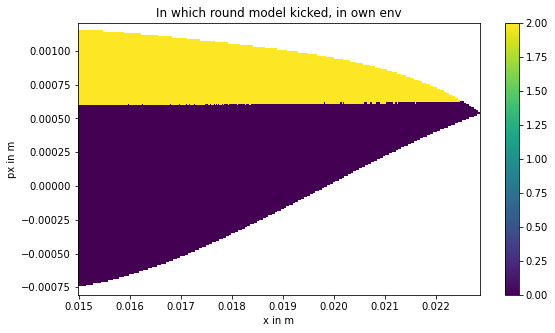

[480.52339541002164]                                   
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
272.5486789626387                                      
[480.52339541002164, 272.5486789626387]                
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
279.9511886263462                                      
[480.52339541002164, 272.5486789626387, 279.9511886263462]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
487.8224415442184                            

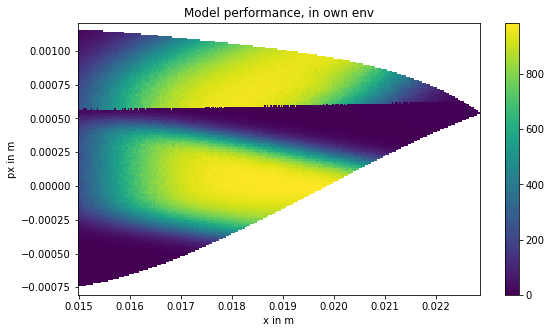

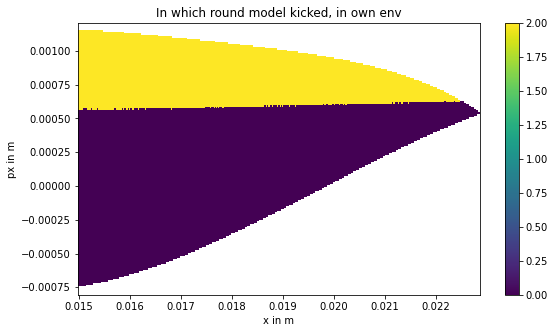

[480.52339541002164, 272.5486789626387, 279.9511886263462, 487.8224415442184]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
274.5446460226784                                        
[480.52339541002164, 272.5486789626387, 279.9511886263462, 487.8224415442184, 274.5446460226784]
100%|██████████| 73/73 [1:00:38<00:00, 3638.64s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 73 trials to 74 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
0.0         

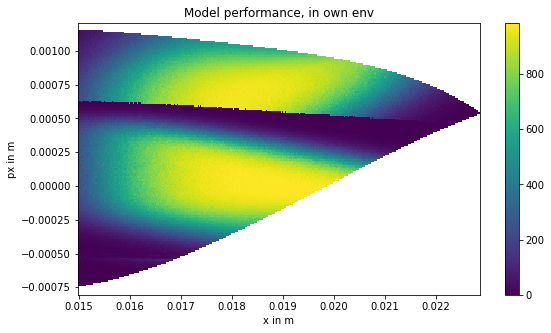

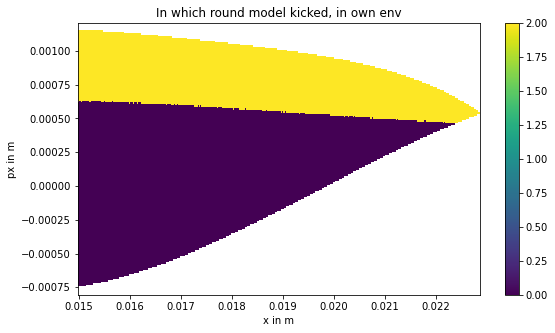

[493.1968396551789]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
456.8054923262959                                      
[493.1968396551789, 456.8054923262959]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
544.2343138349914                                      
 99%|█████████▊| 74/75 [37:39<?, ?trial/s, best loss=?]

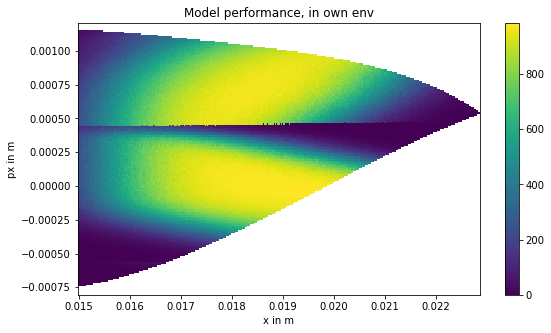

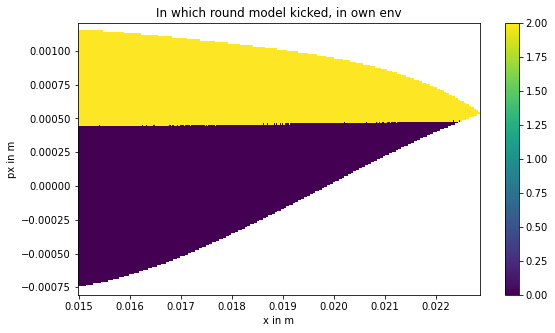

[493.1968396551789, 456.8054923262959, 544.2343138349914]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
495.73917477697563                                     
 99%|█████████▊| 74/75 [50:18<?, ?trial/s, best loss=?]

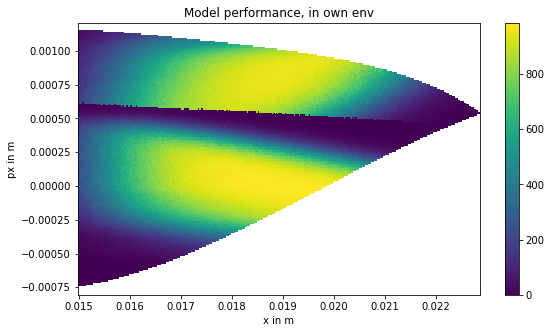

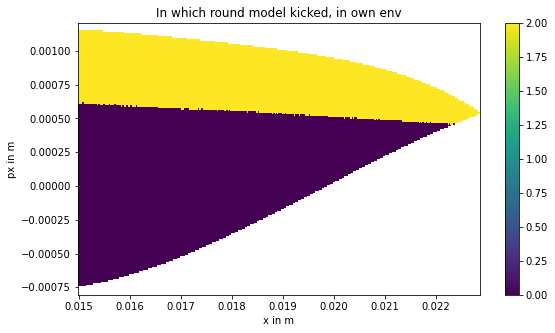

[493.1968396551789, 456.8054923262959, 544.2343138349914, 495.73917477697563]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
493.13917918784324                                       
 99%|█████████▊| 74/75 [1:02:52<?, ?trial/s, best loss=?]

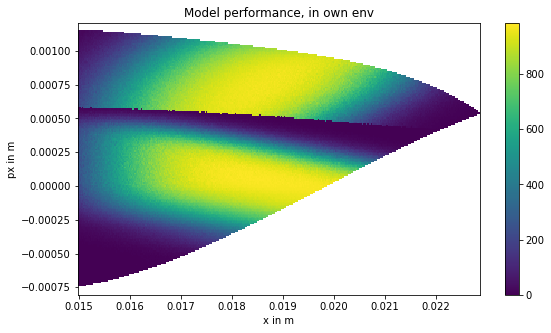

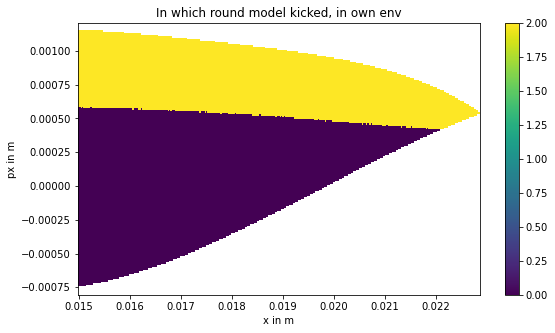

[493.1968396551789, 456.8054923262959, 544.2343138349914, 495.73917477697563, 493.13917918784324]
100%|██████████| 75/75 [1:02:52<00:00, 3772.97s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 75 trials to 76 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
161.18609324440905                                     
[161.18609324440905]                                   
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
21.745966775296356                 

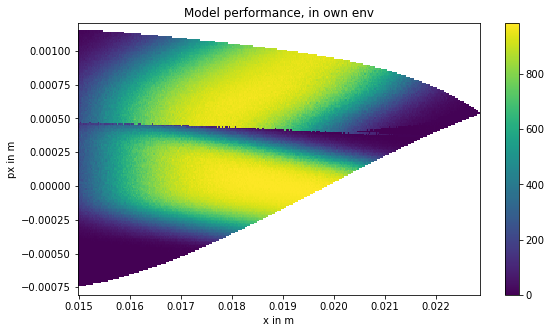

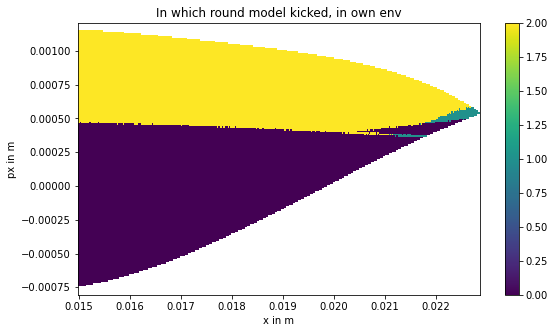

[539.7440150338535]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
274.8619151884285                                      
[539.7440150338535, 274.8619151884285]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
7.520985369239084                                      
[539.7440150338535, 274.8619151884285, 7.520985369239084]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
279.1450798524678                             

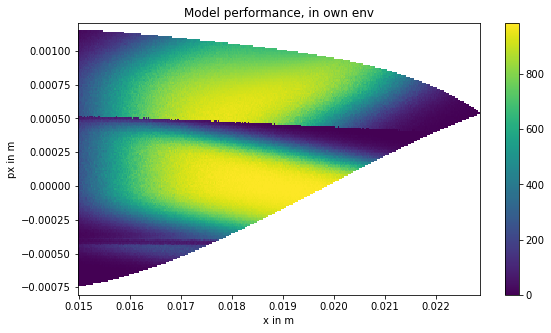

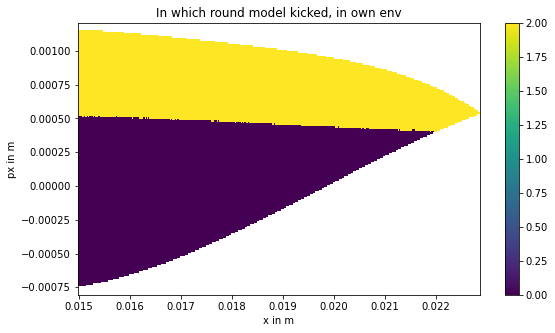

[539.7440150338535, 274.8619151884285, 7.520985369239084, 279.1450798524678, 530.7532859041503]
100%|██████████| 77/77 [1:00:11<00:00, 3611.08s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 77 trials to 78 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
257.0393354525061                                      
[257.0393354525061]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
277.08456616736595                   

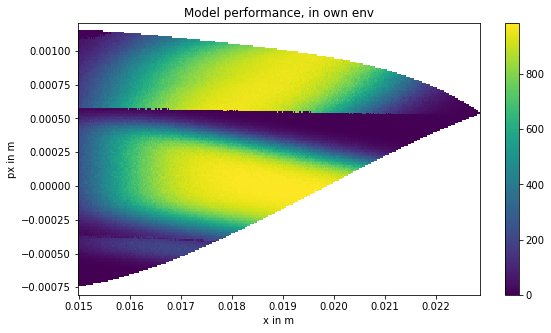

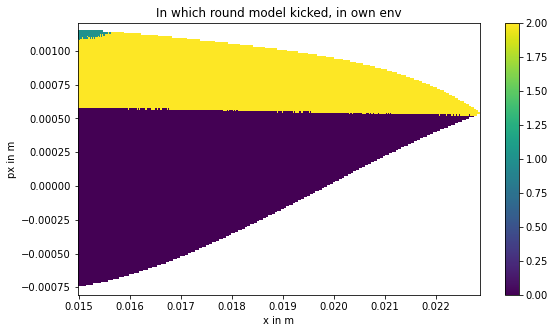

[500.9492018287766]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
499.48732587196497                                     
 99%|█████████▉| 79/80 [25:00<?, ?trial/s, best loss=?]

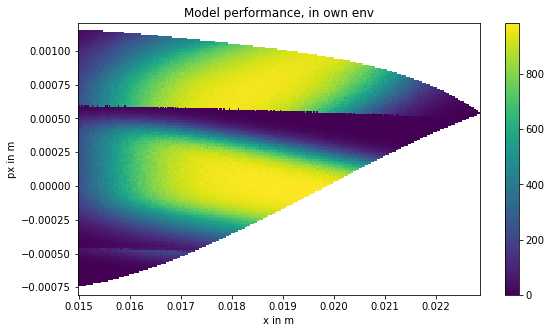

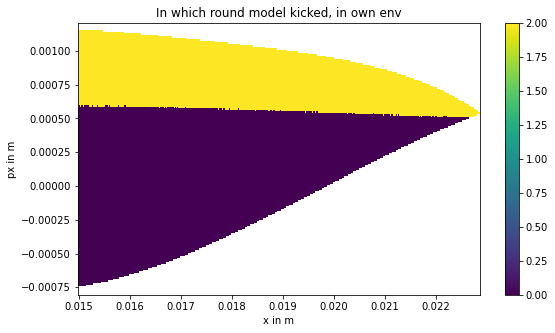

[500.9492018287766, 499.48732587196497]                
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
522.4927197328298                                      
 99%|█████████▉| 79/80 [37:49<?, ?trial/s, best loss=?]

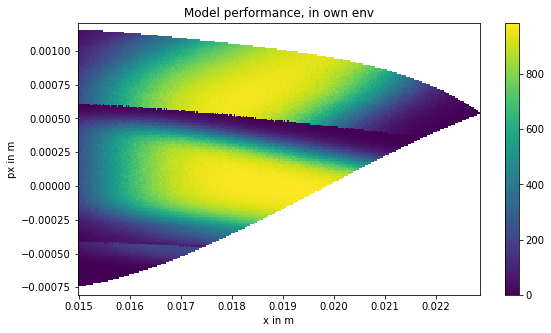

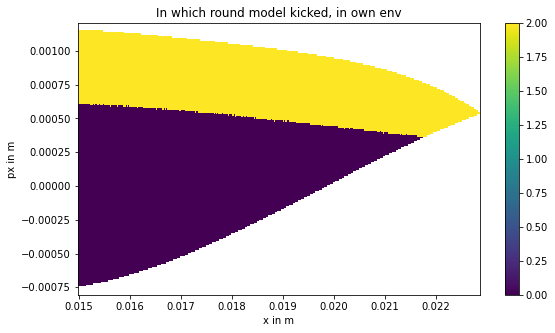

[500.9492018287766, 499.48732587196497, 522.4927197328298]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
530.400645511802                                       
 99%|█████████▉| 79/80 [50:27<?, ?trial/s, best loss=?]

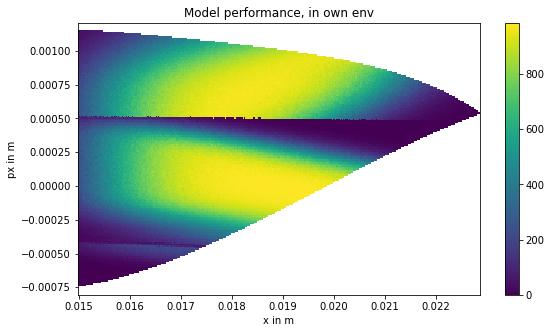

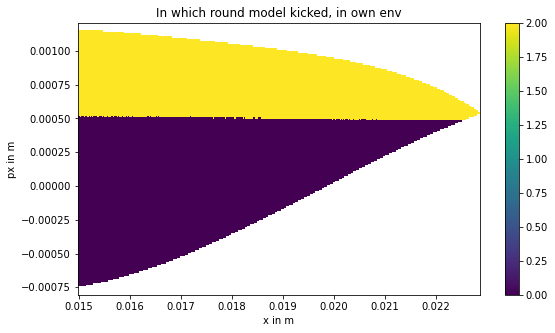

[500.9492018287766, 499.48732587196497, 522.4927197328298, 530.400645511802]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
502.5498448307                                           
 99%|█████████▉| 79/80 [1:03:04<?, ?trial/s, best loss=?]

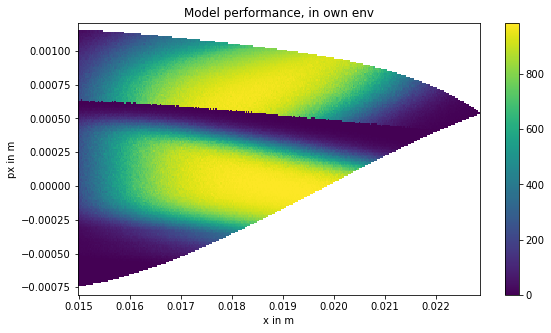

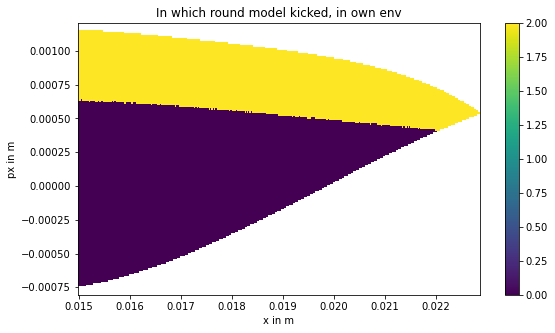

[500.9492018287766, 499.48732587196497, 522.4927197328298, 530.400645511802, 502.5498448307]
100%|██████████| 80/80 [1:03:05<00:00, 3785.02s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 80 trials to 81 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
514.2433592290307                                      
 99%|█████████▉| 80/81 [12:24<?, ?trial/s, best loss=?]

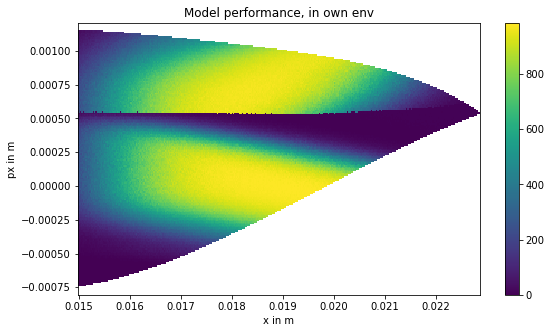

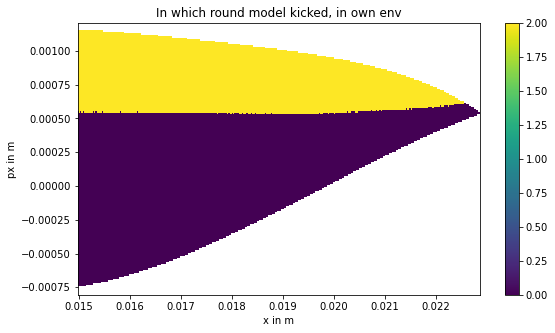

[514.2433592290307]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
540.3989224535121                                      
 99%|█████████▉| 80/81 [25:12<?, ?trial/s, best loss=?]

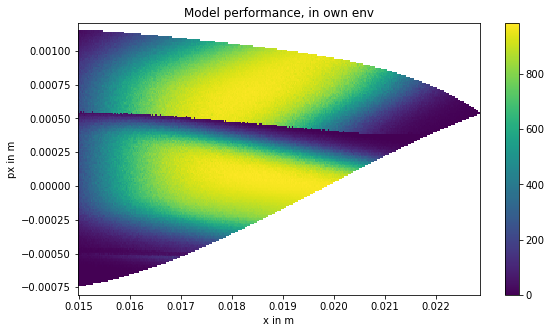

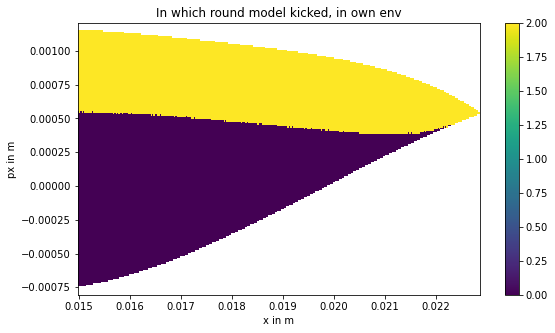

[514.2433592290307, 540.3989224535121]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
492.70106390407                                        
 99%|█████████▉| 80/81 [37:42<?, ?trial/s, best loss=?]

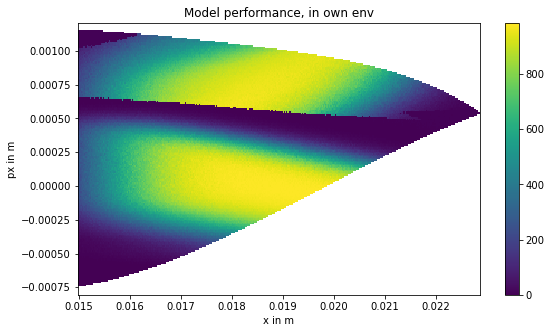

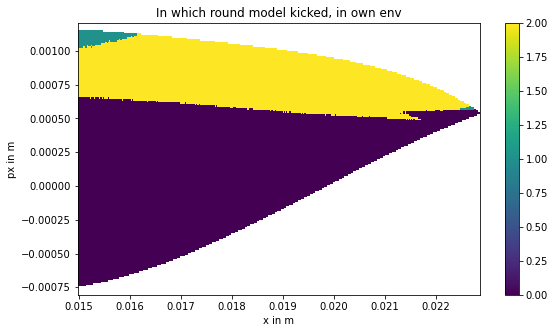

[514.2433592290307, 540.3989224535121, 492.70106390407]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
533.8296171937563                                      
 99%|█████████▉| 80/81 [50:13<?, ?trial/s, best loss=?]

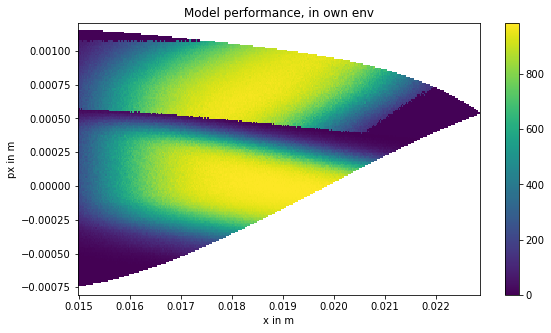

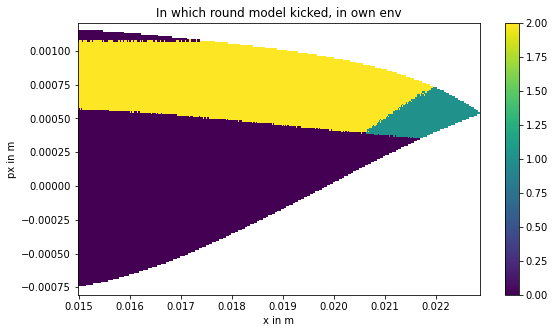

[514.2433592290307, 540.3989224535121, 492.70106390407, 533.8296171937563]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
545.6382351712326                                        
 99%|█████████▉| 80/81 [1:03:01<?, ?trial/s, best loss=?]

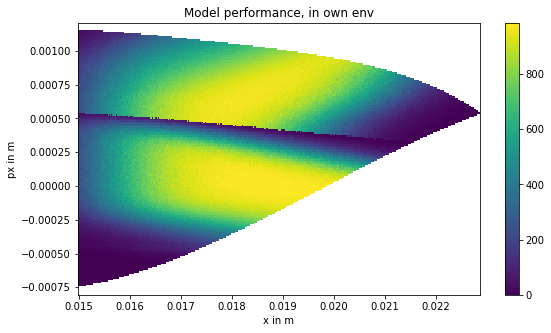

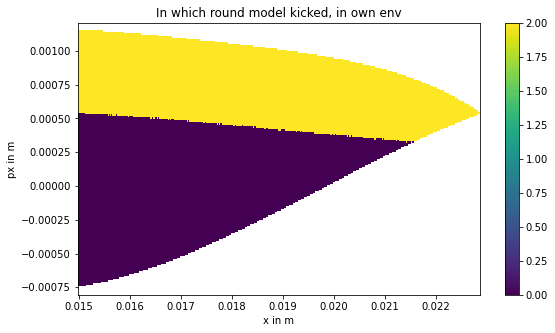

[514.2433592290307, 540.3989224535121, 492.70106390407, 533.8296171937563, 545.6382351712326]
100%|██████████| 81/81 [1:03:02<00:00, 3782.00s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 81 trials to 82 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
273.6074428836818                                      
[273.6074428836818]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
277.81760784298643                     

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-10-cf90a164e674>", line 2, in <module>
    run_trials()
  File "<ipython-input-9-2fb95216c023>", line 21, in run_trials
    best = fmin(fn = objective,
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 540, in fmin
    return trials.fmin(
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/base.py", line 671, in fmin
    return fmin(
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 586, in fmin
    rval.exhaust()
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 364, in exhaust
    self.run(self.max_evals - n_done, block_until_done=self.asynchronous)
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 300, in r

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-10-cf90a164e674>", line 2, in <module>
    run_trials()
  File "<ipython-input-9-2fb95216c023>", line 21, in run_trials
    best = fmin(fn = objective,
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 540, in fmin
    return trials.fmin(
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/base.py", line 671, in fmin
    return fmin(
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 586, in fmin
    rval.exhaust()
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 364, in exhaust
    self.run(self.max_evals - n_done, block_until_done=self.asynchronous)
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 300, in r

In [ ]:
for k in range(300):
    run_trials()

Found saved Trials! Loading...
Rerunning from 83 trials to 84 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
0.0                                                    
[0.0]                                                  
BREAK                                                  
0.0                                                    
50                                                     
100%|██████████| 84/84 [20:38<00:00, 1238.60s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 84 trials to 85 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapp

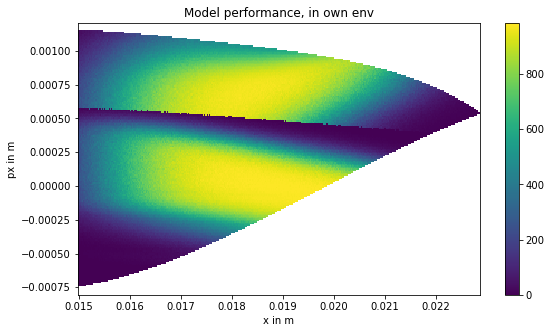

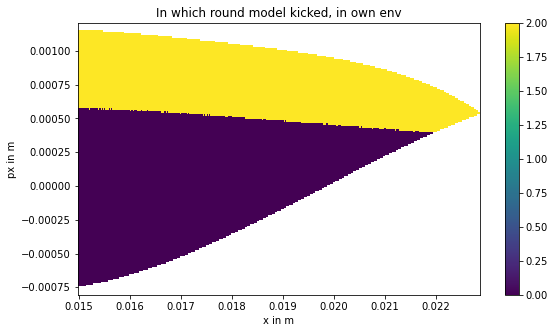

[514.2073581246289]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
546.9706110122713                                      
 99%|█████████▉| 85/86 [25:30<?, ?trial/s, best loss=?]

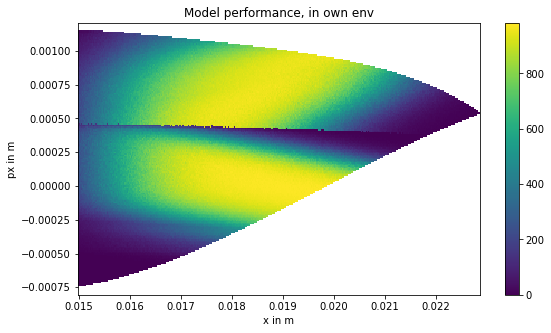

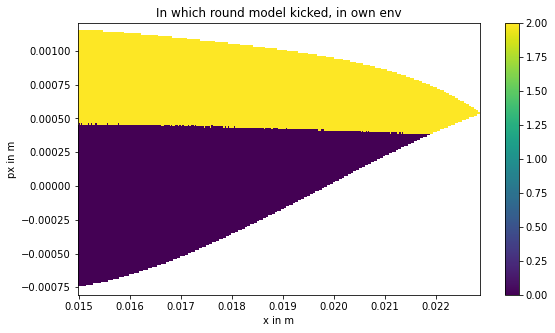

[514.2073581246289, 546.9706110122713]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
517.0596165057251                                      
 99%|█████████▉| 85/86 [38:04<?, ?trial/s, best loss=?]

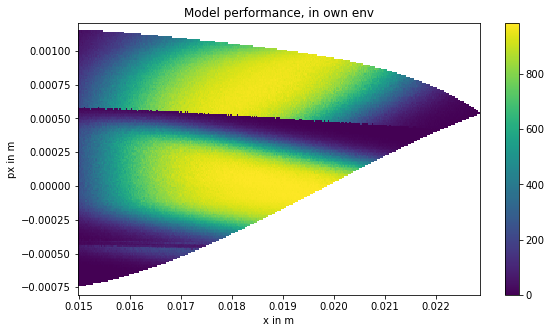

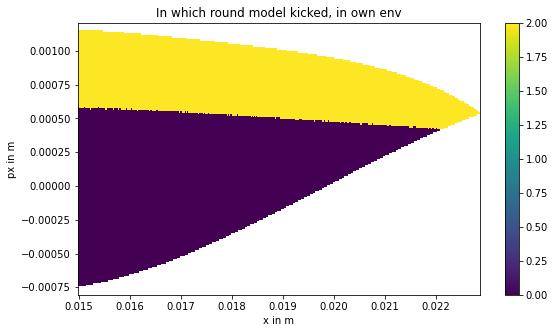

[514.2073581246289, 546.9706110122713, 517.0596165057251]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
561.8447329342777                                      
 99%|█████████▉| 85/86 [51:00<?, ?trial/s, best loss=?]

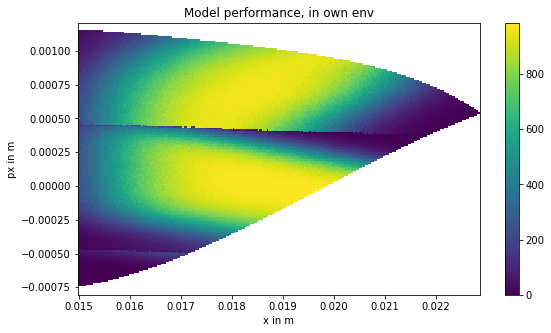

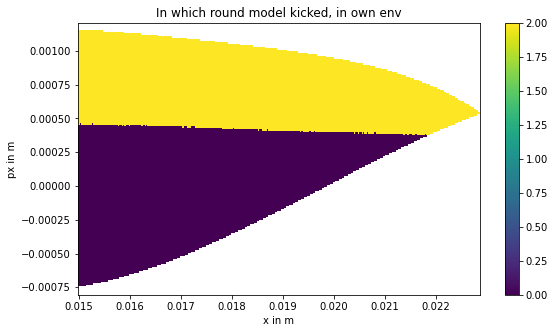

[514.2073581246289, 546.9706110122713, 517.0596165057251, 561.8447329342777]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
7.536181743082832                                        
[514.2073581246289, 546.9706110122713, 517.0596165057251, 561.8447329342777, 7.536181743082832]
100%|██████████| 86/86 [1:02:30<00:00, 3750.74s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 86 trials to 87 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
485.6750174356

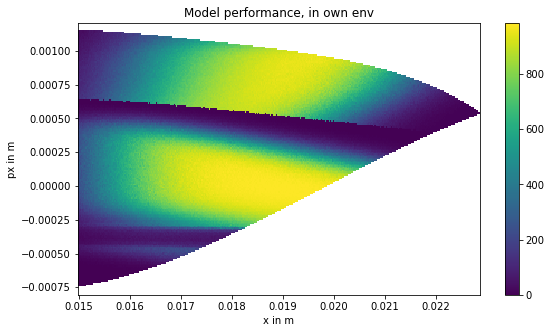

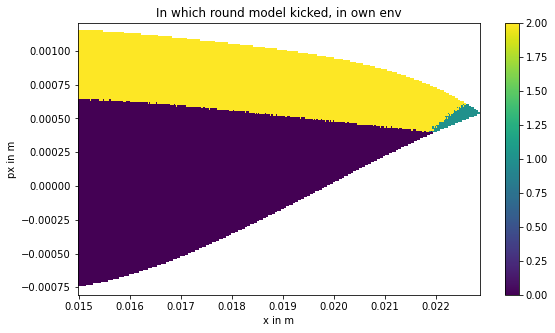

[485.6750174356529]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
461.39161562258533                                     
[485.6750174356529, 461.39161562258533]                
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
271.6869554896595                                      
[485.6750174356529, 461.39161562258533, 271.6869554896595]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
486.4075890184613                            

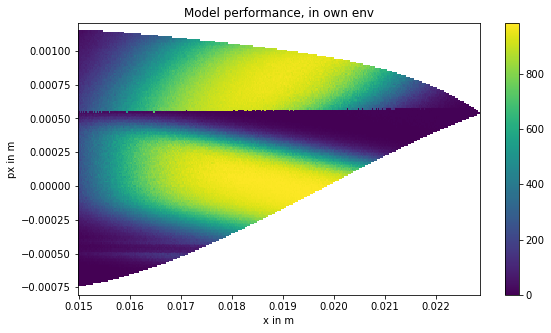

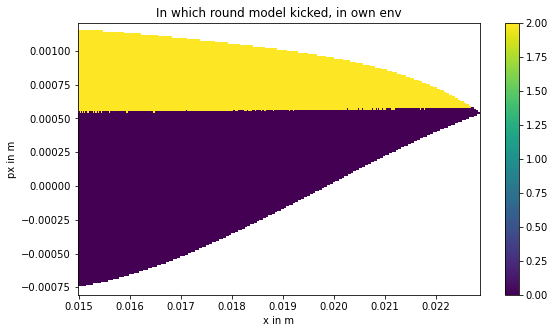

[485.6750174356529, 461.39161562258533, 271.6869554896595, 486.4075890184613]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
270.31668294060466                                       
[485.6750174356529, 461.39161562258533, 271.6869554896595, 486.4075890184613, 270.31668294060466]
100%|██████████| 87/87 [1:00:43<00:00, 3643.17s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 87 trials to 88 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
508.4550161

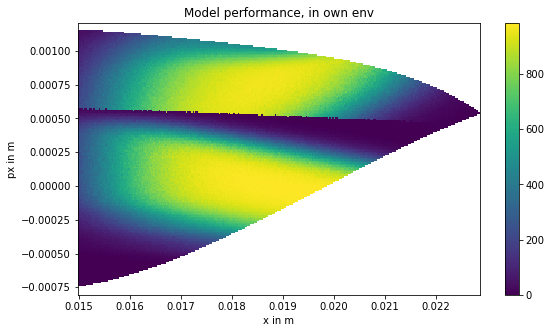

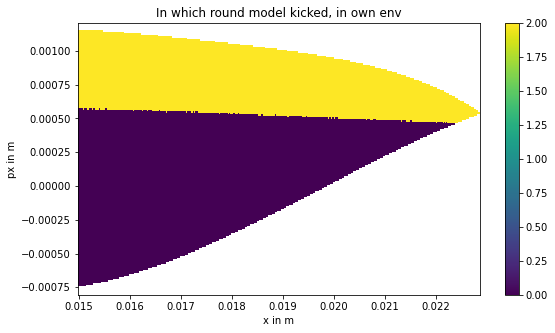

[508.4550161942795]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
485.1727824940031                                      
 99%|█████████▉| 87/88 [25:10<?, ?trial/s, best loss=?]

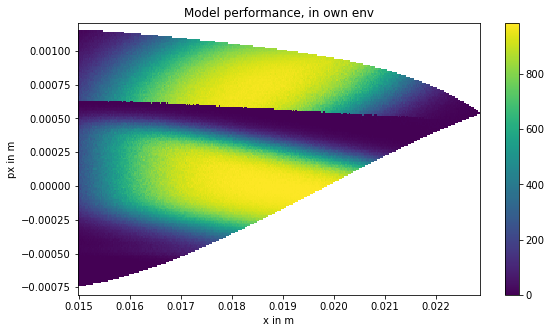

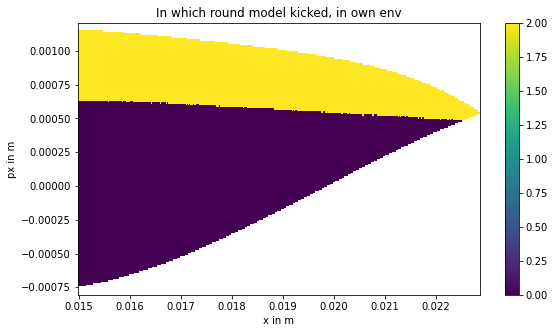

[508.4550161942795, 485.1727824940031]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
479.44273919796905                                     
[508.4550161942795, 485.1727824940031, 479.44273919796905]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
497.2395908420251                                      
 99%|█████████▉| 87/88 [50:17<?, ?trial/s, best loss=?]

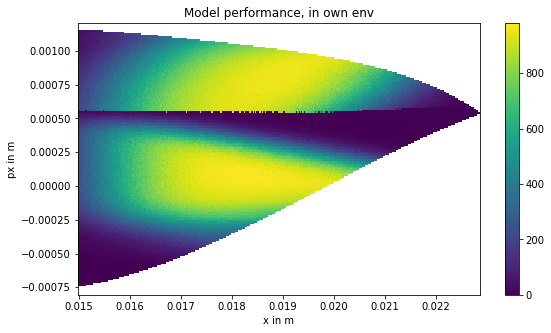

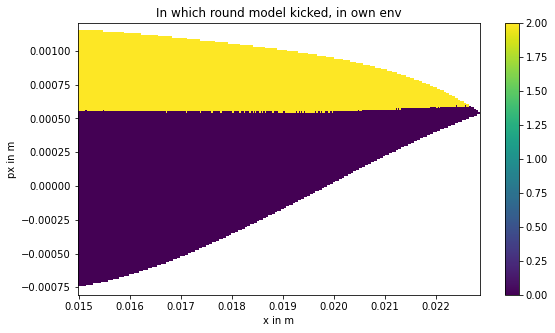

[508.4550161942795, 485.1727824940031, 479.44273919796905, 497.2395908420251]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
484.14851643629635                                       
 99%|█████████▉| 87/88 [1:02:44<?, ?trial/s, best loss=?]

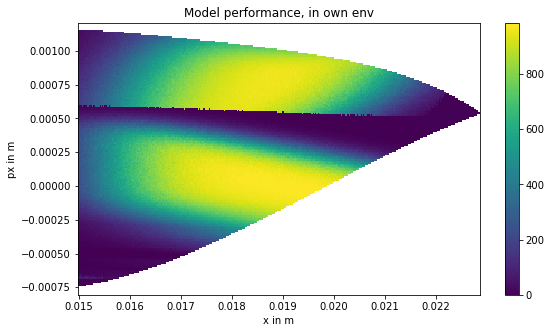

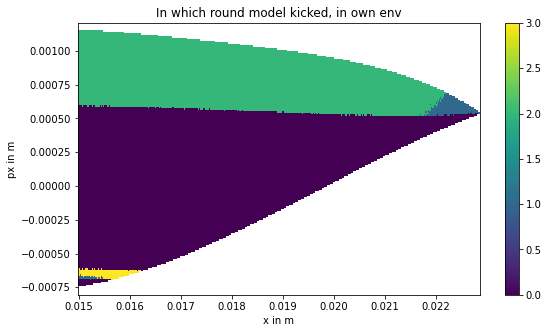

[508.4550161942795, 485.1727824940031, 479.44273919796905, 497.2395908420251, 484.14851643629635]
100%|██████████| 88/88 [1:02:44<00:00, 3764.93s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 88 trials to 89 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
540.2505953642088                                      
 99%|█████████▉| 88/89 [12:49<?, ?trial/s, best loss=?]

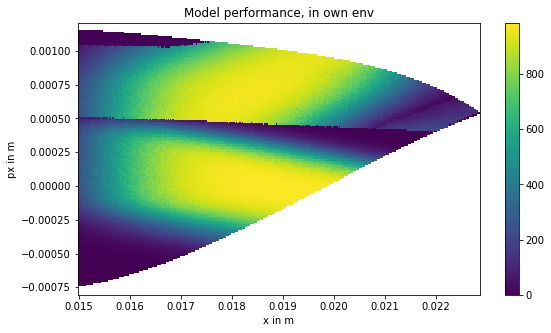

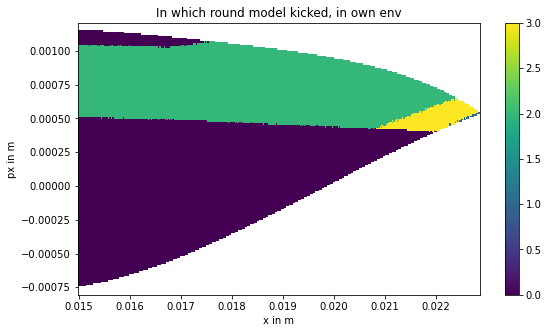

[540.2505953642088]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
501.2574698704435                                      
 99%|█████████▉| 88/89 [25:17<?, ?trial/s, best loss=?]

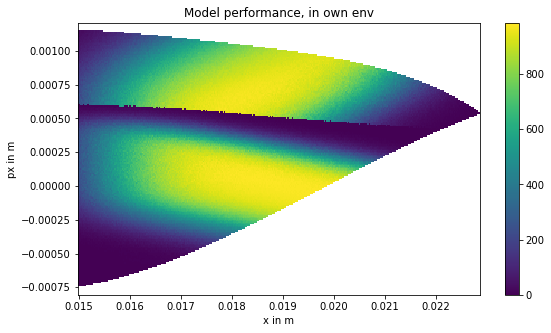

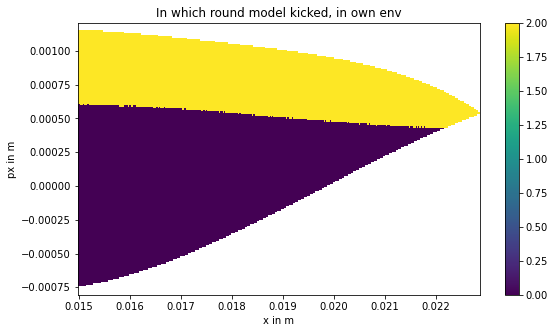

[540.2505953642088, 501.2574698704435]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
560.1441020477573                                      
 99%|█████████▉| 88/89 [38:22<?, ?trial/s, best loss=?]

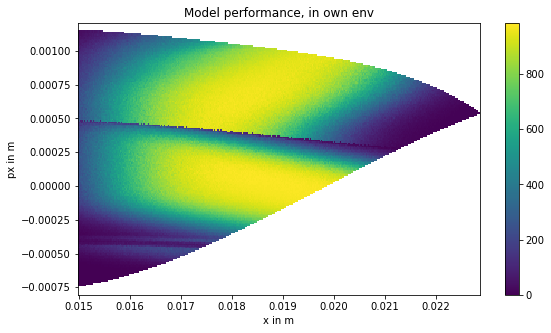

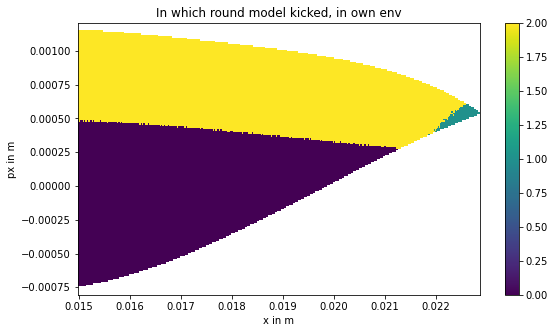

[540.2505953642088, 501.2574698704435, 560.1441020477573]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
542.5053795532402                                      
 99%|█████████▉| 88/89 [51:42<?, ?trial/s, best loss=?]

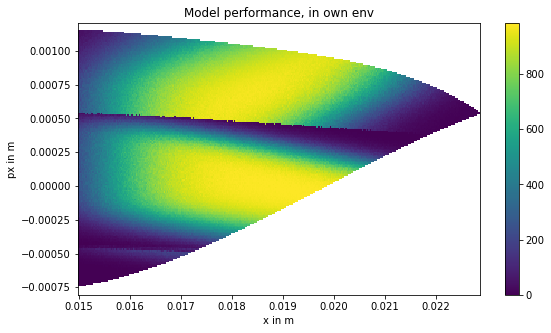

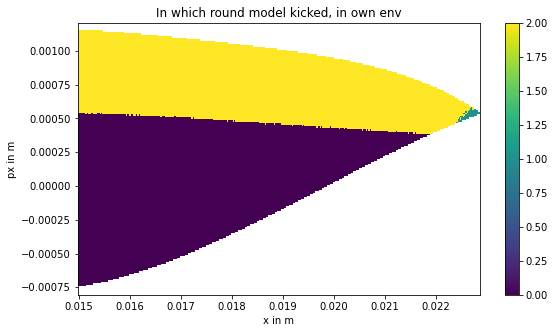

[540.2505953642088, 501.2574698704435, 560.1441020477573, 542.5053795532402]
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
565.5779790452115                                        
 99%|█████████▉| 88/89 [1:04:53<?, ?trial/s, best loss=?]

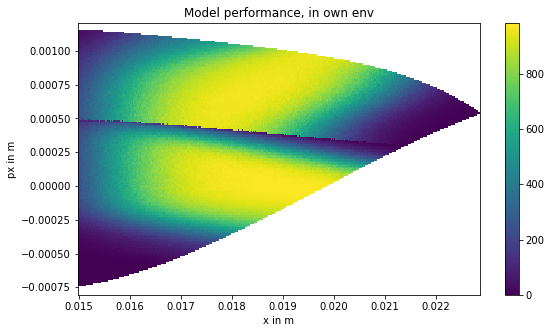

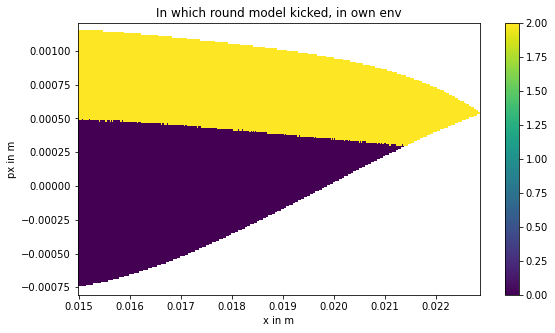

[540.2505953642088, 501.2574698704435, 560.1441020477573, 542.5053795532402, 565.5779790452115]
100%|██████████| 89/89 [1:04:54<00:00, 3894.13s/trial, best loss: -5.538857139490358]
Run: {'batch_size': 5, 'gamma': 0.9222138796384759, 'learning_rate': 0.0019519017425235323, 'learning_starts': 3, 'noise_std': 0.9014856796715315}
Found saved Trials! Loading...
Rerunning from 89 trials to 90 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
 99%|█████████▉| 89/90 [10:25<?, ?trial/s, best loss=?]


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.


KeyboardInterrupt



In [9]:
for k in range(300):
    run_trials()